<a href="https://colab.research.google.com/github/jaiswalgaurav012002/Undergraduate-research-course-/blob/main/UG_RESEARCH_FINAL_IMPLEMENTATION.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install tensorflow

In [2]:
!pip list

Package                          Version
-------------------------------- ---------------------
absl-py                          1.4.0
aiohttp                          3.9.5
aiosignal                        1.3.1
alabaster                        0.7.16
albumentations                   1.3.1
altair                           4.2.2
annotated-types                  0.7.0
anyio                            3.7.1
argon2-cffi                      23.1.0
argon2-cffi-bindings             21.2.0
array_record                     0.5.1
arviz                            0.15.1
astropy                          5.3.4
astunparse                       1.6.3
async-timeout                    4.0.3
atpublic                         4.1.0
attrs                            23.2.0
audioread                        3.0.1
autograd                         1.6.2
Babel                            2.15.0
backcall                         0.2.0
beautifulsoup4                   4.12.3
bidict                           0.23.1

In [3]:
import tensorflow
import keras, pandas, matplotlib, numpy

In [4]:
import os

# Print the contents of the current directory
print(os.listdir())

['.config', 'Airline_Delay_Cause.csv', 'sample_data']


In [5]:
import pandas as pd

# Load the dataset
file_path = '/content/Airline_Delay_Cause.csv'
data = pd.read_csv(file_path)

# Display the first few rows of the dataset and its structure
data.head(), data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 92158 entries, 0 to 92157
Data columns (total 21 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   year                 92158 non-null  int64  
 1   month                92158 non-null  int64  
 2   carrier              92158 non-null  object 
 3   carrier_name         92158 non-null  object 
 4   airport              92158 non-null  object 
 5   airport_name         92158 non-null  object 
 6   arr_flights          91913 non-null  float64
 7   arr_del15            91682 non-null  float64
 8   carrier_ct           91913 non-null  float64
 9   weather_ct           91913 non-null  float64
 10  nas_ct               91913 non-null  float64
 11  security_ct          91913 non-null  float64
 12  late_aircraft_ct     91913 non-null  float64
 13  arr_cancelled        91913 non-null  float64
 14  arr_diverted         91913 non-null  float64
 15  arr_delay            91913 non-null 

(   year  month carrier       carrier_name airport  \
 0  2024      1      9E  Endeavor Air Inc.     ABE   
 1  2024      1      9E  Endeavor Air Inc.     ABY   
 2  2024      1      9E  Endeavor Air Inc.     AEX   
 3  2024      1      9E  Endeavor Air Inc.     AGS   
 4  2024      1      9E  Endeavor Air Inc.     ALB   
 
                                         airport_name  arr_flights  arr_del15  \
 0  Allentown/Bethlehem/Easton, PA: Lehigh Valley ...         80.0       16.0   
 1             Albany, GA: Southwest Georgia Regional          3.0        0.0   
 2           Alexandria, LA: Alexandria International         62.0        9.0   
 3        Augusta, GA: Augusta Regional at Bush Field         74.0       15.0   
 4                   Albany, NY: Albany International        101.0       23.0   
 
    carrier_ct  weather_ct  ...  security_ct  late_aircraft_ct  arr_cancelled  \
 0        4.78        2.56  ...          0.0              6.68            0.0   
 1        0.00        0.

In [6]:
data.head(20)

,year,month,carrier,carrier_name,airport,airport_name,arr_flights,arr_del15,carrier_ct,weather_ct,...,security_ct,late_aircraft_ct,arr_cancelled,arr_diverted,arr_delay,carrier_delay,weather_delay,nas_delay,security_delay,late_aircraft_delay
0,2024,1,9E,Endeavor Air Inc.,ABE,"Allentown/Bethlehem/Easton, PA: Lehigh Valley ...",80.0,16.0,4.78,2.56,...,0.0,6.68,0.0,2.0,1071.0,165.0,326.0,62.0,0.0,518.0
1,2024,1,9E,Endeavor Air Inc.,ABY,"Albany, GA: Southwest Georgia Regional",3.0,0.0,0.00,0.00,...,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2024,1,9E,Endeavor Air Inc.,AEX,"Alexandria, LA: Alexandria International",62.0,9.0,2.20,0.92,...,0.0,4.49,2.0,2.0,589.0,128.0,94.0,93.0,0.0,274.0
3,2024,1,9E,Endeavor Air Inc.,AGS,"Augusta, GA: Augusta Regional at Bush Field",74.0,15.0,6.24,0.00,...,0.0,6.10,1.0,0.0,1285.0,461.0,0.0,106.0,0.0,718.0
4,2024,1,9E,Endeavor Air Inc.,ALB,"Albany, NY: Albany International",101.0,23.0,3.27,1.29,...,0.0,8.75,5.0,0.0,1372.0,148.0,35.0,412.0,0.0,777.0
5,2024,1,9E,Endeavor Air Inc.,ATL,"Atlanta, GA: Hartsfield-Jackson Atlanta Intern...",2511.0,621.0,120.86,28.26,...,0.0,313.87,68.0,12.0,62759.0,14782.0,4772.0,7585.0,0.0,35620.0
6,2024,1,9E,Endeavor Air Inc.,ATW,"Appleton, WI: Appleton International",20.0,1.0,0.00,0.00,...,0.0,1.00,0.0,0.0,84.0,0.0,0.0,0.0,0.0,84.0
7,2024,1,9E,Endeavor Air Inc.,AUS,"Austin, TX: Austin - Bergstrom International",47.0,15.0,4.02,0.00,...,0.0,1.00,1.0,1.0,791.0,204.0,0.0,459.0,0.0,128.0
8,2024,1,9E,Endeavor Air Inc.,AVL,"Asheville, NC: Asheville Regional",48.0,9.0,3.33,0.00,...,0.0,0.80,0.0,0.0,391.0,70.0,0.0,192.0,0.0,129.0
9,2024,1,9E,Endeavor Air Inc.,AZO,"Kalamazoo, MI: Kalamazoo/Battle Creek Internat...",13.0,2.0,0.00,0.00,...,0.0,0.00,0.0,0.0,48.0,0.0,0.0,48.0,0.0,0.0


In [7]:
data.tail(20)

,year,month,carrier,carrier_name,airport,airport_name,arr_flights,arr_del15,carrier_ct,weather_ct,...,security_ct,late_aircraft_ct,arr_cancelled,arr_diverted,arr_delay,carrier_delay,weather_delay,nas_delay,security_delay,late_aircraft_delay
92138,2020,1,ZW,Air Wisconsin Airlines Corp,ORF,"Norfolk, VA: Norfolk International",90.0,14.0,2.35,1.28,...,0.0,6.29,1.0,0.0,1275.0,159.0,173.0,152.0,0.0,791.0
92139,2020,1,ZW,Air Wisconsin Airlines Corp,PIA,"Peoria, IL: General Downing - Peoria Internati...",59.0,11.0,2.83,0.00,...,0.0,5.95,3.0,0.0,1443.0,703.0,0.0,90.0,0.0,650.0
92140,2020,1,ZW,Air Wisconsin Airlines Corp,PIT,"Pittsburgh, PA: Pittsburgh International",19.0,3.0,0.13,0.02,...,0.0,2.32,2.0,0.0,360.0,10.0,5.0,41.0,0.0,304.0
92141,2020,1,ZW,Air Wisconsin Airlines Corp,PVD,"Providence, RI: Theodore Francis Green State",43.0,2.0,1.06,0.00,...,0.0,0.94,0.0,0.0,215.0,31.0,0.0,0.0,0.0,184.0
92142,2020,1,ZW,Air Wisconsin Airlines Corp,PWM,"Portland, ME: Portland International Jetport",8.0,2.0,0.93,0.00,...,0.0,0.00,0.0,0.0,75.0,51.0,0.0,24.0,0.0,0.0
92143,2020,1,ZW,Air Wisconsin Airlines Corp,RAP,"Rapid City, SD: Rapid City Regional",5.0,1.0,0.00,0.00,...,0.0,1.00,0.0,0.0,21.0,0.0,0.0,0.0,0.0,21.0
92144,2020,1,ZW,Air Wisconsin Airlines Corp,RDU,"Raleigh/Durham, NC: Raleigh-Durham International",17.0,4.0,2.52,0.08,...,0.0,0.92,1.0,0.0,305.0,158.0,10.0,19.0,0.0,118.0
92145,2020,1,ZW,Air Wisconsin Airlines Corp,RIC,"Richmond, VA: Richmond International",94.0,8.0,2.61,0.00,...,0.0,4.13,2.0,0.0,485.0,178.0,0.0,72.0,0.0,235.0
92146,2020,1,ZW,Air Wisconsin Airlines Corp,ROA,"Roanoke, VA: Roanoke Blacksburg Regional Woodr...",66.0,9.0,4.85,0.23,...,0.0,1.00,1.0,0.0,1414.0,1134.0,14.0,141.0,0.0,125.0
92147,2020,1,ZW,Air Wisconsin Airlines Corp,ROC,"Rochester, NY: Greater Rochester International",74.0,10.0,1.52,1.24,...,0.0,3.57,0.0,0.0,549.0,92.0,143.0,156.0,0.0,158.0


In [8]:
# Display basic statistics
data.describe()


,year,month,arr_flights,arr_del15,carrier_ct,weather_ct,nas_ct,security_ct,late_aircraft_ct,arr_cancelled,arr_diverted,arr_delay,carrier_delay,weather_delay,nas_delay,security_delay,late_aircraft_delay
count,92158.000000,92158.000000,91913.000000,91682.000000,91913.000000,91913.000000,91913.000000,91913.000000,91913.000000,91913.000000,91913.000000,91913.000000,91913.000000,91913.000000,91913.000000,91913.000000,91913.000000
mean,2021.564476,6.340198,285.149435,49.763672,17.899343,1.933275,12.894526,0.170016,16.741437,7.812616,0.647243,3371.915409,1295.114772,206.173871,595.319541,7.873435,1267.407733
std,1.155435,3.523392,831.834924,151.440798,49.627942,7.245616,44.811862,0.836076,60.189543,52.906699,2.988240,11485.646408,4391.211466,852.790402,2330.617098,45.986051,4823.919834
min,2020.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2021.000000,3.000000,32.000000,4.000000,1.450000,0.000000,0.340000,0.000000,0.650000,0.000000,0.000000,212.000000,67.000000,0.000000,13.000000,0.000000,20.000000
50%,2022.000000,6.000000,78.000000,12.000000,4.620000,0.040000,2.400000,0.000000,2.940000,1.000000,0.000000,704.000000,260.000000,3.000000,89.000000,0.000000,188.000000
75%,2023.000000,9.000000,186.000000,32.000000,13.230000,1.430000,7.570000,0.000000,9.510000,3.000000,0.000000,2105.000000,881.000000,117.000000,303.000000,0.000000,724.000000
max,2024.000000,12.000000,20669.000000,4142.000000,1293.910000,266.420000,1391.740000,58.690000,2069.070000,4951.000000,154.000000,438783.000000,162563.000000,29299.000000,84155.000000,3760.000000,227959.000000


In [9]:
# Check for missing values
data.isnull().sum()

year                     0
month                    0
carrier                  0
carrier_name             0
airport                  0
airport_name             0
arr_flights            245
arr_del15              476
carrier_ct             245
weather_ct             245
nas_ct                 245
security_ct            245
late_aircraft_ct       245
arr_cancelled          245
arr_diverted           245
arr_delay              245
carrier_delay          245
weather_delay          245
nas_delay              245
security_delay         245
late_aircraft_delay    245
dtype: int64

In [10]:
# Impute missing values with zero for each column in 'data'
for column in data.columns:
    if data[column].isnull().sum() > 0:  # only apply to columns with missing values
        data[column].fillna(0, inplace=True)

# Verify that there are no more missing values
missing_values_after_imputation = data.isnull().sum()
missing_values_after_imputation


year                   0
month                  0
carrier                0
carrier_name           0
airport                0
airport_name           0
arr_flights            0
arr_del15              0
carrier_ct             0
weather_ct             0
nas_ct                 0
security_ct            0
late_aircraft_ct       0
arr_cancelled          0
arr_diverted           0
arr_delay              0
carrier_delay          0
weather_delay          0
nas_delay              0
security_delay         0
late_aircraft_delay    0
dtype: int64

In [11]:
data.isnull().sum()


year                   0
month                  0
carrier                0
carrier_name           0
airport                0
airport_name           0
arr_flights            0
arr_del15              0
carrier_ct             0
weather_ct             0
nas_ct                 0
security_ct            0
late_aircraft_ct       0
arr_cancelled          0
arr_diverted           0
arr_delay              0
carrier_delay          0
weather_delay          0
nas_delay              0
security_delay         0
late_aircraft_delay    0
dtype: int64

In [12]:
data.describe()


,year,month,arr_flights,arr_del15,carrier_ct,weather_ct,nas_ct,security_ct,late_aircraft_ct,arr_cancelled,arr_diverted,arr_delay,carrier_delay,weather_delay,nas_delay,security_delay,late_aircraft_delay
count,92158.000000,92158.000000,92158.000000,92158.000000,92158.000000,92158.000000,92158.000000,92158.000000,92158.000000,92158.000000,92158.000000,92158.000000,92158.000000,92158.000000,92158.000000,92158.000000,92158.000000
mean,2021.564476,6.340198,284.391371,49.506641,17.851758,1.928136,12.860246,0.169564,16.696930,7.791847,0.645522,3362.951247,1291.671738,205.625762,593.736898,7.852503,1264.038358
std,1.155435,3.523392,830.858217,151.091304,49.570499,7.236663,44.757181,0.835010,60.115663,52.837857,2.984452,11471.682936,4385.877582,851.722239,2327.718912,45.926673,4817.945375
min,2020.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2021.000000,3.000000,32.000000,4.000000,1.420000,0.000000,0.320000,0.000000,0.630000,0.000000,0.000000,209.000000,66.000000,0.000000,13.000000,0.000000,20.000000
50%,2022.000000,6.000000,78.000000,12.000000,4.590000,0.030000,2.385000,0.000000,2.920000,1.000000,0.000000,700.000000,259.000000,2.000000,88.000000,0.000000,186.000000
75%,2023.000000,9.000000,186.000000,32.000000,13.180000,1.420000,7.530000,0.000000,9.477500,3.000000,0.000000,2098.000000,877.000000,116.000000,302.000000,0.000000,720.000000
max,2024.000000,12.000000,20669.000000,4142.000000,1293.910000,266.420000,1391.740000,58.690000,2069.070000,4951.000000,154.000000,438783.000000,162563.000000,29299.000000,84155.000000,3760.000000,227959.000000


In [13]:
!pip install numpy
import numpy as np

import pandas as pd

# Set display options to not use scientific notation
pd.set_option('display.float_format', lambda x: '%.2f' % x)

# Calculate the sum of each numeric column in the dataset
column_sums = data.select_dtypes(include=[np.number]).sum()

# Print the sums for each column
print(column_sums)

year                  186303339.00
month                    584300.00
arr_flights            26208940.00
arr_del15               4562433.00
carrier_ct              1645182.33
weather_ct               177693.12
nas_ct                  1185174.53
security_ct               15626.70
late_aircraft_ct        1538755.72
arr_cancelled            718081.00
arr_diverted              59490.00
arr_delay             309922861.00
carrier_delay         119037884.00
weather_delay          18950059.00
nas_delay              54717605.00
security_delay           723671.00
late_aircraft_delay   116491247.00
dtype: float64


In [14]:
import pandas as pd

# Assuming you have loaded your data into a DataFrame called `data`
print("Summary Statistics for arr_flights and arr_del15:")
print(data[['arr_flights', 'arr_del15']].describe())

# Check for any negative values or anomalies
print("\nCheck for negative or zero values in arr_flights:")
print(data[data['arr_flights'] <= 0])

print("\nCheck for negative values in arr_del15:")
print(data[data['arr_del15'] < 0])

# Recalculate the on_time_flights to verify the counts
data['on_time_flights'] = data['arr_flights'] - data['arr_del15']
print("\nRecalculated On-Time Flights:")
print(data['on_time_flights'].describe())

# Check if the total number of on-time flights matches the expected number
total_on_time_flights = data['on_time_flights'].sum()
print(f"\nTotal recalculated on-time flights: {total_on_time_flights}")


Summary Statistics for arr_flights and arr_del15:
       arr_flights  arr_del15
count     92158.00   92158.00
mean        284.39      49.51
std         830.86     151.09
min           0.00       0.00
25%          32.00       4.00
50%          78.00      12.00
75%         186.00      32.00
max       20669.00    4142.00

Check for negative or zero values in arr_flights:
       year  month carrier                             carrier_name airport  \
534    2024      1      NK                          Spirit Airlines     LFT   
689    2024      1      OO                    SkyWest Airlines Inc.     BPT   
1569   2024      1      G7  GoJet Airlines LLC d/b/a United Express     CAK   
2676   2023     12      UA                 United Air Lines Network     BHM   
3151   2023     12      G7  GoJet Airlines LLC d/b/a United Express     SBN   
...     ...    ...     ...                                      ...     ...   
87458  2020      3      YV                       Mesa Airlines Inc.     HRL 

In [15]:
# Assuming 'data' is your pandas DataFrame
shape_of_dataset = data.shape

# Print the shape
print("Shape of the dataset:", shape_of_dataset)

Shape of the dataset: (92158, 22)


In [16]:
!pip install matplotlib


In [17]:
import matplotlib
print(matplotlib.__version__)


3.7.1


   year  month carrier       carrier_name airport  \
0  2024      1      9E  Endeavor Air Inc.     ABE   
1  2024      1      9E  Endeavor Air Inc.     ABY   
2  2024      1      9E  Endeavor Air Inc.     AEX   
3  2024      1      9E  Endeavor Air Inc.     AGS   
4  2024      1      9E  Endeavor Air Inc.     ALB   

                                        airport_name  arr_flights  arr_del15  \
0  Allentown/Bethlehem/Easton, PA: Lehigh Valley ...        80.00      16.00   
1             Albany, GA: Southwest Georgia Regional         3.00       0.00   
2           Alexandria, LA: Alexandria International        62.00       9.00   
3        Augusta, GA: Augusta Regional at Bush Field        74.00      15.00   
4                   Albany, NY: Albany International       101.00      23.00   

   carrier_ct  weather_ct  ...  security_ct  late_aircraft_ct  arr_cancelled  \
0        4.78        2.56  ...         0.00              6.68           0.00   
1        0.00        0.00  ...         0

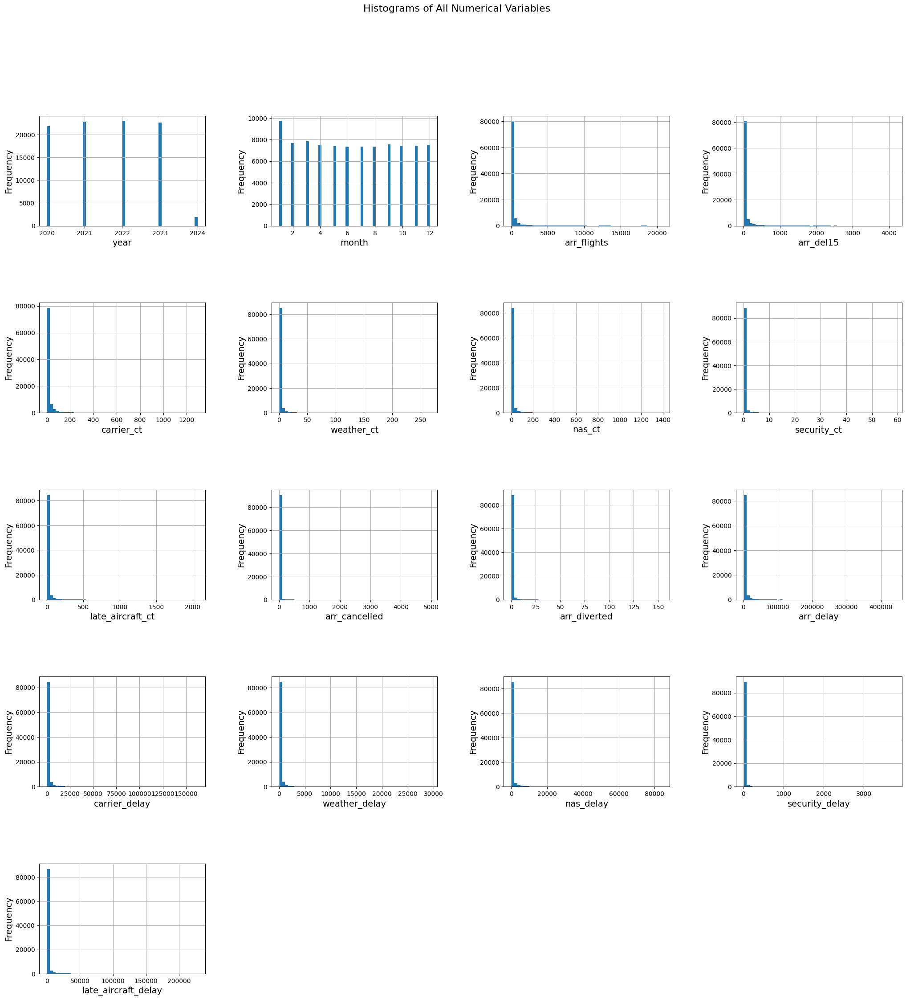

In [18]:
import matplotlib.pyplot as plt
import pandas as pd

# Load the dataset into a DataFrame
data = pd.read_csv('/content/Airline_Delay_Cause.csv')

# Check the first few rows to ensure the data is loaded correctly
print(data.head())

# Plotting histograms for all numerical data, with increased figure size for better visibility
data.hist(bins=50, figsize=(25, 25))  # Increased figure size
plt.subplots_adjust(hspace=0.7, wspace=0.4)  # Adjust spacing to prevent label overlap
plt.suptitle('Histograms of All Numerical Variables', size=16)
for ax in plt.gcf().axes:  # Loop through all axes to label them
    ax.set_xlabel(ax.get_title(), fontsize=14)
    ax.set_ylabel('Frequency', fontsize=14)
    ax.set_title('')  # Clear the default title
plt.show()


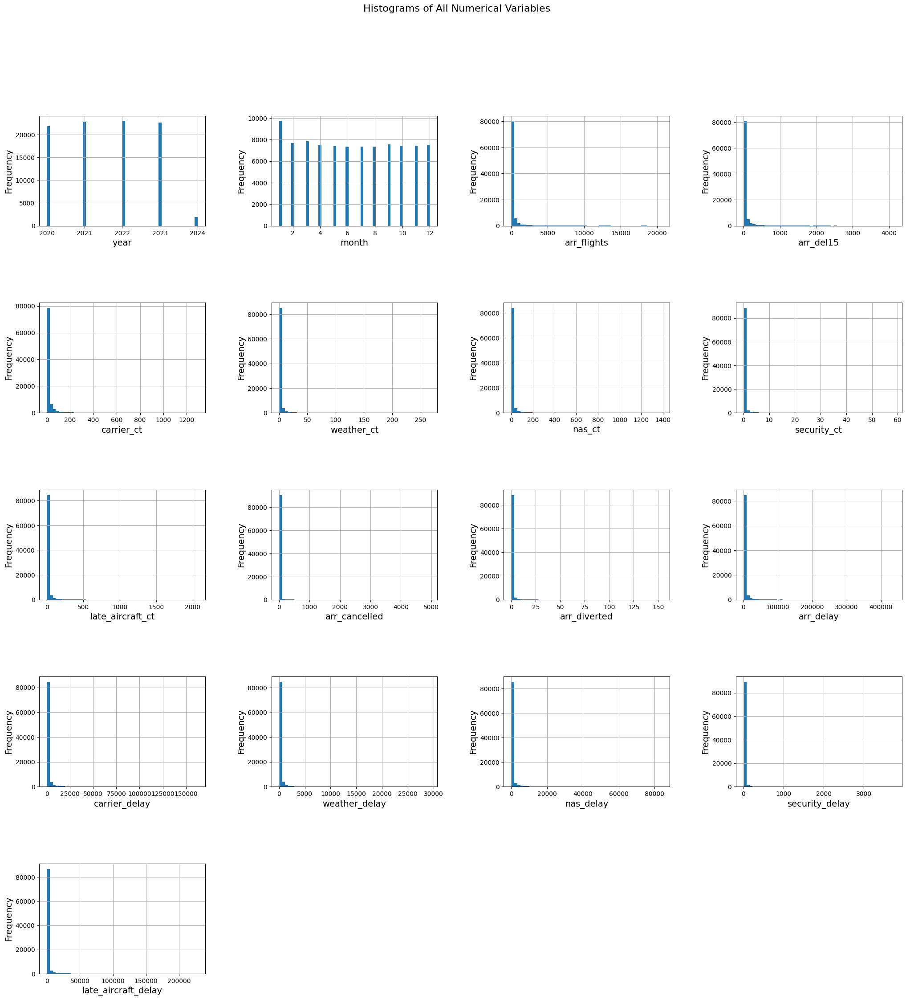

In [19]:
import matplotlib.pyplot as plt

# Histograms for all numerical data, with increased figure size for better visibility
data.hist(bins=50, figsize=(25, 25))  # Increased figure size
plt.subplots_adjust(hspace=0.7, wspace=0.4)  # Adjust spacing to prevent label overlap
plt.suptitle('Histograms of All Numerical Variables', size=16)
for ax in plt.gcf().axes:  # Loop through all axes to label them
    ax.set_xlabel(ax.get_title(), fontsize=14)
    ax.set_ylabel('Frequency', fontsize=14)
    ax.set_title('')  # Clear the default title
plt.show()

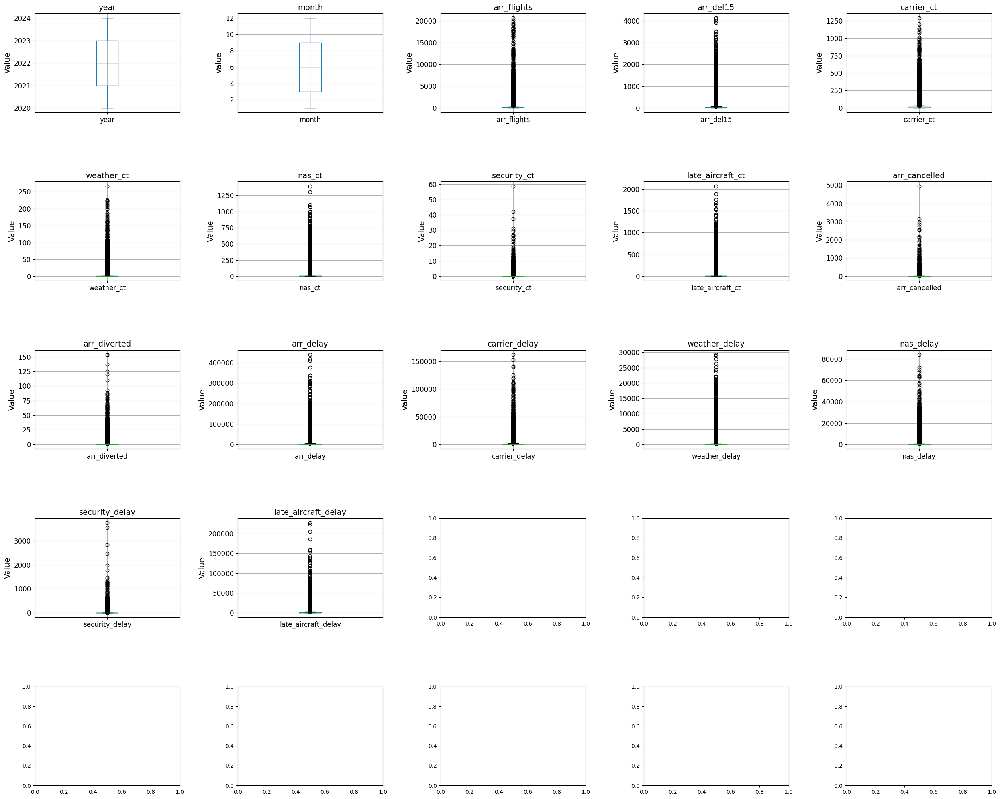

In [20]:
# Box plots to check for outliers, with adjusted sizes for better readability
fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(25, 20))  # Adjust layout based on number of variables and figure size
axs = axs.flatten()  # Flatten to 1D array for easy iteration
for i, col in enumerate(data.select_dtypes(include=['float64', 'int64']).columns):
    data.boxplot(column=col, ax=axs[i], fontsize=12)
    axs[i].set_title(col, fontsize=14)
    axs[i].set_xlabel('')
    axs[i].set_ylabel('Value', fontsize=14)
plt.tight_layout()
plt.subplots_adjust(hspace=0.7, wspace=0.4)
plt.show()

In [21]:
# Check columns in the dataset that contain 'delay' in their name
delay_columns = [col for col in data.columns if 'delay' in col]
print("Delay-related columns in the dataset:", delay_columns)


Delay-related columns in the dataset: ['arr_delay', 'carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay']


In [22]:
# Summing up each type of delay across all records
total_carrier_delay = data['carrier_delay'].sum()
total_weather_delay = data['weather_delay'].sum()
total_nas_delay = data['nas_delay'].sum()
total_security_delay = data['security_delay'].sum()
total_late_aircraft_delay = data['late_aircraft_delay'].sum()

# Calculating the overall total delay from the specific types
total_specific_delays = (total_carrier_delay +
                         total_weather_delay +
                         total_nas_delay +
                         total_security_delay +
                         total_late_aircraft_delay)

# Printing the results
print(f"Total Carrier Delay: {total_carrier_delay} minutes")
print(f"Total Weather Delay: {total_weather_delay} minutes")
print(f"Total NAS Delay: {total_nas_delay} minutes")
print(f"Total Security Delay: {total_security_delay} minutes")
print(f"Total Late Aircraft Delay: {total_late_aircraft_delay} minutes")
print(f"Overall Total Specific Delays: {total_specific_delays} minutes")

# If you need the total of 'arr_delay' as well to compare
total_arr_delay = data['arr_delay'].sum()
print(f"Total Arrival Delay: {total_arr_delay} minutes")

Total Carrier Delay: 119037884.0 minutes
Total Weather Delay: 18950059.0 minutes
Total NAS Delay: 54717605.0 minutes
Total Security Delay: 723671.0 minutes
Total Late Aircraft Delay: 116491247.0 minutes
Overall Total Specific Delays: 309920466.0 minutes
Total Arrival Delay: 309922861.0 minutes


In [23]:
import pandas as pd

# Calculate the sum of specific delay types for each record
data['calculated_delay'] = data[['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay']].sum(axis=1)

# Filter to find instances where the sum of specific delays exceeds the total reported arrival delay
overlapping_delays = data[data['calculated_delay'] > data['arr_delay']]

# Display these instances to investigate further
overlapping_delays[['arr_delay', 'carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay', 'calculated_delay']]

,arr_delay,carrier_delay,weather_delay,nas_delay,security_delay,late_aircraft_delay,calculated_delay


In [24]:
# Count of overlapping instances
count_overlaps = overlapping_delays.shape[0]

# Percentage of overlapping instances compared to total records
percentage_overlaps = (count_overlaps / data.shape[0]) * 100

print(f"Count of overlapping delay instances: {count_overlaps}")
print(f"Percentage of overlapping delay instances: {percentage_overlaps:.2f}%")

Count of overlapping delay instances: 0
Percentage of overlapping delay instances: 0.00%


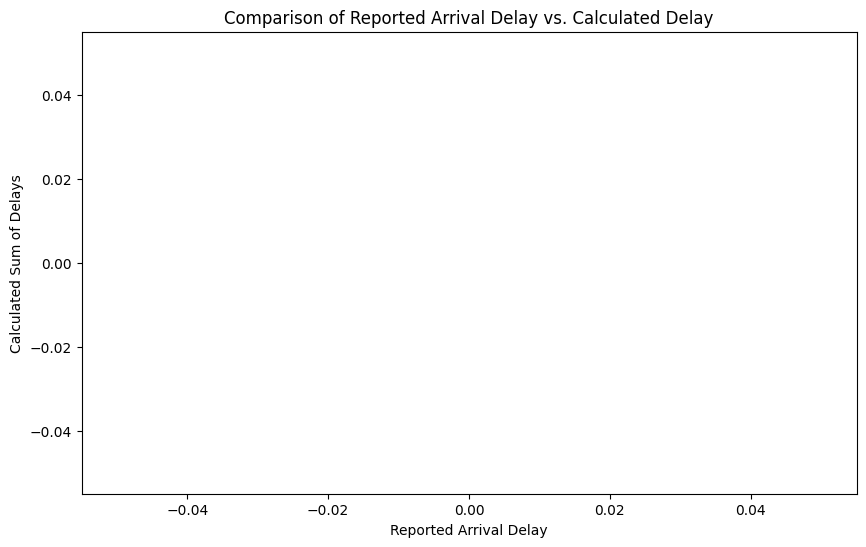

In [25]:
import matplotlib.pyplot as plt

# Plotting examples where overlaps occur
plt.figure(figsize=(10, 6))
plt.scatter(overlapping_delays['arr_delay'], overlapping_delays['calculated_delay'], alpha=0.5)
plt.title('Comparison of Reported Arrival Delay vs. Calculated Delay')
plt.xlabel('Reported Arrival Delay')
plt.ylabel('Calculated Sum of Delays')
plt.plot([0, max(overlapping_delays['arr_delay'].max(), overlapping_delays['calculated_delay'].max())],
         [0, max(overlapping_delays['arr_delay'].max(), overlapping_delays['calculated_delay'].max())],
         'r--')  # Adding a reference line
plt.show()

In [26]:
import pandas as pd

# Assuming 'data' is your DataFrame containing the delay data

# Calculate the sum of specific types of delays for each record
data['calculated_delay'] = data[['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay']].sum(axis=1)

# Calculate total values for both 'arr_delay' and 'calculated_delay' across all records
total_arr_delay = data['arr_delay'].sum()
total_calculated_delay = data['calculated_delay'].sum()

# Display the total delays calculated and reported
print(f"Total Reported Arrival Delay (arr_delay): {total_arr_delay} minutes")
print(f"Total Calculated Delay (sum of specific delays): {total_calculated_delay} minutes")

# Calculate and display the difference
difference = total_arr_delay - total_calculated_delay
print(f"Difference between reported and calculated delays: {difference} minutes")

Total Reported Arrival Delay (arr_delay): 309922861.0 minutes
Total Calculated Delay (sum of specific delays): 309920466.0 minutes
Difference between reported and calculated delays: 2395.0 minutes


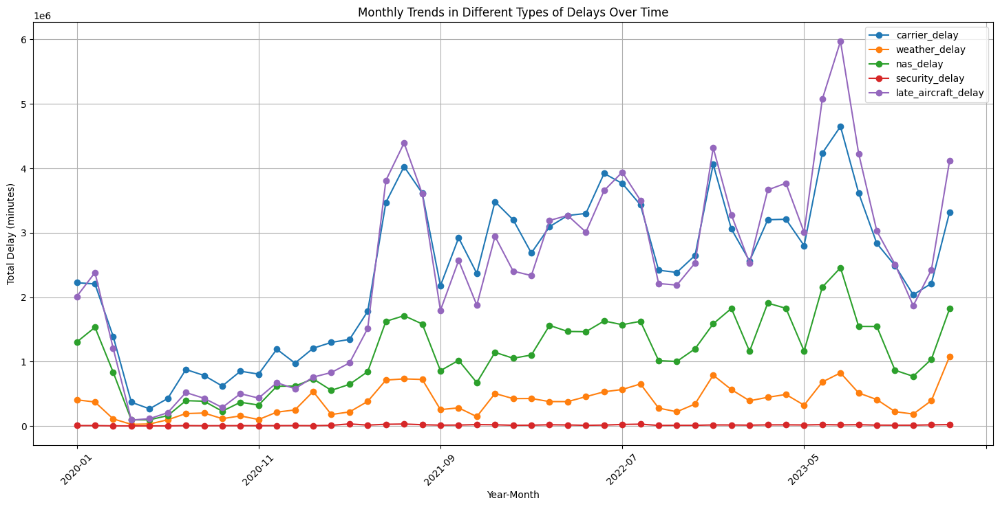

In [27]:
import matplotlib.pyplot as plt

# Creating a 'year_month' column for grouping
data['year_month'] = data['year'].astype(str) + '-' + data['month'].astype(str).str.zfill(2)

# Grouping data by 'year_month'
monthly_delays = data.groupby('year_month')[['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay']].sum()

# Plotting trends for each type of delay
monthly_delays.plot(figsize=(18, 8), marker='o', title='Monthly Trends in Different Types of Delays Over Time')
plt.xlabel('Year-Month')
plt.ylabel('Total Delay (minutes)')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()


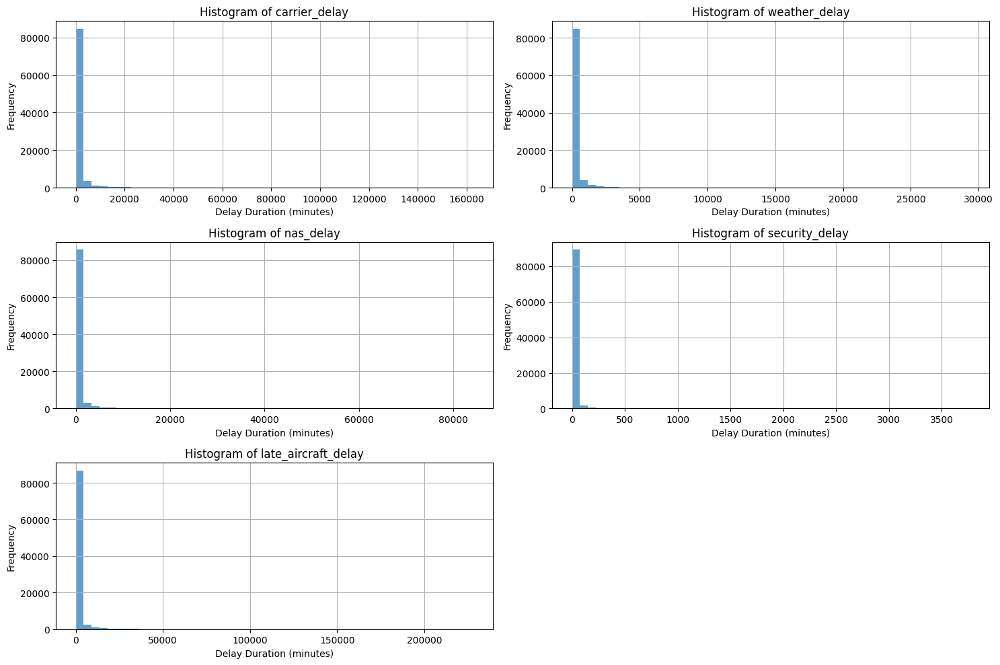

In [28]:
import matplotlib.pyplot as plt

# List of delay types
delay_types = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay']

# Setting up the figure size and number of subplots
plt.figure(figsize=(15, 10))

for i, delay_type in enumerate(delay_types, 1):
    plt.subplot(3, 2, i)  # Adjust grid definition dynamically
    data[delay_type].hist(bins=50, alpha=0.7)
    plt.title(f'Histogram of {delay_type}')
    plt.xlabel('Delay Duration (minutes)')
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


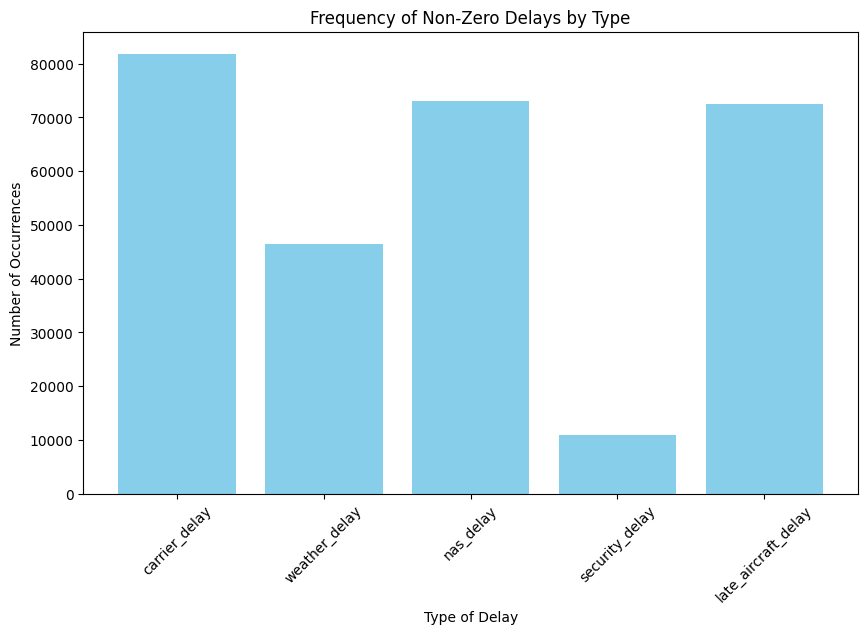

In [29]:
# Calculating the frequency of non-zero delays for each type
delay_frequencies = {delay_type: (data[delay_type] > 0).sum() for delay_type in delay_types}

# Creating bar chart
plt.figure(figsize=(10, 6))
plt.bar(delay_frequencies.keys(), delay_frequencies.values(), color='skyblue')
plt.title('Frequency of Non-Zero Delays by Type')
plt.xlabel('Type of Delay')
plt.ylabel('Number of Occurrences')
plt.xticks(rotation=45)
plt.show()


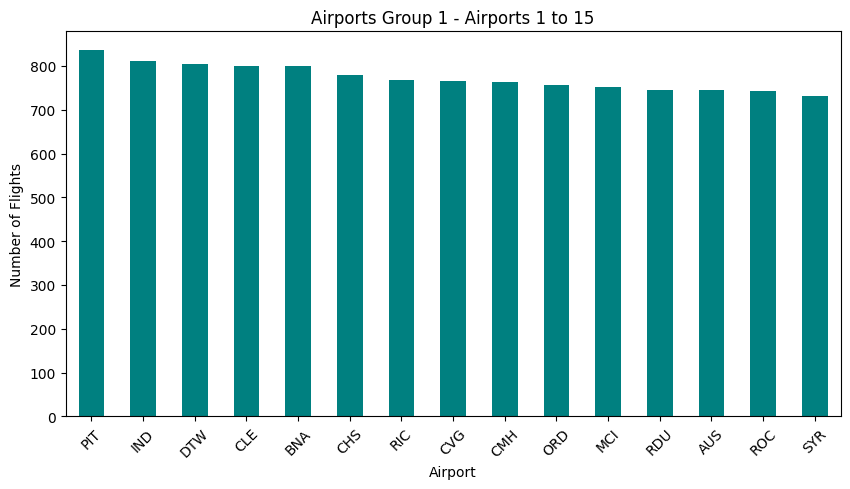

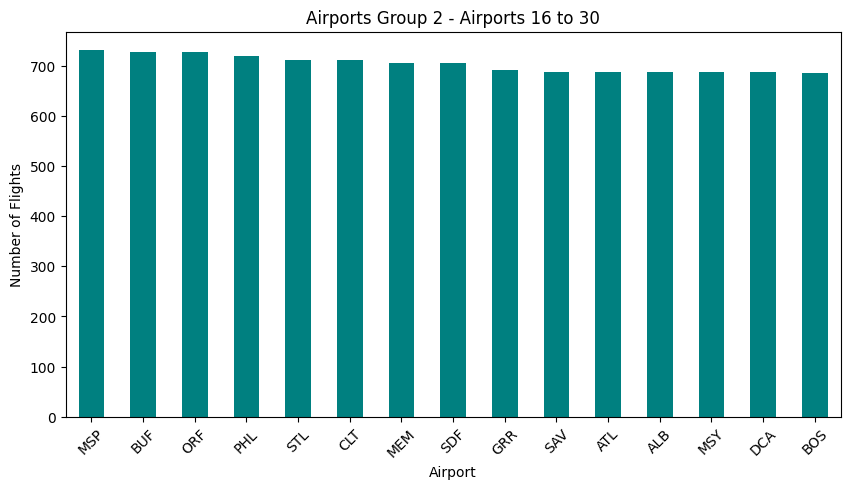

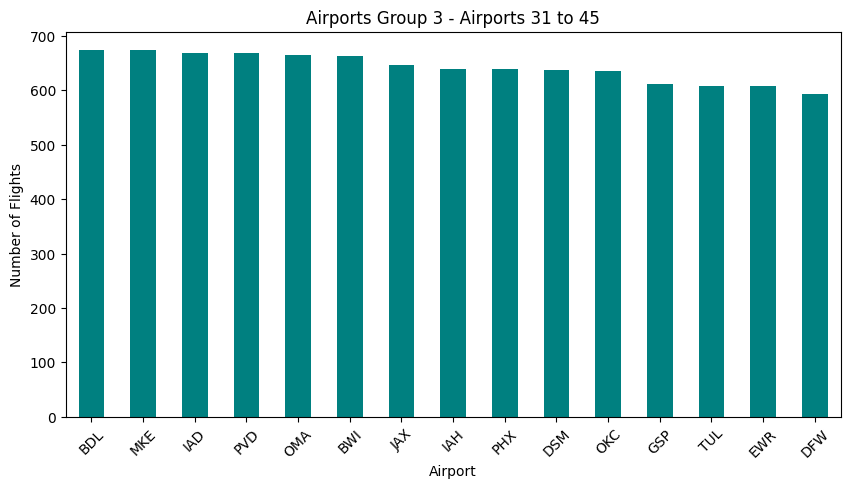

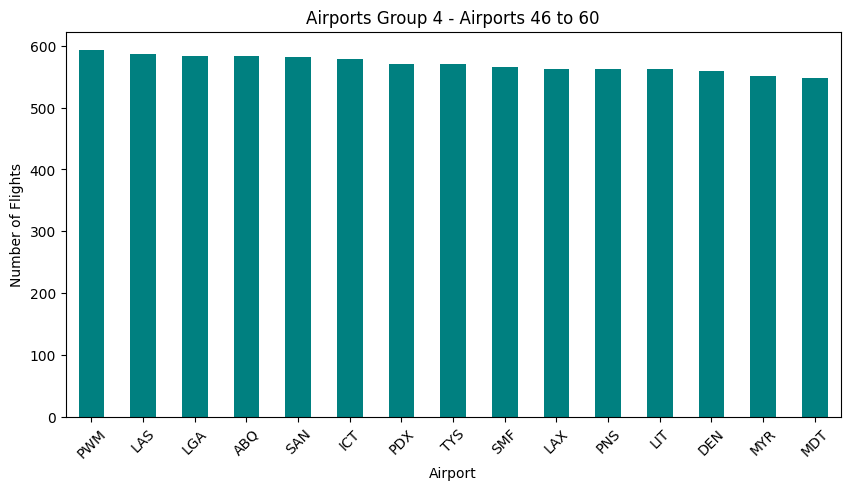

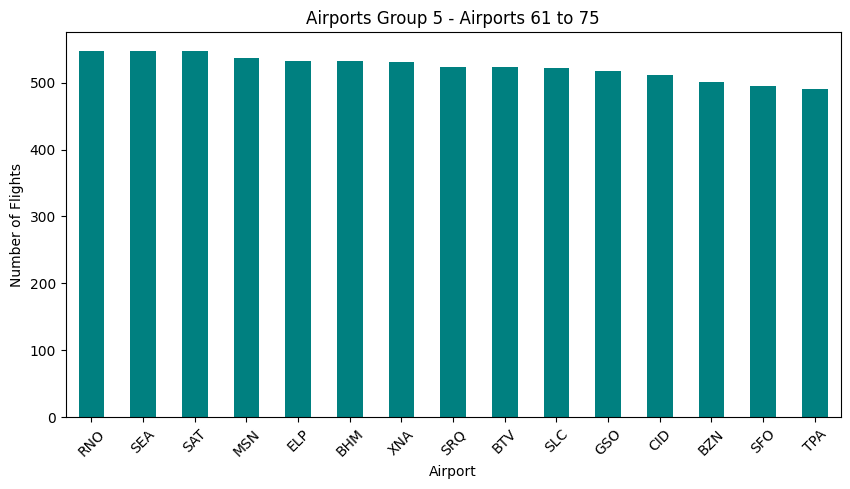

...

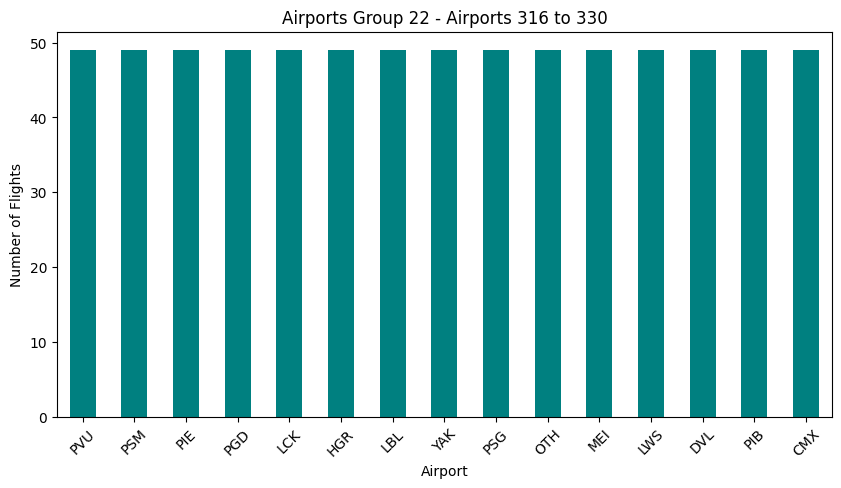

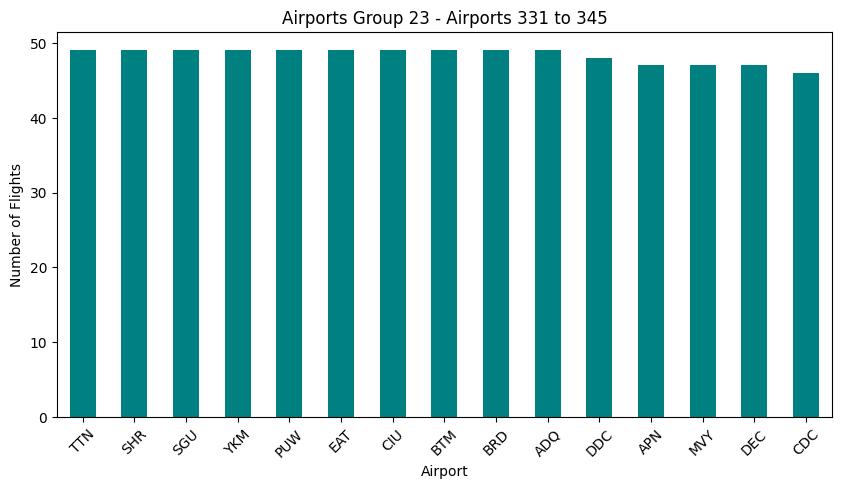

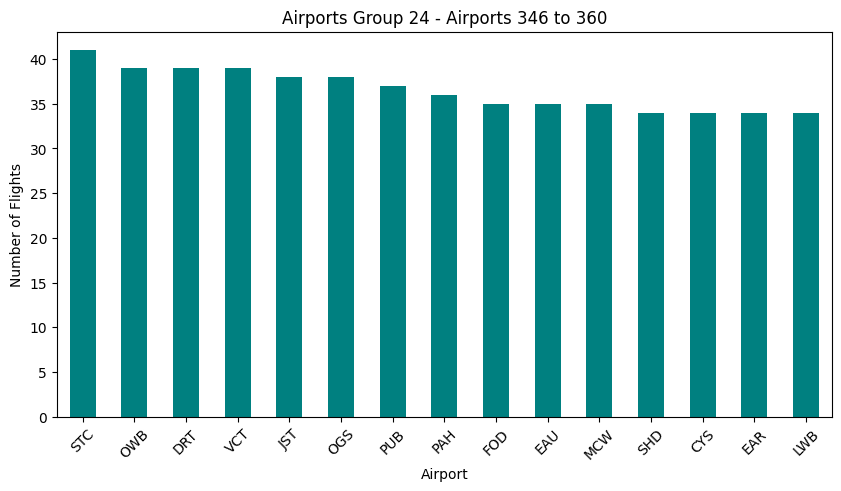

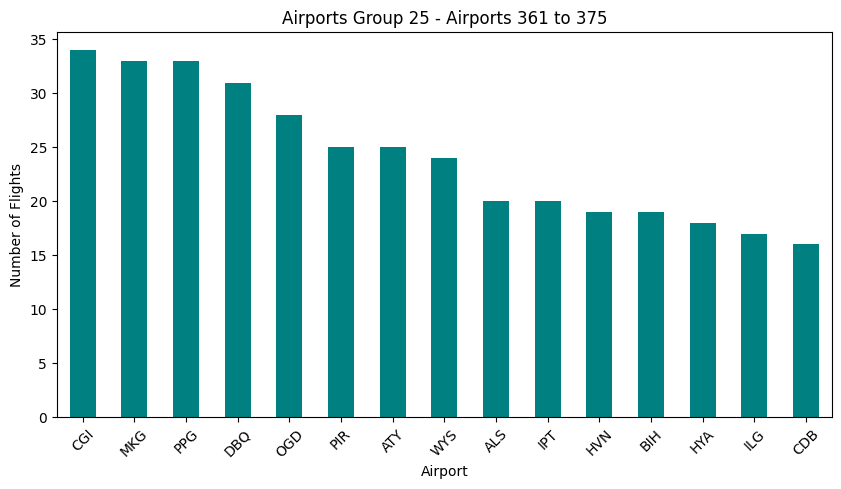

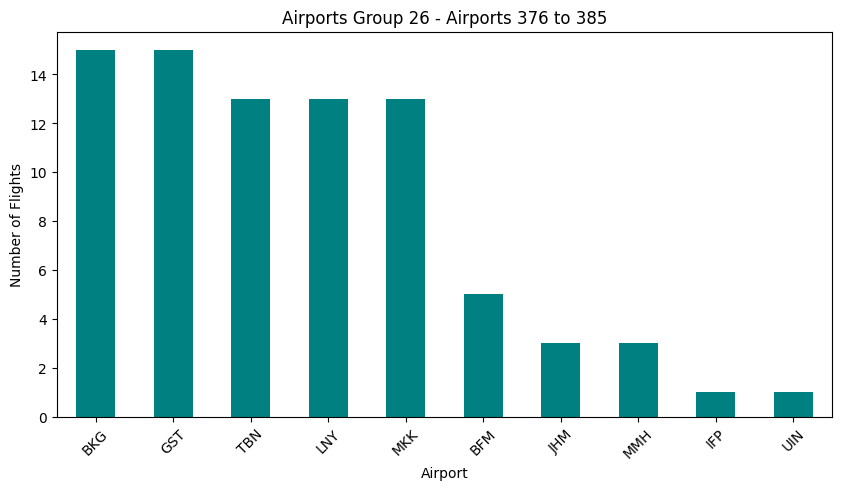

In [30]:
import matplotlib.pyplot as plt

# Calculate the frequency of flights for each airport
airport_frequencies = data['airport'].value_counts().sort_values(ascending=False)

# Total number of groups
num_airports = len(airport_frequencies)
groups = (num_airports + 14) // 15  # This ensures we capture all airports even if the total number isn't a multiple of 15

# Plotting each group
for i in range(groups):
    start_idx = i * 15
    end_idx = start_idx + 15
    subset = airport_frequencies[start_idx:end_idx]

    plt.figure(figsize=(10, 5))
    subset.plot(kind='bar', color='teal')
    plt.title(f'Airports Group {i+1} - Airports {start_idx+1} to {min(end_idx, num_airports)}')
    plt.xlabel('Airport')
    plt.ylabel('Number of Flights')
    plt.xticks(rotation=45)
    plt.show()


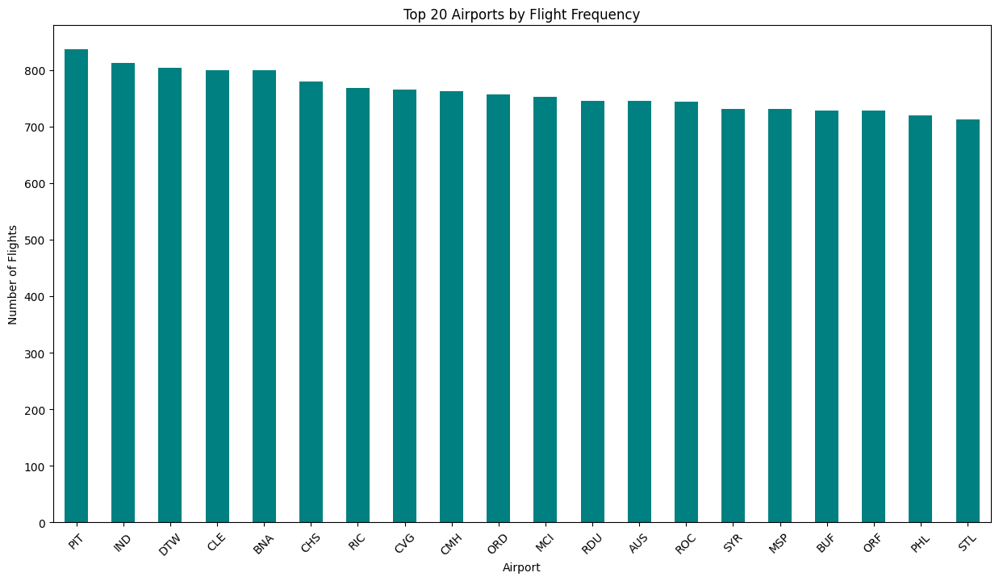

In [31]:
# Plotting the top 20 airports for better visibility
top_airports = airport_frequencies.head(20)  # Adjust the number here as needed
plt.figure(figsize=(15, 8))
top_airports.plot(kind='bar', color='teal')
plt.title('Top 20 Airports by Flight Frequency')
plt.xlabel('Airport')
plt.ylabel('Number of Flights')
plt.xticks(rotation=45)  # Rotate the labels for better visibility
plt.show()


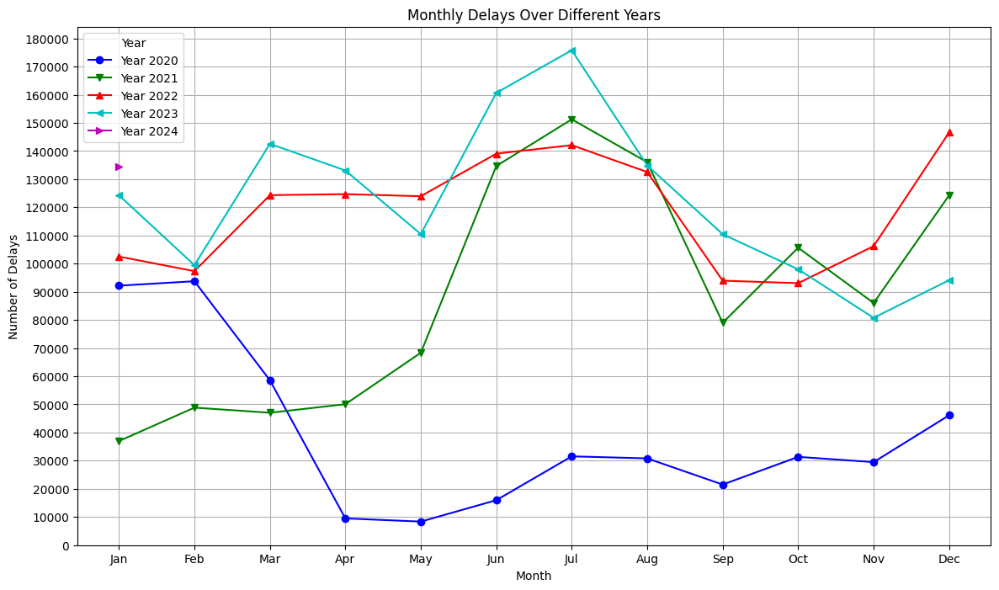

In [32]:
import matplotlib.pyplot as plt

# Creating a 'year_month' identifier for easier grouping
data['year_month'] = data['year'].astype(str) + '-' + data['month'].astype(str).str.zfill(2)

# Sum delays by 'year_month'
monthly_yearly_delays = data.groupby('year_month')['arr_del15'].sum().reset_index()

# Extract year and month for plotting
monthly_yearly_delays['year'] = monthly_yearly_delays['year_month'].apply(lambda x: x.split('-')[0])
monthly_yearly_delays['month'] = monthly_yearly_delays['year_month'].apply(lambda x: int(x.split('-')[1]))

# Sorting by year and month to make sure data is in order
monthly_yearly_delays.sort_values(by=['year', 'month'], inplace=True)

# Plotting setup
plt.figure(figsize=(14, 8))
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k']  # Extend this list if you have more than 7 years
markers = ['o', 'v', '^', '<', '>', 's', 'p', 'h', 'H', 'D', 'd']  # Different markers for each year

# Group by year and then plot each group
for (key, grp), color, marker in zip(monthly_yearly_delays.groupby('year'), colors, markers):
    plt.plot(grp['month'], grp['arr_del15'], label=f'Year {key}', marker=marker, color=color)

plt.title('Monthly Delays Over Different Years')
plt.xlabel('Month')
plt.ylabel('Number of Delays')
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.yticks(range(0, int(max(monthly_yearly_delays['arr_del15']) + 10000), 10000))  # Ensure y-axis values are integers
plt.legend(title='Year')
plt.grid(True)
plt.show()


In [33]:
# Assuming 'arr_del15' is 1 when there's a delay and 0 when there's no delay
# Count the number of on-time flights
on_time_flights = data[data['arr_del15'] == 0].shape[0]

# Print the result
print(f"Total number of on-time flights: {on_time_flights}")


Total number of on-time flights: 5672


In [34]:
# Calculate the total number of flights that were delayed
total_delayed_flights = data['arr_del15'].sum()

# Print the total number of delayed flights
print(f"Total number of delayed flights: {int(total_delayed_flights)}")


Total number of delayed flights: 4562433


In [35]:
import pandas as pd

# Load your dataset
data = pd.read_csv('/content/Airline_Delay_Cause.csv')

# Define the delay columns
delay_columns = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay']

# Initialize a dictionary to store the results
delays_by_range = {}

# Define ranges
ranges = [(1, 10), (11, 20), (21, 30), (31, 40), (41, 50), (51, 60)]

# Loop through each range
for start, end in ranges:
    # Flights delayed within the range, including end point, not double counting
    condition = (data[delay_columns] > start-1) & (data[delay_columns] <= end)
    data['is_delayed'] = condition.any(axis=1)
    total_delayed_flights = data['is_delayed'].sum()
    delays_by_range[f"{start}-{end} minutes"] = total_delayed_flights

# Print the result
print(delays_by_range)


{'1-10 minutes': 10103, '11-20 minutes': 13009, '21-30 minutes': 11996, '31-40 minutes': 10550, '41-50 minutes': 9149, '51-60 minutes': 8537}


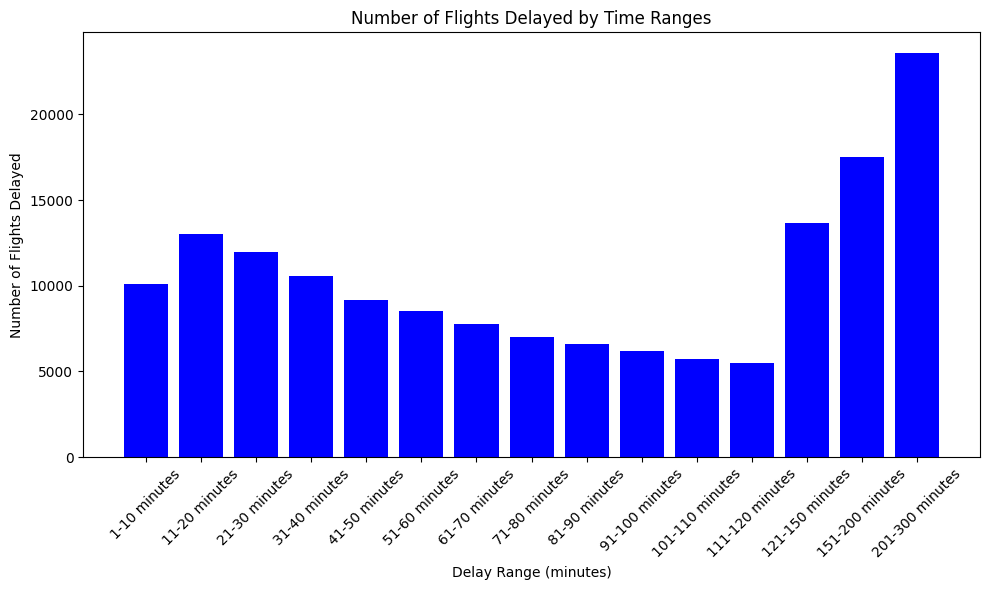

In [36]:
import pandas as pd
import matplotlib.pyplot as plt

# Load your dataset
data = pd.read_csv('/content/Airline_Delay_Cause.csv')

# Define the delay columns
delay_columns = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay']

# Initialize a dictionary to store the results
delays_by_range = {}

# Define ranges
ranges = [(1, 10), (11, 20), (21, 30), (31, 40), (41, 50), (51, 60),(61, 70), (71, 80), (81, 90), (91, 100), (101, 110), (111, 120),(121, 150),(151, 200),(201, 300)]

# Loop through each range
for start, end in ranges:
    # Flights delayed within the range, including end point, not double counting
    condition = (data[delay_columns] > start-1) & (data[delay_columns] <= end)
    data['is_delayed'] = condition.any(axis=1)
    total_delayed_flights = data['is_delayed'].sum()
    delays_by_range[f"{start}-{end} minutes"] = total_delayed_flights

# Plotting the data
plt.figure(figsize=(10, 6))  # Set the figure size
plt.bar(delays_by_range.keys(), delays_by_range.values(), color='blue')  # Create a bar chart
plt.xlabel('Delay Range (minutes)')  # Label the x-axis
plt.ylabel('Number of Flights Delayed')  # Label the y-axis
plt.title('Number of Flights Delayed by Time Ranges')  # Set the title
plt.xticks(rotation=45)  # Rotate the x-axis labels for better readability
plt.tight_layout()  # Adjust layout to make room for the rotated x-labels
plt.show()  # Display the plot


In [37]:
# Example calculations for each type of delay
air_carrier_delay = (data['carrier_delay'] > 0).sum()
weather_delay = (data['weather_delay'] > 0).sum()
nas_delay = (data['nas_delay'] > 0).sum()
security_delay = (data['security_delay'] > 0).sum()
aircraft_arriving_late = (data['late_aircraft_delay'] > 0).sum()


In [38]:
# Assume 'airport_code' is the column name that contains the airport identifiers
total_airports = data['airport'].nunique()

# Print the total number of unique airports
print("Total number of unique airports:", total_airports)


Total number of unique airports: 385


In [39]:
# Assume 'airport_code' is the column name that contains the airport identifiers
airport_frequencies = data['airport'].value_counts()

# Print the frequencies of each airport
print("Frequency of each airport:")
print(airport_frequencies)


Frequency of each airport:
airport
PIT    837
IND    812
DTW    804
BNA    799
CLE    799
      ... 
BFM      5
JHM      3
MMH      3
IFP      1
UIN      1
Name: count, Length: 385, dtype: int64


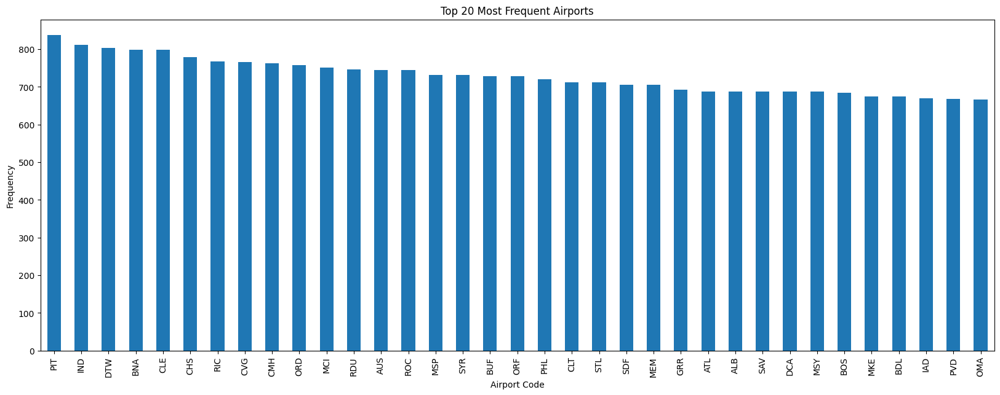

In [40]:
# Plotting the top 20 most frequent airports
airport_frequencies.head(35).plot(kind='bar', figsize=(20, 7))
plt.title('Top 20 Most Frequent Airports')
plt.xlabel('Airport Code')
plt.ylabel('Frequency')
plt.show()


In [41]:
# Assume 'airport_code' is the column name that contains the airport identifiers
airport_frequencies = data['airport_name'].value_counts()

# Print the frequencies of each airport
print("Frequency of each airport:")
print(airport_frequencies)


Frequency of each airport:
airport_name
Pittsburgh, PA: Pittsburgh International              837
Indianapolis, IN: Indianapolis International          812
Detroit, MI: Detroit Metro Wayne County               804
Cleveland, OH: Cleveland-Hopkins International        799
Nashville, TN: Nashville International                799
                                                     ... 
Mobile, AL: Mobile Downtown                             5
Mammoth Lakes, CA: Mammoth Lakes Airport                3
Kapalua, HI: Kapalua Airport                            3
Bullhead City, AZ: Laughlin/Bullhead International      1
Quincy, IL: Quincy Regional-Baldwin Field               1
Name: count, Length: 408, dtype: int64


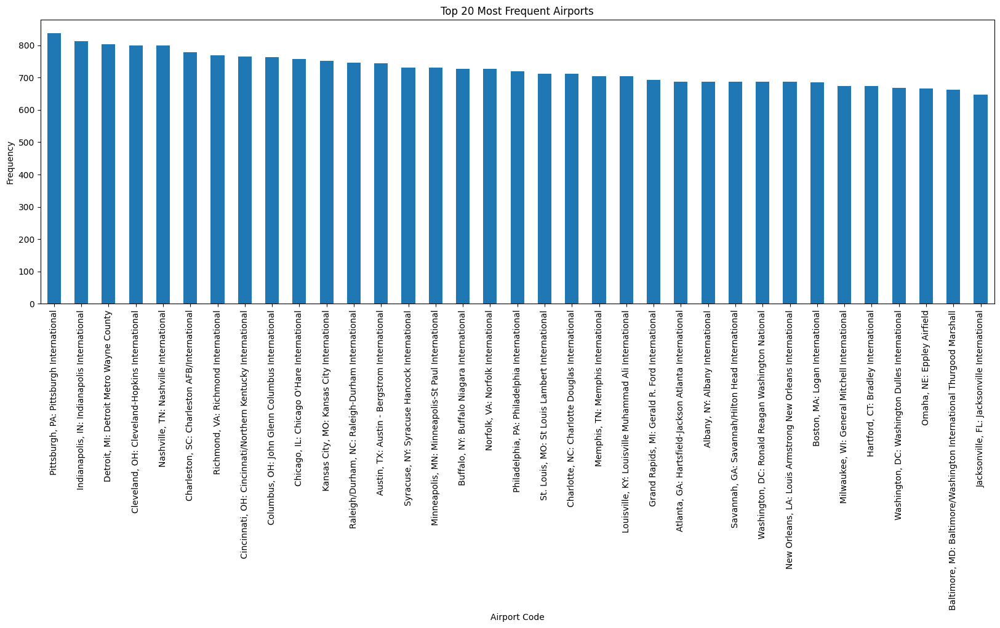

In [42]:
import matplotlib.pyplot as plt
# Plotting the top 20 most frequent airports
airport_frequencies.head(35).plot(kind='bar', figsize=(20, 6))
plt.title('Top 20 Most Frequent Airports')
plt.xlabel('Airport Code')
plt.ylabel('Frequency')
plt.show()


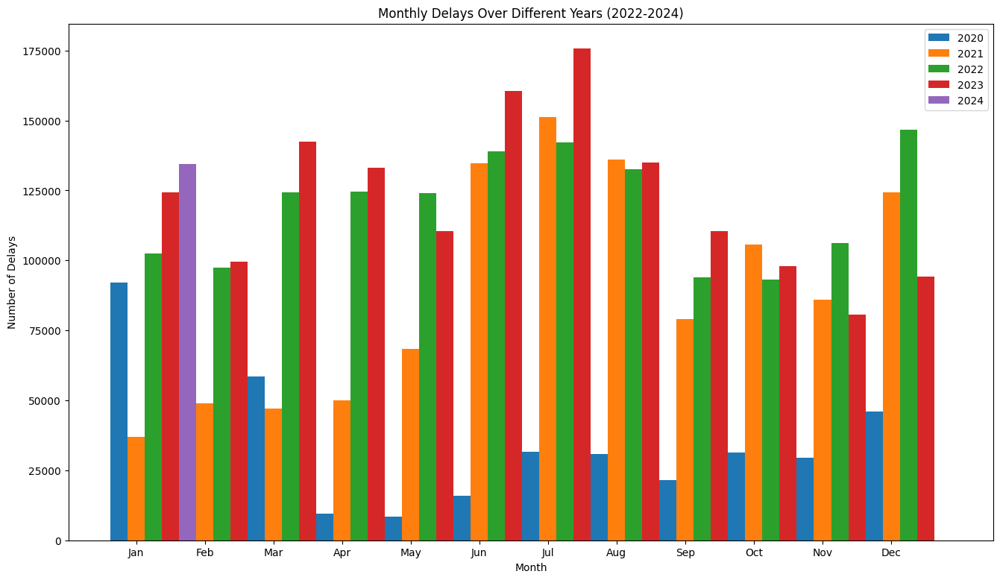

In [43]:
import matplotlib.pyplot as plt
import numpy as np

# Unique months for labeling the x-axis correctly
months_labels = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
bar_width = 0.25  # Width of the bars

fig, ax = plt.subplots(figsize=(16, 9))
index = np.arange(len(months_labels))  # Index for the months

# Data handling and plotting for each year
for i, year in enumerate(['2020','2021','2022', '2023', '2024']):
    # Filter data for each year and fill missing months with zeros for consistent plotting
    yearly_data = monthly_yearly_delays[monthly_yearly_delays['year'] == year]
    monthly_data = np.zeros(12)  # Assume 12 months, fill with zeros
    for month in yearly_data['month'].astype(int):
        monthly_data[month-1] = yearly_data[yearly_data['month'].astype(int) == month]['arr_del15'].values[0]

    ax.bar(index + bar_width * i, monthly_data, bar_width, label=year)

ax.set_xlabel('Month')
ax.set_ylabel('Number of Delays')
ax.set_title('Monthly Delays Over Different Years (2022-2024)')
ax.set_xticks(index + bar_width)
ax.set_xticklabels(months_labels)
ax.legend()

plt.show()




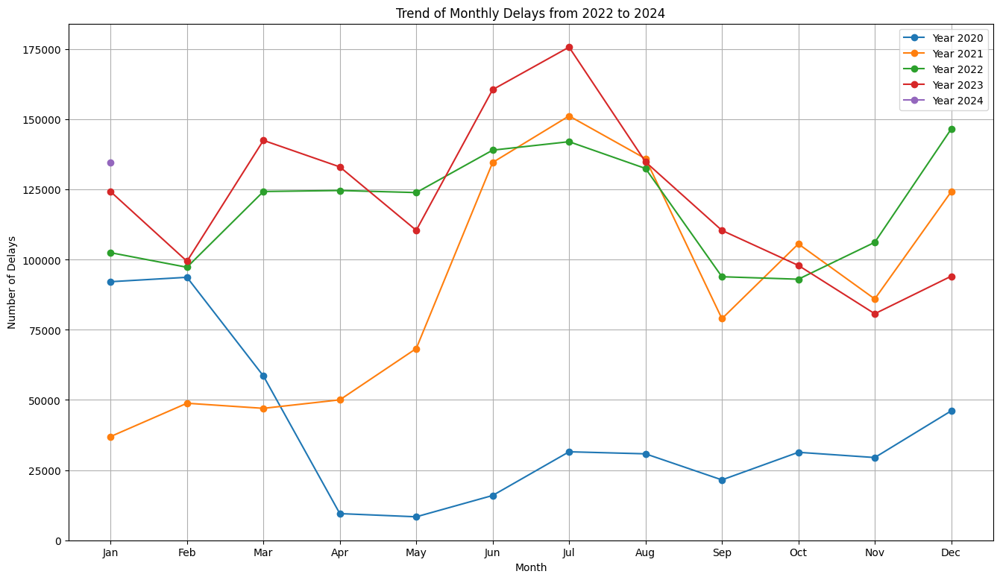

In [44]:
fig, ax = plt.subplots(figsize=(16, 9))

# Plot data correctly handling each year
for key, grp in monthly_yearly_delays.groupby('year'):
    # Prepare a full year of data to plot (set missing months to NaN or zero)
    full_year_data = np.full(12, np.nan)  # Start with NaN for missing months
    for month in grp['month'].astype(int):
        full_year_data[month-1] = grp[grp['month'].astype(int) == month]['arr_del15'].values[0]

    ax.plot(months_labels, full_year_data, marker='o', label=f'Year {key}')

ax.set_xlabel('Month')
ax.set_ylabel('Number of Delays')
ax.set_title('Trend of Monthly Delays from 2022 to 2024')
ax.legend()
plt.grid(True)
plt.show()


<ipython-input-45-850265941b9d>:20: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels([''] + list(pivot_table.columns.astype(str)))
<ipython-input-45-850265941b9d>:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels([''] + list(pivot_table.index.astype(str)))


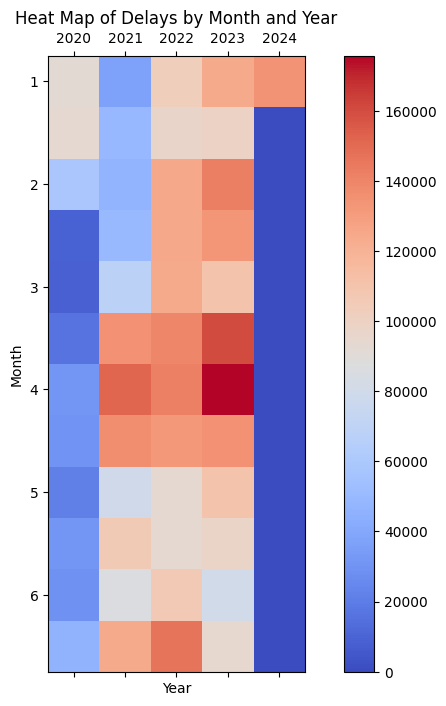

In [45]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Load your data (make sure it's loaded correctly)
data = pd.read_csv('/content/Airline_Delay_Cause.csv')

# Assuming 'data' has 'year' and 'month' as separate integer columns and 'arr_del15'
# If they're not, you'll need to correct how they're handled based on your actual data structure.

# Pivot data to create a heatmap data format
pivot_table = data.pivot_table(values='arr_del15', index='month', columns='year', aggfunc='sum', fill_value=0)

# Plotting the heat map
fig, ax = plt.subplots(figsize=(10, 8))
cax = ax.matshow(pivot_table, interpolation='nearest', cmap='coolwarm')
fig.colorbar(cax)

# Setting tick labels
ax.set_xticklabels([''] + list(pivot_table.columns.astype(str)))
ax.set_yticklabels([''] + list(pivot_table.index.astype(str)))

ax.set_xlabel('Year')
ax.set_ylabel('Month')
ax.set_title('Heat Map of Delays by Month and Year')
plt.show()


In [46]:
# Create the binary target variable
data['delayed'] = (data['arr_delay'] >= 15).astype(int)

# Drop irrelevant columns
columns_to_drop = ['carrier_name', 'airport_name']
data_cleaned = data.drop(columns=columns_to_drop)

# Encode categorical variables
categorical_cols = ['carrier', 'airport']
data_cleaned = pd.get_dummies(data_cleaned, columns=categorical_cols, drop_first=True)

# Normalize numerical features
from sklearn.preprocessing import StandardScaler

numerical_cols = data_cleaned.select_dtypes(include=['float64', 'int64']).columns.tolist()
scaler = StandardScaler()
data_cleaned[numerical_cols] = scaler.fit_transform(data_cleaned[numerical_cols])

# Split the data into train, validation, and test sets
from sklearn.model_selection import train_test_split

train_val, test_data = train_test_split(data_cleaned, test_size=0.10, random_state=42)
train_data, val_data = train_test_split(train_val, test_size=0.22, random_state=42)  # 0.22 * 0.90 ≈ 0.20

(train_data.shape, val_data.shape, test_data.shape)


((64694, 426), (18248, 426), (9216, 426))

<Figure size 1000x800 with 0 Axes>

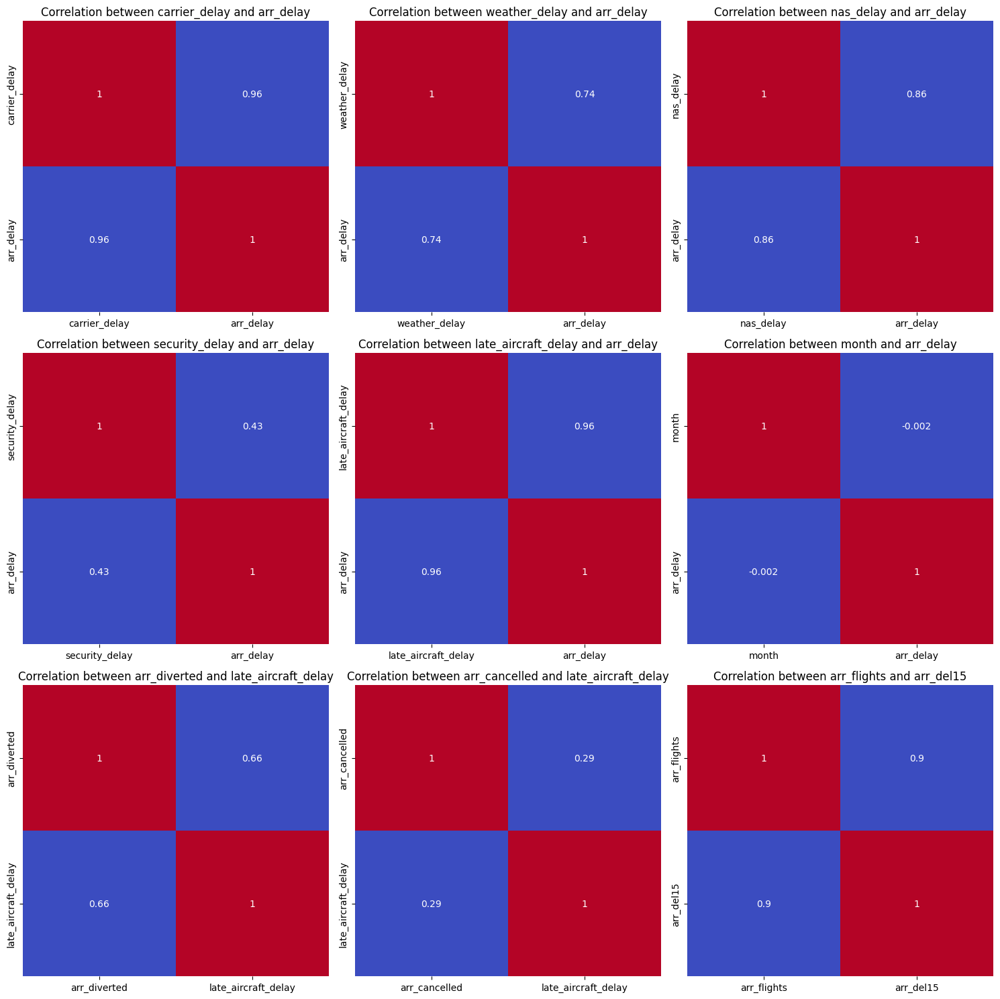

In [47]:
# Set up matplotlib for plotting
import matplotlib.pyplot as plt
import seaborn as sns

# Create a larger figure size for better visibility
plt.figure(figsize=(10, 8))

# Define a list of pairs of columns for which to plot correlation heatmaps
correlation_pairs = [
    ('carrier_delay', 'arr_delay'),
    ('weather_delay', 'arr_delay'),
    ('nas_delay', 'arr_delay'),
    ('security_delay', 'arr_delay'),
    ('late_aircraft_delay', 'arr_delay'),
    ('month', 'arr_delay'),
    ('arr_diverted', 'late_aircraft_delay'),
    ('arr_cancelled', 'late_aircraft_delay'),
    ('arr_flights', 'arr_del15')
]

# Plot each correlation as a separate subplot
fig, axes = plt.subplots(3, 3, figsize=(15, 15))
for i, (x, y) in enumerate(correlation_pairs):
    # Compute the correlation matrix for the pair
    corr_matrix = data[[x, y]].corr()
    ax = axes[i // 3, i % 3]
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', cbar=False, ax=ax)
    ax.set_title(f'Correlation between {x} and {y}')

plt.tight_layout()
plt.show()



In [48]:
# Calculate the number of flights delayed by 15 minutes or more using the 'arr_del15' column
number_of_delays = data['arr_del15'].sum()
number_of_delays


4562433.0

In [49]:
# Calculate the number of flights delayed by 15 minutes or more using the 'arr_del15' column
number_of_delays = data['arr_del15'].sum()
print(f"Number of flights delayed by 15 minutes or more: {number_of_delays}")


Number of flights delayed by 15 minutes or more: 4562433.0


In [50]:
# Update the dataset with the number of on-time flights for each entry
data['on_time_flights'] = data['arr_flights'] - data['arr_del15']

# Optionally, check the entire dataset to confirm the update
print(data[['arr_flights', 'arr_del15', 'on_time_flights']])

# You can also describe the new column to see statistics
print(data['on_time_flights'].describe())




       arr_flights  arr_del15  on_time_flights
0            80.00      16.00            64.00
1             3.00       0.00             3.00
2            62.00       9.00            53.00
3            74.00      15.00            59.00
4           101.00      23.00            78.00
...            ...        ...              ...
92153        48.00      12.00            36.00
92154        69.00      13.00            56.00
92155        58.00       7.00            51.00
92156        32.00       4.00            28.00
92157       102.00      20.00            82.00

[92158 rows x 3 columns]
count   91682.00
mean      236.08
std       699.14
min         0.00
25%        29.00
50%        64.00
75%       153.00
max     19530.00
Name: on_time_flights, dtype: float64


In [51]:
# Save the updated dataset to a new CSV file
data.to_csv('updated_flight_data.csv', index=False)


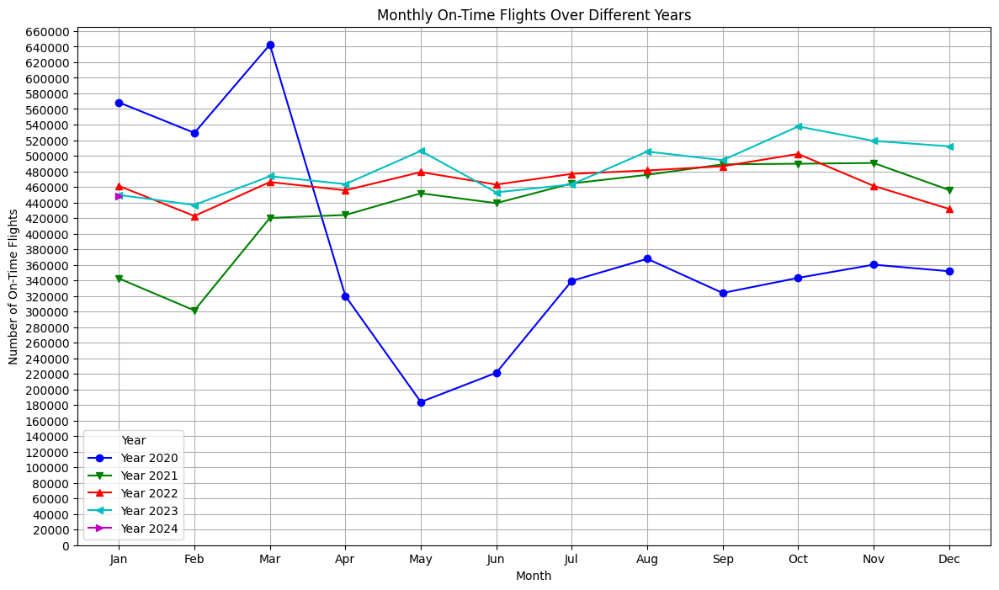

In [52]:
import matplotlib.pyplot as plt

# Ensure 'on_time_flights' is calculated correctly
data['on_time_flights'] = data['arr_flights'] - data['arr_del15']

# Creating a 'year_month' identifier for easier grouping
data['year_month'] = data['year'].astype(str) + '-' + data['month'].astype(str).str.zfill(2)

# Sum on-time flights by 'year_month'
monthly_yearly_on_time = data.groupby('year_month')['on_time_flights'].sum().reset_index()

# Extract year and month for plotting
monthly_yearly_on_time['year'] = monthly_yearly_on_time['year_month'].apply(lambda x: x.split('-')[0])
monthly_yearly_on_time['month'] = monthly_yearly_on_time['year_month'].apply(lambda x: int(x.split('-')[1]))

# Sorting by year and month to make sure data is in order
monthly_yearly_on_time.sort_values(by=['year', 'month'], inplace=True)

# Plotting setup
plt.figure(figsize=(14, 8))
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k']  # Extend this list if you have more than 7 years
markers = ['o', 'v', '^', '<', '>', 's', 'p', 'h', 'H', 'D', 'd']  # Different markers for each year

# Group by year and then plot each group
for (key, grp), color, marker in zip(monthly_yearly_on_time.groupby('year'), colors, markers):
    plt.plot(grp['month'], grp['on_time_flights'], label=f'Year {key}', marker=marker, color=color)

plt.title('Monthly On-Time Flights Over Different Years')
plt.xlabel('Month')
plt.ylabel('Number of On-Time Flights')
plt.xticks(ticks=range(1, 13), labels=['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.yticks(range(0, int(max(monthly_yearly_on_time['on_time_flights']) + 20000), 20000))  # Increase y-axis values by 20000 units
plt.legend(title='Year')
plt.grid(True)
plt.show()




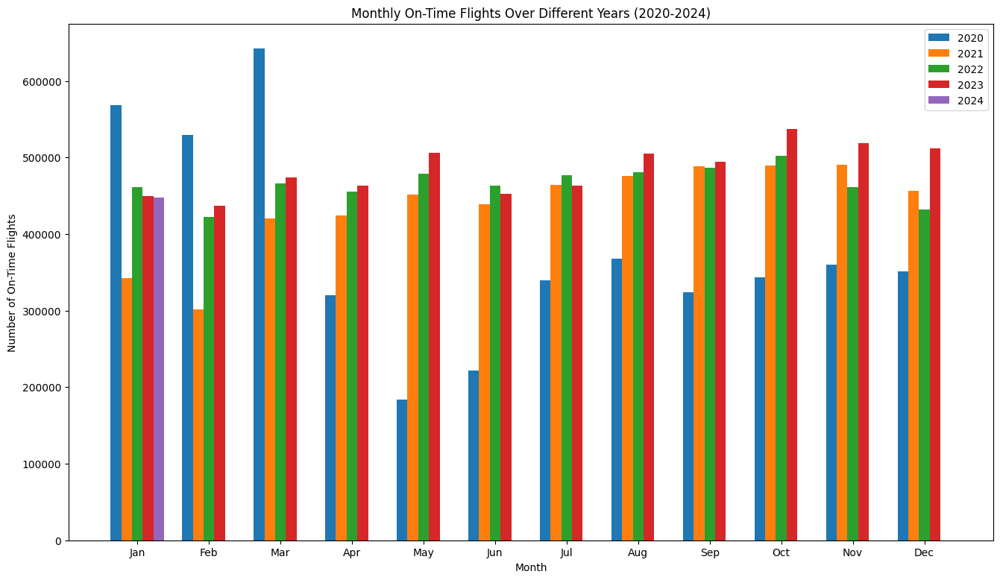

In [53]:
import matplotlib.pyplot as plt
import numpy as np

# Unique months for labeling the x-axis correctly
months_labels = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
bar_width = 0.15  # Width of the bars

fig, ax = plt.subplots(figsize=(16, 9))
index = np.arange(len(months_labels))  # Index for the months

# Data handling and plotting for each year
for i, year in enumerate(['2020', '2021', '2022', '2023', '2024']):
    # Filter data for each year and fill missing months with zeros for consistent plotting
    yearly_data = monthly_yearly_on_time[monthly_yearly_on_time['year'] == year]
    monthly_data = np.zeros(12)  # Assume 12 months, fill with zeros
    for month in yearly_data['month'].astype(int):
        monthly_data[month-1] = yearly_data[yearly_data['month'].astype(int) == month]['on_time_flights'].values[0]

    ax.bar(index + bar_width * i, monthly_data, bar_width, label=year)

ax.set_xlabel('Month')
ax.set_ylabel('Number of On-Time Flights')
ax.set_title('Monthly On-Time Flights Over Different Years (2020-2024)')
ax.set_xticks(index + bar_width * 2)  # Adjust tick positions for better alignment
ax.set_xticklabels(months_labels)
ax.legend()

plt.show()


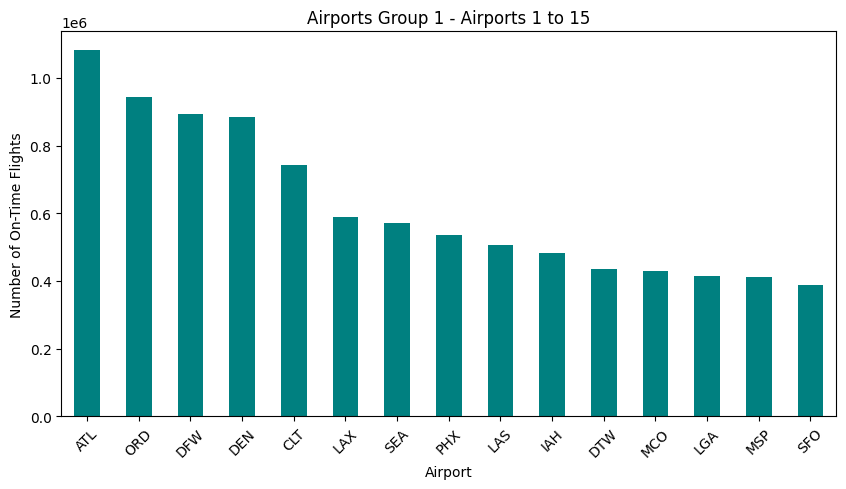

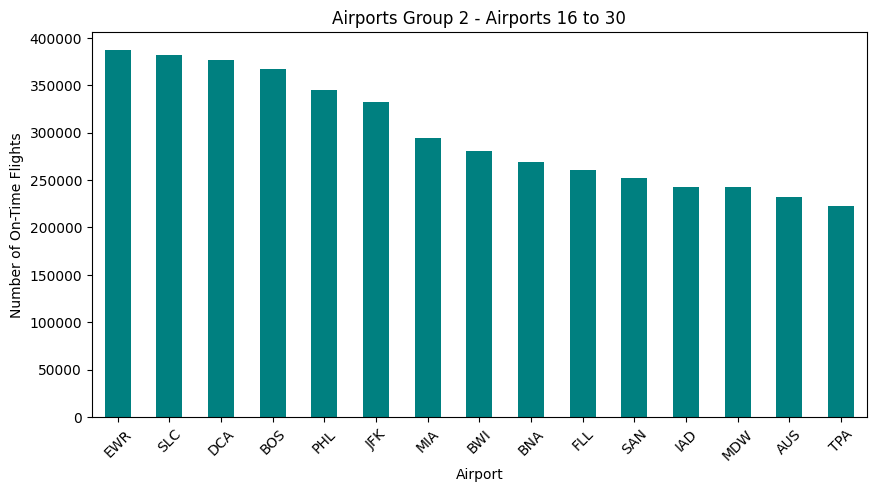

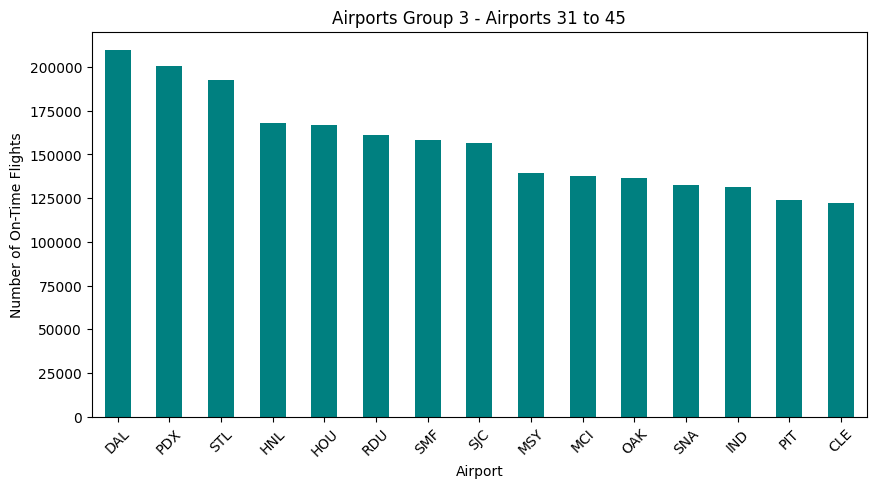

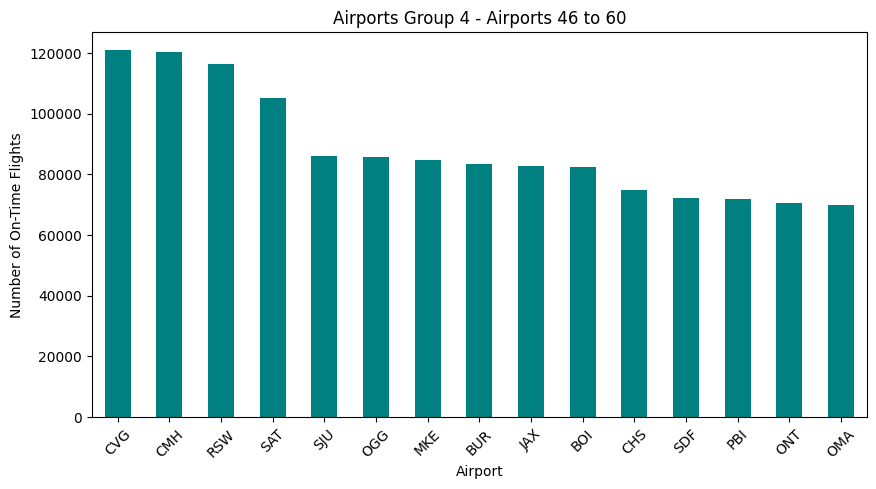

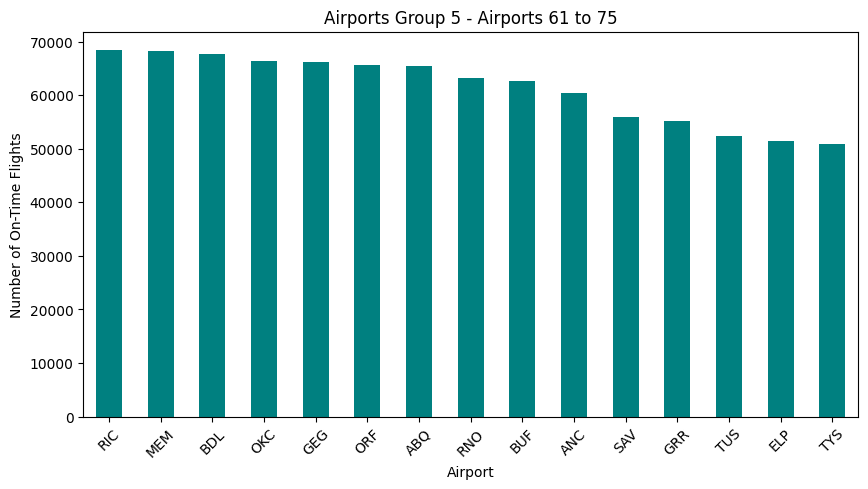

...

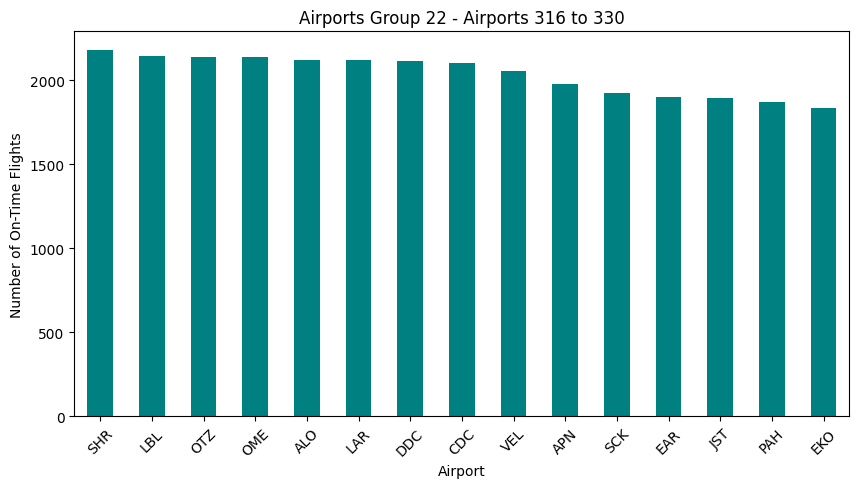

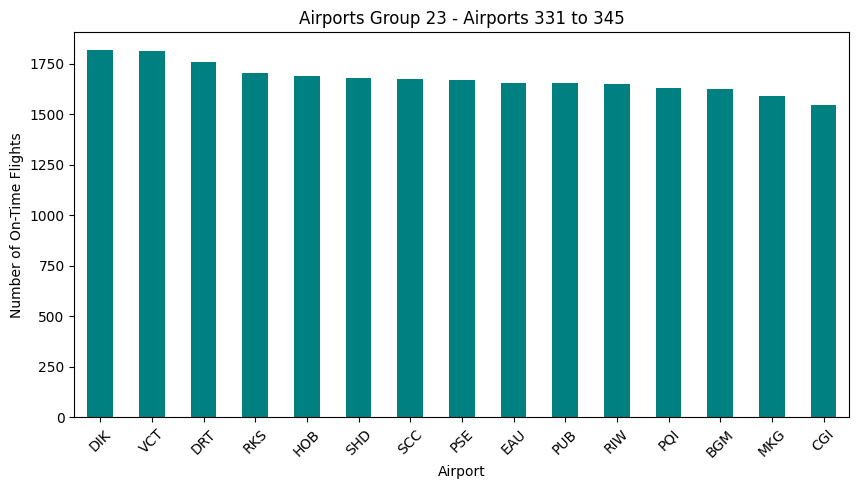

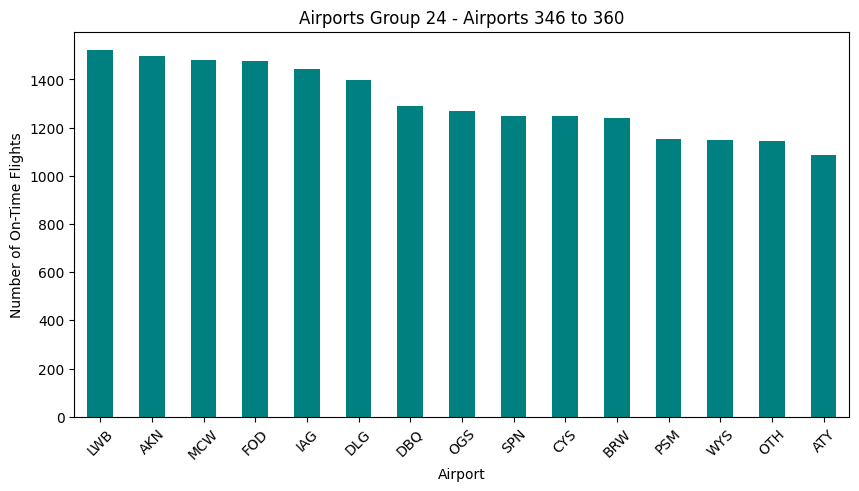

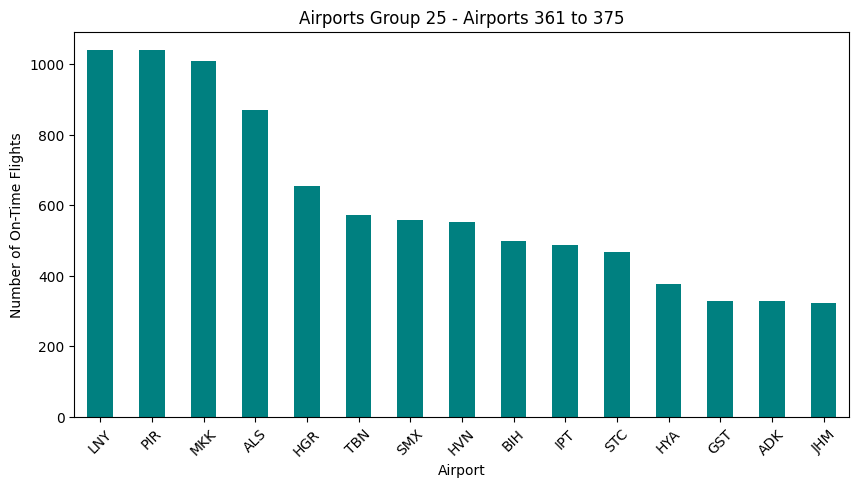

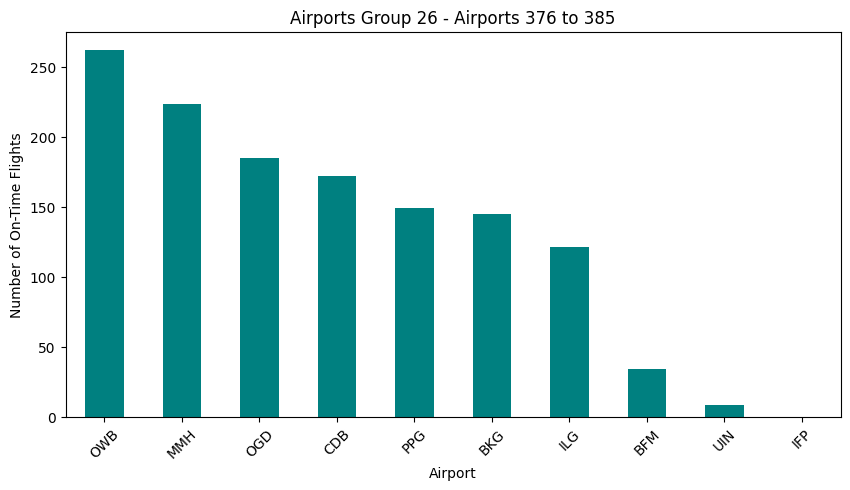

In [54]:
import matplotlib.pyplot as plt

# Ensure 'on_time_flights' is calculated correctly
data['on_time_flights'] = data['arr_flights'] - data['arr_del15']

# Calculate the frequency of on-time flights for each airport
on_time_frequencies = data.groupby('airport')['on_time_flights'].sum().sort_values(ascending=False)

# Total number of groups
num_airports = len(on_time_frequencies)
groups = (num_airports + 14) // 15  # This ensures we capture all airports even if the total number isn't a multiple of 15

# Plotting each group
for i in range(groups):
    start_idx = i * 15
    end_idx = start_idx + 15
    subset = on_time_frequencies[start_idx:end_idx]

    plt.figure(figsize=(10, 5))
    subset.plot(kind='bar', color='teal')
    plt.title(f'Airports Group {i+1} - Airports {start_idx+1} to {min(end_idx, num_airports)}')
    plt.xlabel('Airport')
    plt.ylabel('Number of On-Time Flights')
    plt.xticks(rotation=45)
    plt.show()


In [55]:
# Calculate the total number of flights
total_flights = data['arr_flights'].sum()

# Calculate the total number of delayed flights
total_delayed_flights = data['arr_del15'].sum()

# Calculate the total number of on-time flights
total_on_time_flights = total_flights - total_delayed_flights

# Print the results
print(f"Total number of flights: {total_flights}")
print(f"Total number of delayed flights: {total_delayed_flights}")
print(f"Total number of on-time flights: {total_on_time_flights}")



Total number of flights: 26208940.0
Total number of delayed flights: 4562433.0
Total number of on-time flights: 21646507.0


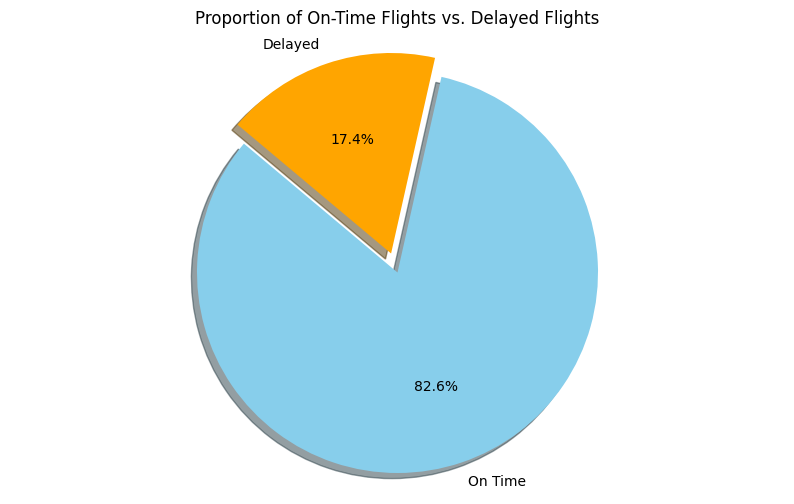

In [56]:
import matplotlib.pyplot as plt

# Calculate the total number of flights
total_flights = data['arr_flights'].sum()

# Calculate the total number of delayed flights
total_delayed_flights = data['arr_del15'].sum()

# Calculate the total number of on-time flights
total_on_time_flights = total_flights - total_delayed_flights

# Ensure the sizes are all non-negative
sizes = [total_on_time_flights, total_delayed_flights]

# Labels for the pie chart
labels = ['On Time', 'Delayed']

# Colors for the pie chart
colors = ['skyblue', 'orange']

# Explode the first slice for emphasis
explode = [0.1, 0]  # Explode the 'On Time' slice

# Plotting the pie chart
plt.figure(figsize=(10, 6))
plt.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%', shadow=True, startangle=140)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.title('Proportion of On-Time Flights vs. Delayed Flights')
plt.show()


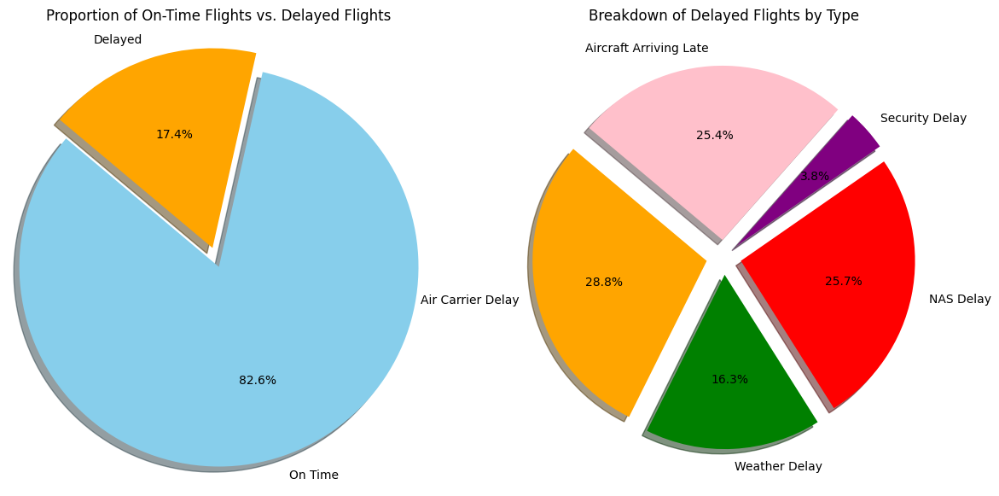

In [57]:
import matplotlib.pyplot as plt

# Calculate the total number of flights
total_flights = data['arr_flights'].sum()

# Calculate the total number of delayed flights
total_delayed_flights = data['arr_del15'].sum()

# Calculate the total number of on-time flights
total_on_time_flights = total_flights - total_delayed_flights

# Calculate each type of delay
air_carrier_delay = (data['carrier_delay'] > 0).sum()
weather_delay = (data['weather_delay'] > 0).sum()
nas_delay = (data['nas_delay'] > 0).sum()
security_delay = (data['security_delay'] > 0).sum()
aircraft_arriving_late = (data['late_aircraft_delay'] > 0).sum()

# Ensure the sizes are all non-negative
sizes_overall = [total_on_time_flights, total_delayed_flights]
sizes_delays = [air_carrier_delay, weather_delay, nas_delay, security_delay, aircraft_arriving_late]

# Labels for the pie chart
labels_overall = ['On Time', 'Delayed']
labels_delays = ['Air Carrier Delay', 'Weather Delay', 'NAS Delay', 'Security Delay', 'Aircraft Arriving Late']

# Colors for the pie chart
colors_overall = ['skyblue', 'orange']
colors_delays = ['orange', 'green', 'red', 'purple', 'pink']

# Explode the slices for emphasis
explode_overall = [0.1, 0]
explode_delays = [0.1] * len(labels_delays)

# Plotting the pie charts
plt.figure(figsize=(14, 7))

# Pie chart for on-time vs delayed
plt.subplot(1, 2, 1)
plt.pie(sizes_overall, explode=explode_overall, labels=labels_overall, colors=colors_overall, autopct='%1.1f%%', shadow=True, startangle=140)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.title('Proportion of On-Time Flights vs. Delayed Flights')

# Pie chart for types of delays
plt.subplot(1, 2, 2)
plt.pie(sizes_delays, explode=explode_delays, labels=labels_delays, colors=colors_delays, autopct='%1.1f%%', shadow=True, startangle=140)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.title('Breakdown of Delayed Flights by Type')

plt.show()



NEURAL NETWORK IMPLEMENTATION STARTS FROM HERE. any aircraft which has a total delayed time more than 15 minutes will be considered to be delayed or else on time

IMPEMENTING AN ANN ON 0.1 test DATASET

> Add blockquote




In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
import seaborn as sns
import matplotlib.pyplot as plt



# Create additional features
data['total_delay'] = data['carrier_delay'] + data['weather_delay'] + data['nas_delay'] + data['security_delay'] + data['late_aircraft_delay']

# Select features and target
features = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay',
            'total_delay', 'carrier', 'airport']
X = data[features]
y = data['delayed']

# Identify categorical and numerical columns
categorical_cols = ['carrier', 'airport']
numerical_cols = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay', 'total_delay']

# Preprocessing for numerical data (with imputation)
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# Preprocess the data
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

# Convert sparse matrix to dense matrix
X_train = X_train.toarray()
X_test = X_test.toarray()

# Check for NaN values
print("NaN values in X_train:", np.isnan(X_train).sum())
print("NaN values in X_test:", np.isnan(X_test).sum())
print("NaN values in y_train:", np.isnan(y_train).sum())
print("NaN values in y_test:", np.isnan(y_test).sum())

# Define the model with a different architecture
model = Sequential([
    Dense(256, activation='relu', input_shape=(X_train.shape[1],)),
    Dropout(0.4),
    Dense(128, activation='relu'),
    Dropout(0.4),
    Dense(64, activation='relu'),
    Dropout(0.4),
    Dense(1, activation='sigmoid')
])

# Compile the model with a different optimizer
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Train the model
history = model.fit(X_train, y_train, epochs=120, batch_size=64, validation_split=0.2)

# Evaluate the model
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy:.4f}")



NaN values in X_train: 0
NaN values in X_test: 0
NaN values in y_train: 0
NaN values in y_test: 0
Epoch 1/120
1037/1037 [==============================] - 8s 4ms/step - loss: 0.2658 - accuracy: 0.9315 - val_loss: 0.2100 - val_accuracy: 0.9342
Epoch 2/120
1037/1037 [==============================] - 4s 4ms/step - loss: 0.2140 - accuracy: 0.9326 - val_loss: 0.1972 - val_accuracy: 0.9342
Epoch 3/120
1037/1037 [==============================] - 4s 4ms/step - loss: 0.2026 - accuracy: 0.9326 - val_loss: 0.1908 - val_accuracy: 0.9342
Epoch 4/120
1037/1037 [==============================] - 4s 4ms/step - loss: 0.1963 - accuracy: 0.9326 - val_loss: 0.1872 - val_accuracy: 0.9342
Epoch 5/120
1037/1037 [==============================] - 4s 4ms/step - loss: 0.1925 - accuracy: 0.9326 - val_loss: 0.1853 - val_accuracy: 0.9342
Epoch 6/120
1037/1037 [==============================] - 4s 4ms/step - loss: 0.1889 - accuracy: 0.9326 - val_loss: 0.1837 - val_accuracy: 0.9342
Epoch 7/120
1037/1037 [=========

using dropuot regularization technique


NaN values in X_train: 0
NaN values in X_test: 0
NaN values in y_train: 0
NaN values in y_test: 0
Epoch 1/120
1037/1037 [==============================] - 6s 4ms/step - loss: 0.3816 - accuracy: 0.8799 - val_loss: 0.2264 - val_accuracy: 0.9342
Epoch 2/120
  46/1037 [>.............................] - ETA: 3s - loss: 0.2726 - accuracy: 0.9324

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1037/1037 [==============================] - 4s 4ms/step - loss: 0.2491 - accuracy: 0.9325 - val_loss: 0.2096 - val_accuracy: 0.9342
Epoch 3/120
1037/1037 [==============================] - 4s 4ms/step - loss: 0.2313 - accuracy: 0.9326 - val_loss: 0.2016 - val_accuracy: 0.9342
Epoch 4/120
1037/1037 [==============================] - 4s 4ms/step - loss: 0.2219 - accuracy: 0.9326 - val_loss: 0.1967 - val_accuracy: 0.9342
Epoch 5/120
1037/1037 [==============================] - 4s 4ms/step - loss: 0.2154 - accuracy: 0.9326 - val_loss: 0.1937 - val_accuracy: 0.9342
Epoch 6/120
1037/1037 [==============================] - 4s 4ms/step - loss: 0.2115 - accuracy: 0.9326 - val_loss: 0.1911 - val_accuracy: 0.9342
Epoch 7/120
1037/1037 [==============================] - 4s 4ms/step - loss: 0.2069 - accuracy: 0.9326 - val_loss: 0.1896 - val_accuracy: 0.9342
Epoch 8/120
1037/1037 [==============================] - 4s 4ms/step - loss: 0.2041 - accuracy: 0.9326 - val_loss: 0.1886 - val_accuracy: 0.93

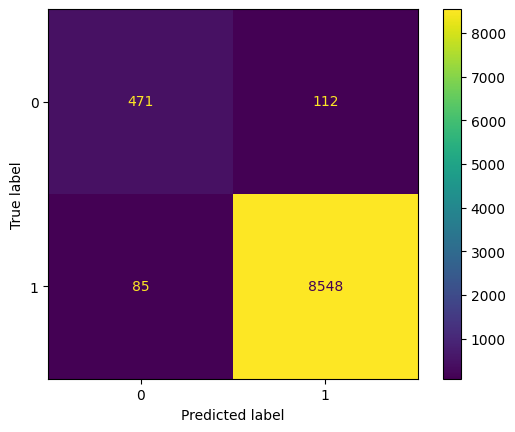

288/288 [==============================] - 0s 1ms/step
ROC AUC: 0.9785


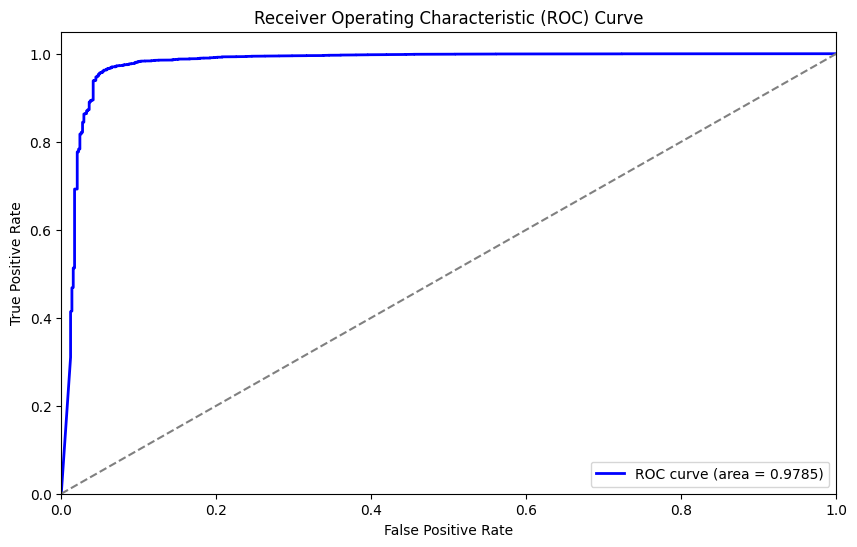

Mean Absolute Error (MAE): 0.0214
Mean Squared Error (MSE): 0.0214
Root Mean Squared Error (RMSE): 0.1462


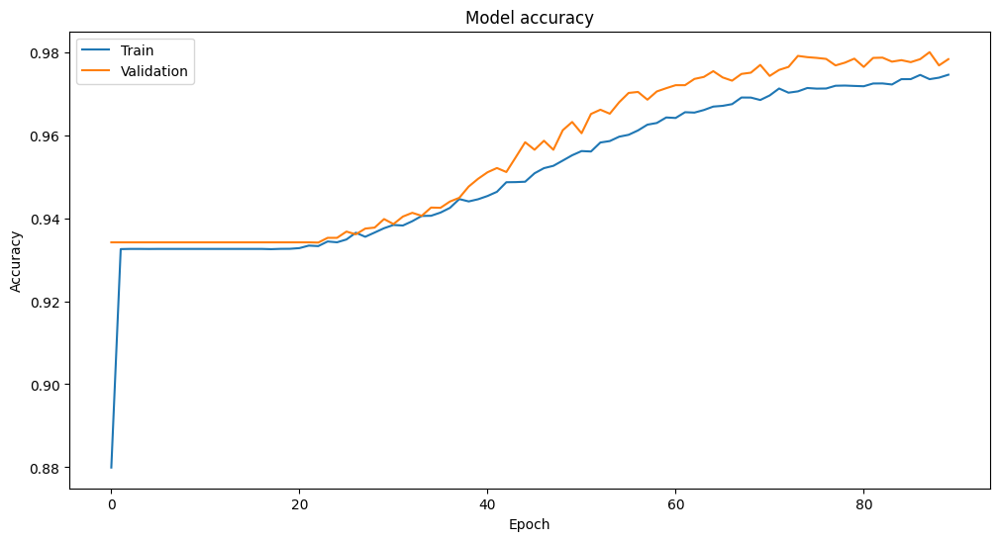

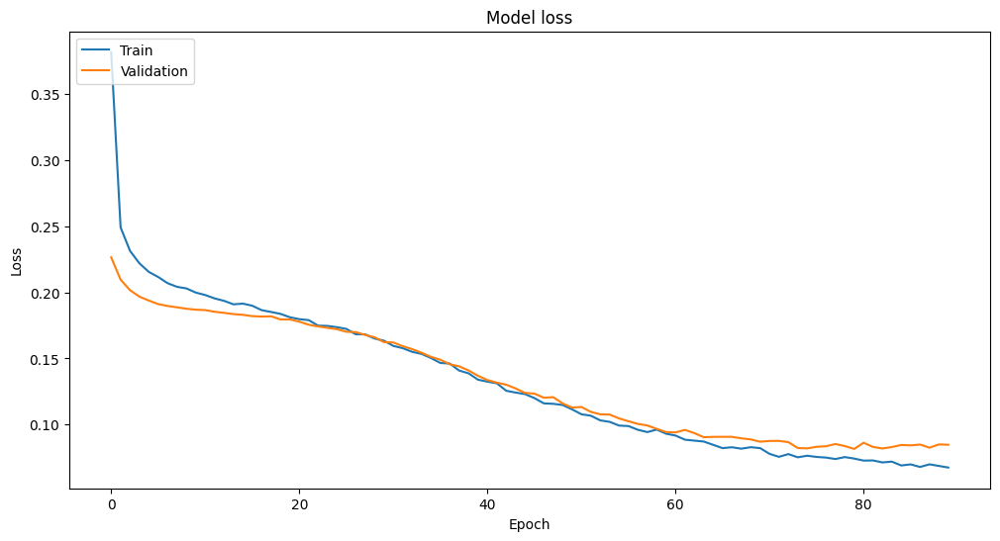

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, roc_auc_score, mean_absolute_error, mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame
# Create additional features
data['total_delay'] = data['carrier_delay'] + data['weather_delay'] + data['nas_delay'] + data['security_delay'] + data['late_aircraft_delay']

# Select features and target
features = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay', 'total_delay', 'carrier', 'airport']
X = data[features]
y = data['delayed']

# Identify categorical and numerical columns
categorical_cols = ['carrier', 'airport']
numerical_cols = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay', 'total_delay']

# Preprocessing for numerical data (with imputation)
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# Preprocess the data
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

# Convert sparse matrix to dense matrix
X_train = X_train.toarray()
X_test = X_test.toarray()

# Check for NaN values
print("NaN values in X_train:", np.isnan(X_train).sum())
print("NaN values in X_test:", np.isnan(X_test).sum())
print("NaN values in y_train:", np.isnan(y_train).sum())
print("NaN values in y_test:", np.isnan(y_test).sum())

# Define the model with increased dropout
model = Sequential([
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(32, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

# Compile the model with a different optimizer
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Callbacks for early stopping and saving the best model
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('best_model.h5', save_best_only=True, monitor='val_loss')

# Train the model
history = model.fit(X_train, y_train, epochs=120, batch_size=64, validation_split=0.2,
                    callbacks=[early_stopping, model_checkpoint])

# Evaluate the model on the test set
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy:.4f}")

# Evaluate the model on the training set
train_loss, train_accuracy = model.evaluate(X_train, y_train)
print(f"Training Accuracy: {train_accuracy:.4f}")

# Calculate additional performance metrics
y_pred = (model.predict(X_test) > 0.5).astype("int32")
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Calculate specificity
conf_matrix = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = conf_matrix.ravel()
specificity = tn / (tn + fp)

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Specificity: {specificity:.4f}")

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)
disp.plot()
plt.show()

# Calculate ROC curve and AUC
y_pred_proba = model.predict(X_test).ravel()
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)
print(f"ROC AUC: {roc_auc:.4f}")

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Calculate error metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")

# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()



IMPEMENTING AN ANN ON 80 PERCENT TRAIN DATASET




IMPEMENTING AN ANN ON 20 PERCENT TEST DATASET





NaN values in X_train: 0
NaN values in X_test: 0
NaN values in y_train: 0
NaN values in y_test: 0
Epoch 1/120
922/922 [==============================] - 5s 4ms/step - loss: 0.3520 - accuracy: 0.9149 - val_loss: 0.2282 - val_accuracy: 0.9339
Epoch 2/120
 45/922 [>.............................] - ETA: 3s - loss: 0.2575 - accuracy: 0.9333

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


922/922 [==============================] - 4s 4ms/step - loss: 0.2470 - accuracy: 0.9321 - val_loss: 0.2136 - val_accuracy: 0.9339
Epoch 3/120
922/922 [==============================] - 4s 4ms/step - loss: 0.2315 - accuracy: 0.9321 - val_loss: 0.2063 - val_accuracy: 0.9339
Epoch 4/120
922/922 [==============================] - 4s 4ms/step - loss: 0.2225 - accuracy: 0.9321 - val_loss: 0.2020 - val_accuracy: 0.9339
Epoch 5/120
922/922 [==============================] - 4s 4ms/step - loss: 0.2156 - accuracy: 0.9321 - val_loss: 0.1986 - val_accuracy: 0.9339
Epoch 6/120
922/922 [==============================] - 4s 4ms/step - loss: 0.2107 - accuracy: 0.9321 - val_loss: 0.1961 - val_accuracy: 0.9339
Epoch 7/120
922/922 [==============================] - 4s 4ms/step - loss: 0.2067 - accuracy: 0.9321 - val_loss: 0.1946 - val_accuracy: 0.9339
Epoch 8/120
922/922 [==============================] - 4s 4ms/step - loss: 0.2033 - accuracy: 0.9321 - val_loss: 0.1927 - val_accuracy: 0.9339
Epoch 9/120

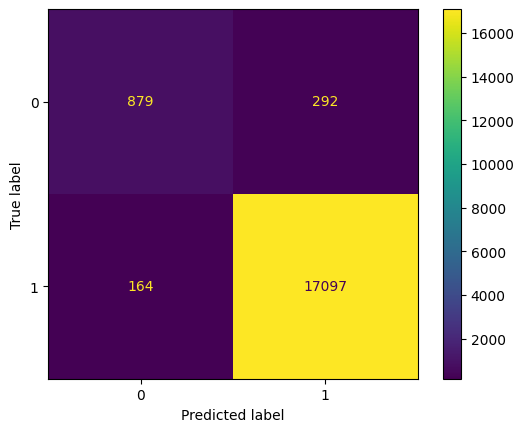

576/576 [==============================] - 1s 1ms/step
ROC AUC: 0.9720


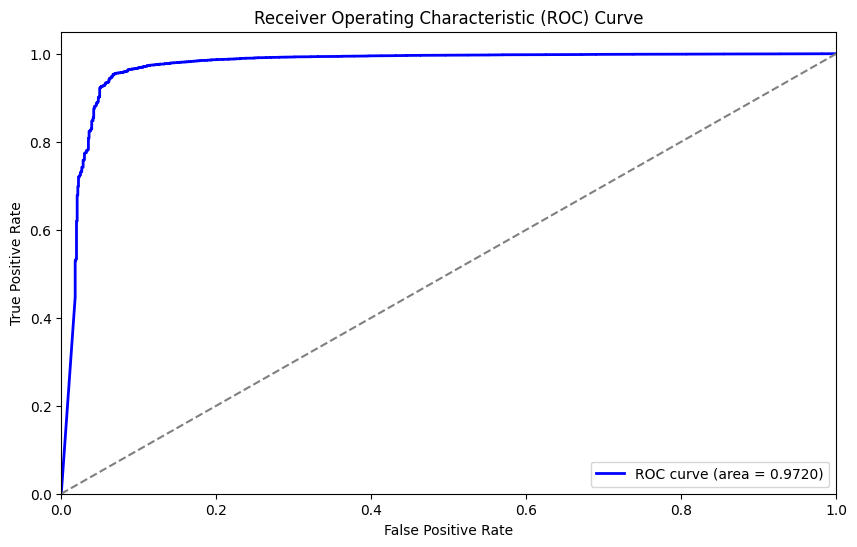

Mean Absolute Error (MAE): 0.0247
Mean Squared Error (MSE): 0.0247
Root Mean Squared Error (RMSE): 0.1573


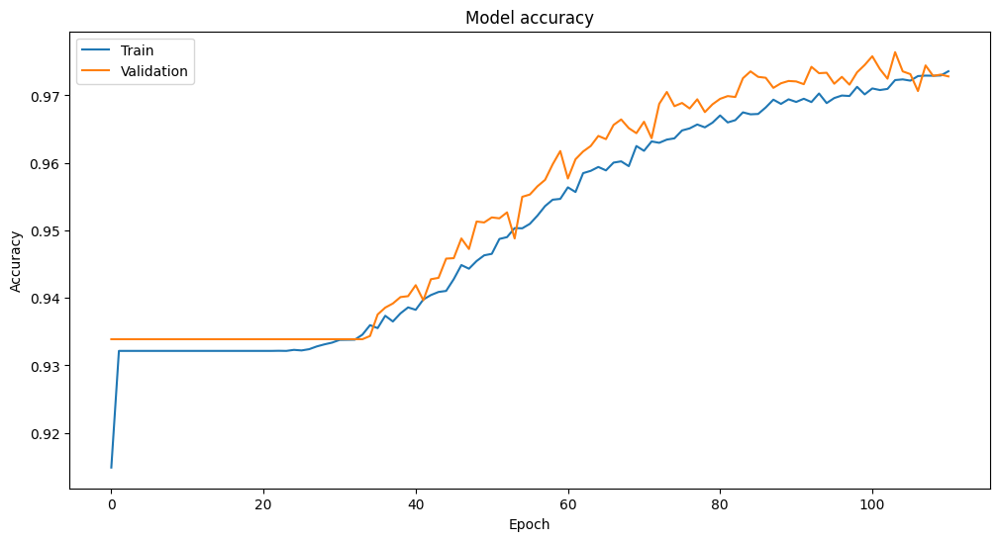

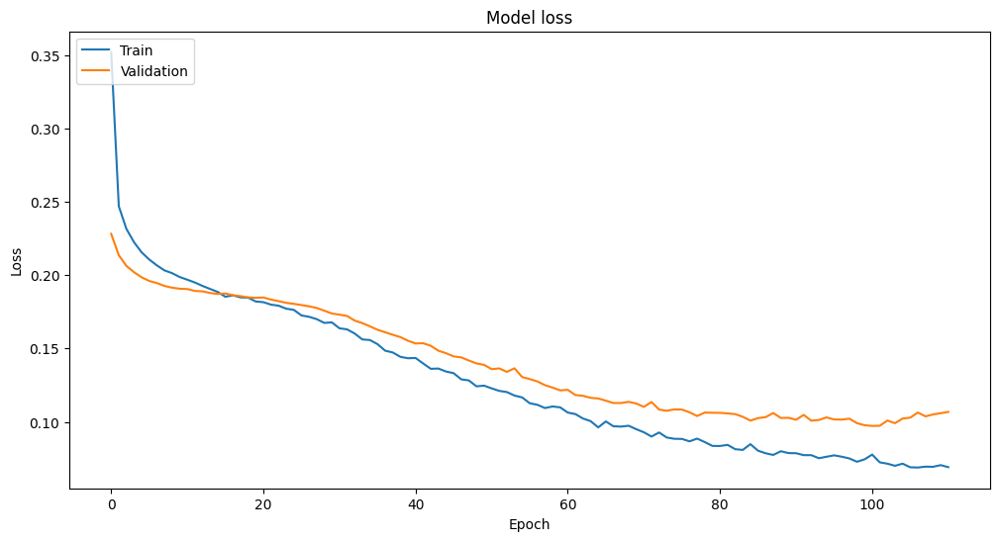

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, roc_auc_score, mean_absolute_error, mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame
# Create additional features
data['total_delay'] = data['carrier_delay'] + data['weather_delay'] + data['nas_delay'] + data['security_delay'] + data['late_aircraft_delay']

# Select features and target
features = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay', 'total_delay', 'carrier', 'airport']
X = data[features]
y = data['delayed']

# Identify categorical and numerical columns
categorical_cols = ['carrier', 'airport']
numerical_cols = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay', 'total_delay']

# Preprocessing for numerical data (with imputation)
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Preprocess the data
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

# Convert sparse matrix to dense matrix
X_train = X_train.toarray()
X_test = X_test.toarray()

# Check for NaN values
print("NaN values in X_train:", np.isnan(X_train).sum())
print("NaN values in X_test:", np.isnan(X_test).sum())
print("NaN values in y_train:", np.isnan(y_train).sum())
print("NaN values in y_test:", np.isnan(y_test).sum())

# Define the model with increased dropout
model = Sequential([
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(32, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

# Compile the model with a different optimizer
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Callbacks for early stopping and saving the best model
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('best_model.h5', save_best_only=True, monitor='val_loss')

# Train the model
history = model.fit(X_train, y_train, epochs=120, batch_size=64, validation_split=0.2,
                    callbacks=[early_stopping, model_checkpoint])

# Evaluate the model on the test set
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy:.4f}")

# Evaluate the model on the training set
train_loss, train_accuracy = model.evaluate(X_train, y_train)
print(f"Training Accuracy: {train_accuracy:.4f}")

# Calculate additional performance metrics
y_pred = (model.predict(X_test) > 0.5).astype("int32")
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Calculate specificity
conf_matrix = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = conf_matrix.ravel()
specificity = tn / (tn + fp)

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Specificity: {specificity:.4f}")

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)
disp.plot()
plt.show()

# Calculate ROC curve and AUC
y_pred_proba = model.predict(X_test).ravel()
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)
print(f"ROC AUC: {roc_auc:.4f}")

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Calculate error metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")

# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


ANN AT 0.3 TEST DATASET

NaN values in X_train: 0
NaN values in X_test: 0
NaN values in y_train: 0
NaN values in y_test: 0
Epoch 1/120
807/807 [==============================] - 5s 4ms/step - loss: 0.3644 - accuracy: 0.9108 - val_loss: 0.2295 - val_accuracy: 0.9344
Epoch 2/120
 49/807 [>.............................] - ETA: 2s - loss: 0.2505 - accuracy: 0.9362

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


807/807 [==============================] - 3s 4ms/step - loss: 0.2551 - accuracy: 0.9321 - val_loss: 0.2140 - val_accuracy: 0.9344
Epoch 3/120
807/807 [==============================] - 3s 4ms/step - loss: 0.2381 - accuracy: 0.9321 - val_loss: 0.2069 - val_accuracy: 0.9344
Epoch 4/120
807/807 [==============================] - 3s 4ms/step - loss: 0.2266 - accuracy: 0.9321 - val_loss: 0.2022 - val_accuracy: 0.9344
Epoch 5/120
807/807 [==============================] - 3s 4ms/step - loss: 0.2211 - accuracy: 0.9321 - val_loss: 0.1997 - val_accuracy: 0.9344
Epoch 6/120
807/807 [==============================] - 3s 4ms/step - loss: 0.2144 - accuracy: 0.9321 - val_loss: 0.1969 - val_accuracy: 0.9344
Epoch 7/120
807/807 [==============================] - 3s 4ms/step - loss: 0.2111 - accuracy: 0.9321 - val_loss: 0.1953 - val_accuracy: 0.9344
Epoch 8/120
807/807 [==============================] - 3s 4ms/step - loss: 0.2089 - accuracy: 0.9321 - val_loss: 0.1943 - val_accuracy: 0.9344
Epoch 9/120

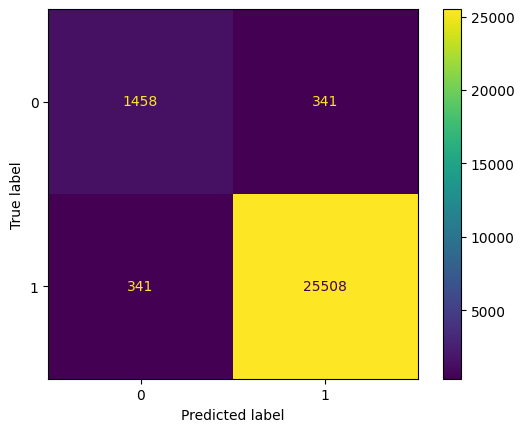

864/864 [==============================] - 1s 1ms/step
ROC AUC: 0.9730


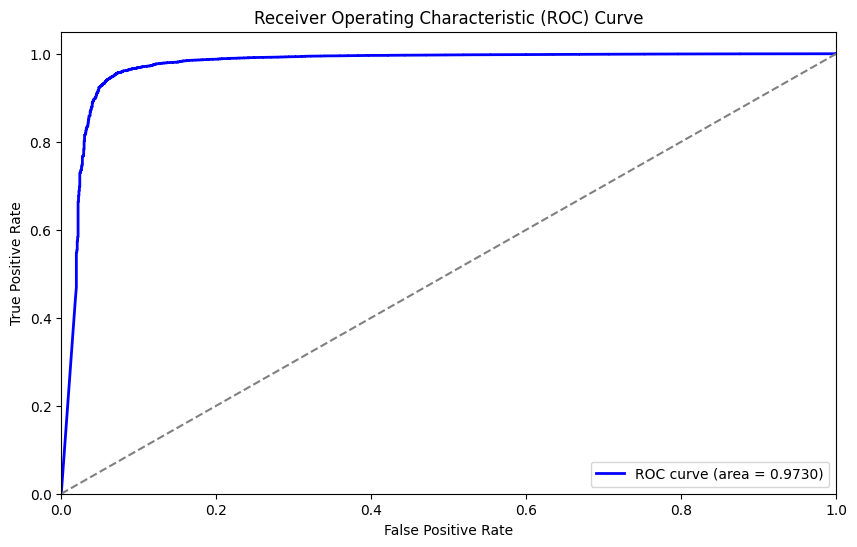

Mean Absolute Error (MAE): 0.0247
Mean Squared Error (MSE): 0.0247
Root Mean Squared Error (RMSE): 0.1571


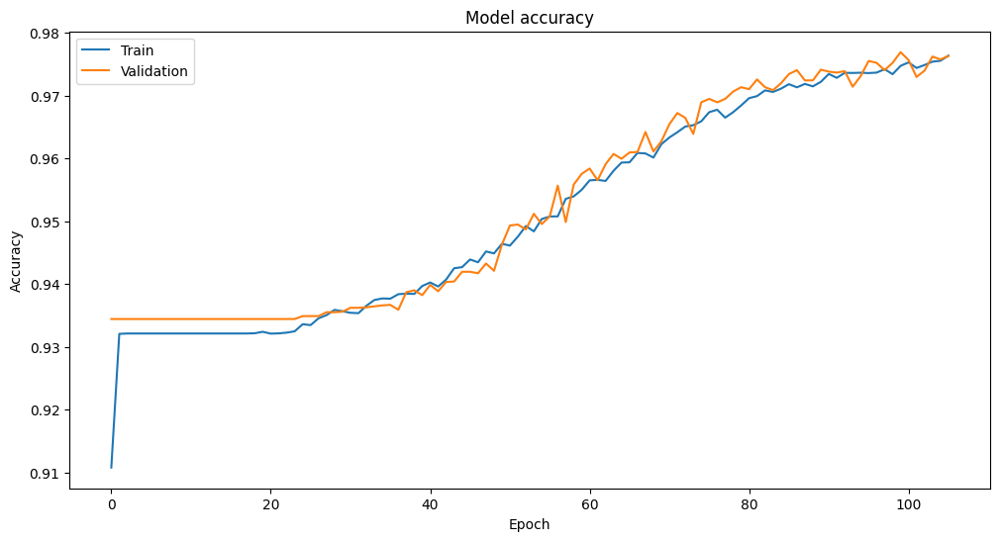

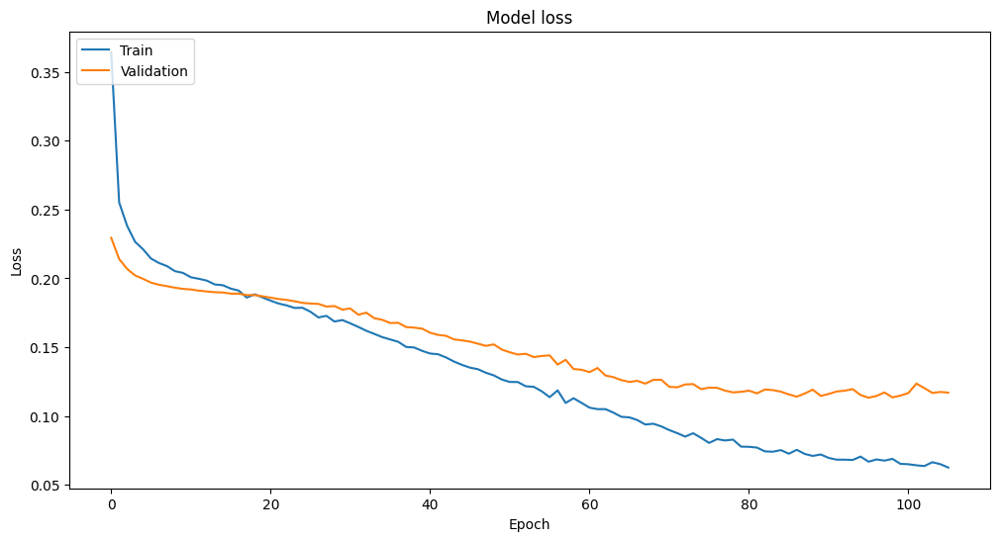

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, roc_auc_score, mean_absolute_error, mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame
# Create additional features
data['total_delay'] = data['carrier_delay'] + data['weather_delay'] + data['nas_delay'] + data['security_delay'] + data['late_aircraft_delay']

# Select features and target
features = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay', 'total_delay', 'carrier', 'airport']
X = data[features]
y = data['delayed']

# Identify categorical and numerical columns
categorical_cols = ['carrier', 'airport']
numerical_cols = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay', 'total_delay']

# Preprocessing for numerical data (with imputation)
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Preprocess the data
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

# Convert sparse matrix to dense matrix
X_train = X_train.toarray()
X_test = X_test.toarray()

# Check for NaN values
print("NaN values in X_train:", np.isnan(X_train).sum())
print("NaN values in X_test:", np.isnan(X_test).sum())
print("NaN values in y_train:", np.isnan(y_train).sum())
print("NaN values in y_test:", np.isnan(y_test).sum())

# Define the model with increased dropout
model = Sequential([
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(32, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

# Compile the model with a different optimizer
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Callbacks for early stopping and saving the best model
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('best_model.h5', save_best_only=True, monitor='val_loss')

# Train the model
history = model.fit(X_train, y_train, epochs=120, batch_size=64, validation_split=0.2,
                    callbacks=[early_stopping, model_checkpoint])

# Evaluate the model on the test set
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy:.4f}")

# Evaluate the model on the training set
train_loss, train_accuracy = model.evaluate(X_train, y_train)
print(f"Training Accuracy: {train_accuracy:.4f}")

# Calculate additional performance metrics
y_pred = (model.predict(X_test) > 0.5).astype("int32")
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Calculate specificity
conf_matrix = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = conf_matrix.ravel()
specificity = tn / (tn + fp)

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Specificity: {specificity:.4f}")

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)
disp.plot()
plt.show()

# Calculate ROC curve and AUC
y_pred_proba = model.predict(X_test).ravel()
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)
print(f"ROC AUC: {roc_auc:.4f}")

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Calculate error metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")

# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()



ANN AT 0.4 PERCENT TEST DATASET

NaN values in X_train: 0
NaN values in X_test: 0
NaN values in y_train: 0
NaN values in y_test: 0
Epoch 1/120
692/692 [==============================] - 6s 7ms/step - loss: 0.3506 - accuracy: 0.9254 - val_loss: 0.2298 - val_accuracy: 0.9342
Epoch 2/120
 48/692 [=>............................] - ETA: 2s - loss: 0.2728 - accuracy: 0.9268

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


692/692 [==============================] - 3s 4ms/step - loss: 0.2500 - accuracy: 0.9319 - val_loss: 0.2152 - val_accuracy: 0.9342
Epoch 3/120
692/692 [==============================] - 3s 4ms/step - loss: 0.2363 - accuracy: 0.9319 - val_loss: 0.2081 - val_accuracy: 0.9342
Epoch 4/120
692/692 [==============================] - 3s 4ms/step - loss: 0.2272 - accuracy: 0.9319 - val_loss: 0.2034 - val_accuracy: 0.9342
Epoch 5/120
692/692 [==============================] - 3s 4ms/step - loss: 0.2207 - accuracy: 0.9319 - val_loss: 0.2002 - val_accuracy: 0.9342
Epoch 6/120
692/692 [==============================] - 3s 4ms/step - loss: 0.2153 - accuracy: 0.9319 - val_loss: 0.1976 - val_accuracy: 0.9342
Epoch 7/120
692/692 [==============================] - 3s 4ms/step - loss: 0.2133 - accuracy: 0.9319 - val_loss: 0.1960 - val_accuracy: 0.9342
Epoch 8/120
692/692 [==============================] - 3s 4ms/step - loss: 0.2109 - accuracy: 0.9319 - val_loss: 0.1945 - val_accuracy: 0.9342
Epoch 9/120

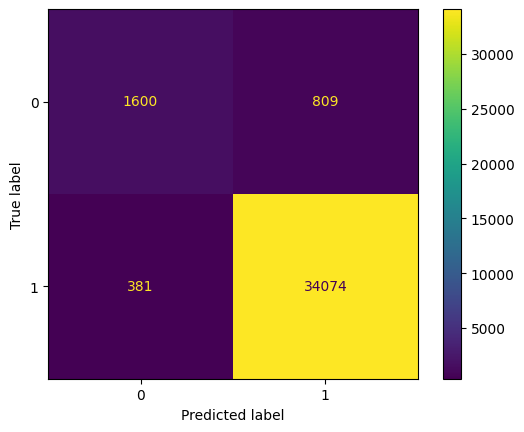

1152/1152 [==============================] - 2s 1ms/step
ROC AUC: 0.9599


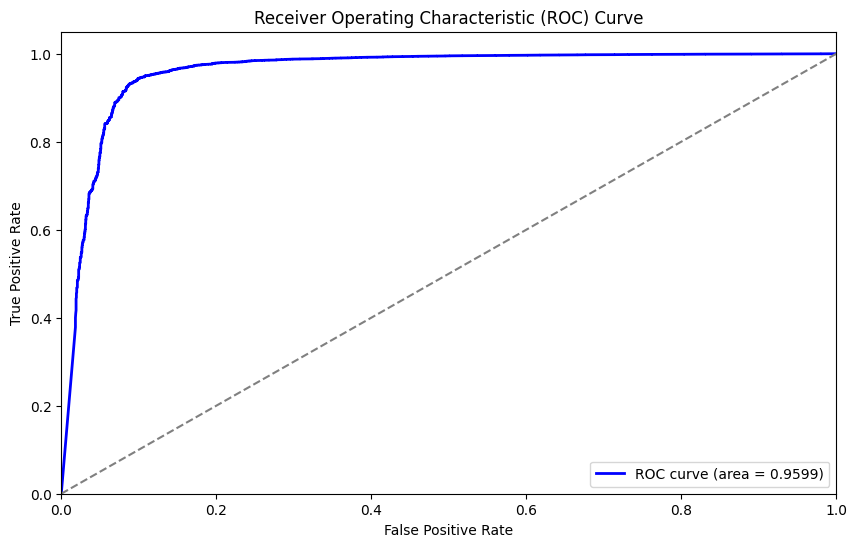

Mean Absolute Error (MAE): 0.0323
Mean Squared Error (MSE): 0.0323
Root Mean Squared Error (RMSE): 0.1797


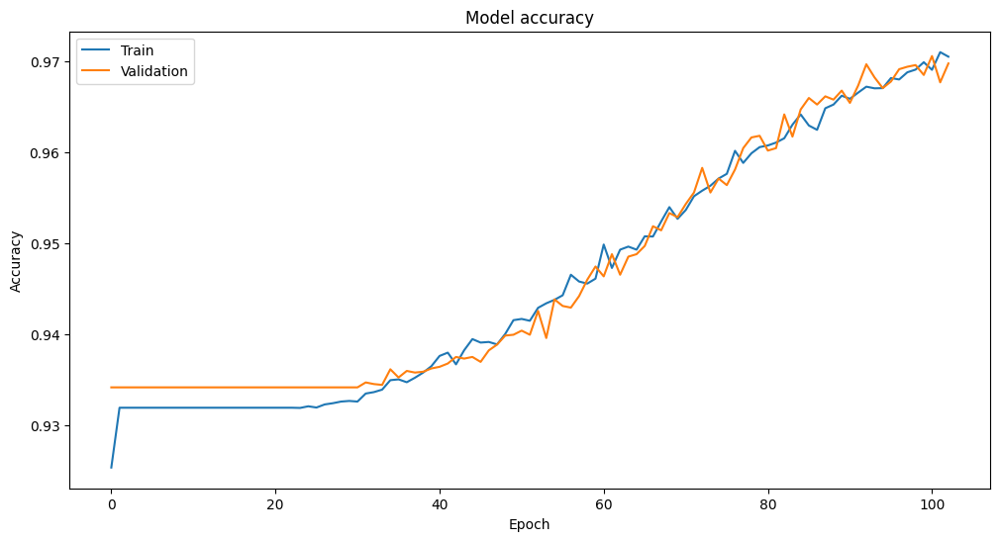

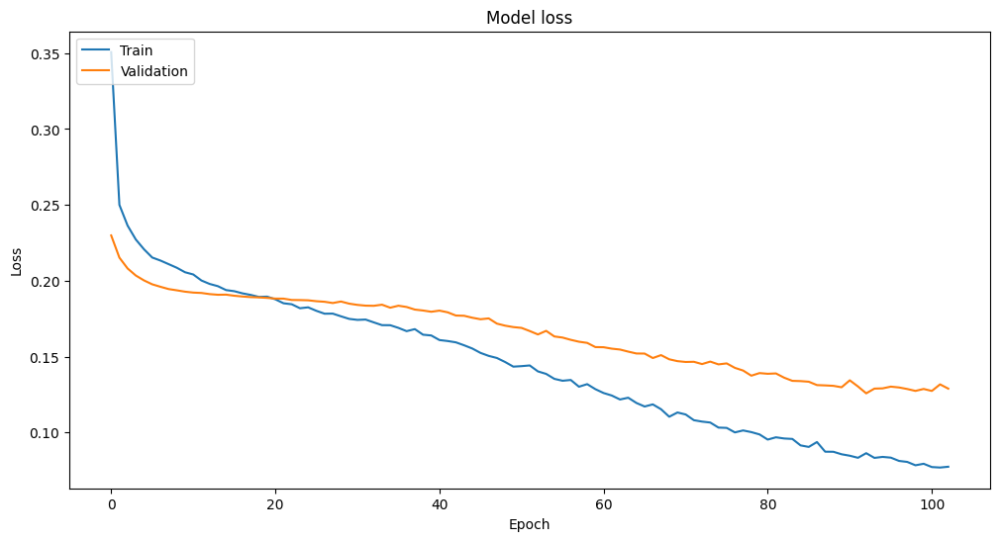

In [ ]:



import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, roc_auc_score, mean_absolute_error, mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame
# Create additional features
data['total_delay'] = data['carrier_delay'] + data['weather_delay'] + data['nas_delay'] + data['security_delay'] + data['late_aircraft_delay']

# Select features and target
features = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay', 'total_delay', 'carrier', 'airport']
X = data[features]
y = data['delayed']

# Identify categorical and numerical columns
categorical_cols = ['carrier', 'airport']
numerical_cols = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay', 'total_delay']

# Preprocessing for numerical data (with imputation)
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

# Preprocess the data
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

# Convert sparse matrix to dense matrix
X_train = X_train.toarray()
X_test = X_test.toarray()

# Check for NaN values
print("NaN values in X_train:", np.isnan(X_train).sum())
print("NaN values in X_test:", np.isnan(X_test).sum())
print("NaN values in y_train:", np.isnan(y_train).sum())
print("NaN values in y_test:", np.isnan(y_test).sum())

# Define the model with increased dropout
model = Sequential([
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(64, activation='relu'),
    Dropout(0.5),
    Dense(32, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

# Compile the model with a different optimizer
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Callbacks for early stopping and saving the best model
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('best_model.h5', save_best_only=True, monitor='val_loss')

# Train the model
history = model.fit(X_train, y_train, epochs=120, batch_size=64, validation_split=0.2,
                    callbacks=[early_stopping, model_checkpoint])

# Evaluate the model on the test set
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy:.4f}")

# Evaluate the model on the training set
train_loss, train_accuracy = model.evaluate(X_train, y_train)
print(f"Training Accuracy: {train_accuracy:.4f}")

# Calculate additional performance metrics
y_pred = (model.predict(X_test) > 0.5).astype("int32")
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Calculate specificity
conf_matrix = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = conf_matrix.ravel()
specificity = tn / (tn + fp)

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Specificity: {specificity:.4f}")

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)
disp.plot()
plt.show()

# Calculate ROC curve and AUC
y_pred_proba = model.predict(X_test).ravel()
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)
print(f"ROC AUC: {roc_auc:.4f}")

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Calculate error metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")

# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


In [ ]:
!pip install tensorflow


APPLYING BIDIRECTIONAL LSTM at 0.1 test dataset

NaN values in X_train: 0
NaN values in X_test: 0
NaN values in y_train: 0
NaN values in y_test: 0
Epoch 1/120
519/519 [==============================] - 11s 12ms/step - loss: 0.4589 - accuracy: 0.9233 - val_loss: 0.2428 - val_accuracy: 0.9342
Epoch 2/120
519/519 [==============================] - 5s 11ms/step - loss: 0.2317 - accuracy: 0.9326 - val_loss: 0.2153 - val_accuracy: 0.9342
Epoch 3/120
519/519 [==============================] - 5s 10ms/step - loss: 0.2159 - accuracy: 0.9326 - val_loss: 0.2066 - val_accuracy: 0.9342
Epoch 4/120
519/519 [==============================] - 5s 10ms/step - loss: 0.2082 - accuracy: 0.9326 - val_loss: 0.2017 - val_accuracy: 0.9342
Epoch 5/120
519/519 [==============================] - 5s 10ms/step - loss: 0.2042 - accuracy: 0.9326 - val_loss: 0.1986 - val_accuracy: 0.9342
Epoch 6/120
519/519 [==============================] - 5s 10ms/step - loss: 0.2009 - accuracy: 0.9326 - val_loss: 0.1966 - val_accuracy: 0.9342
Epoch 7/120
519/519 [================

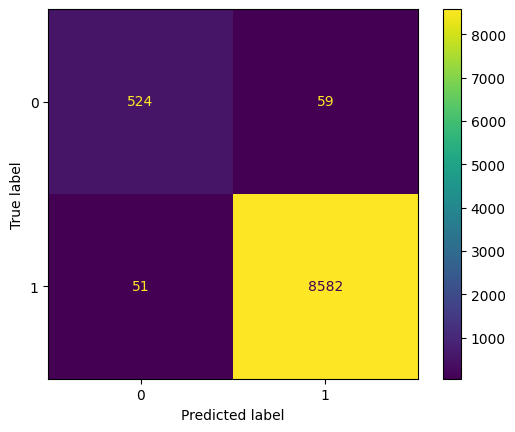

288/288 [==============================] - 1s 2ms/step
ROC AUC: 0.9899


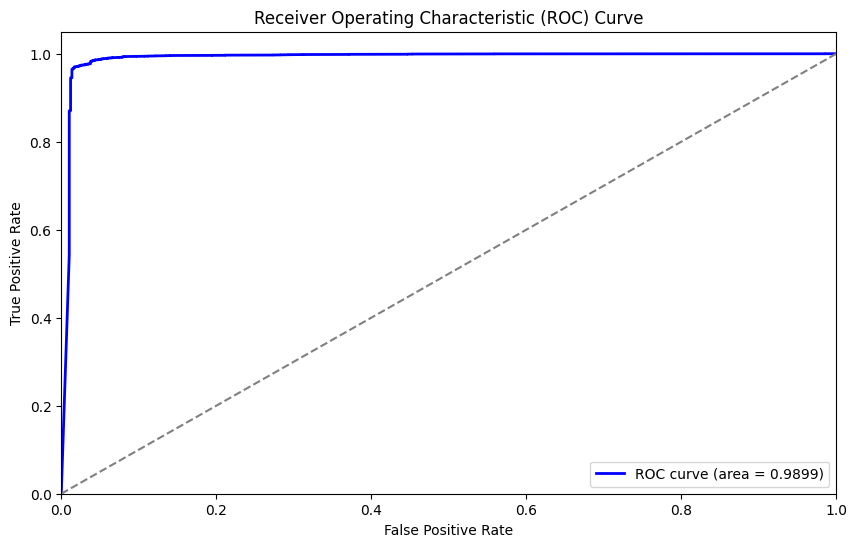

Mean Absolute Error (MAE): 0.0119
Mean Squared Error (MSE): 0.0119
Root Mean Squared Error (RMSE): 0.1093


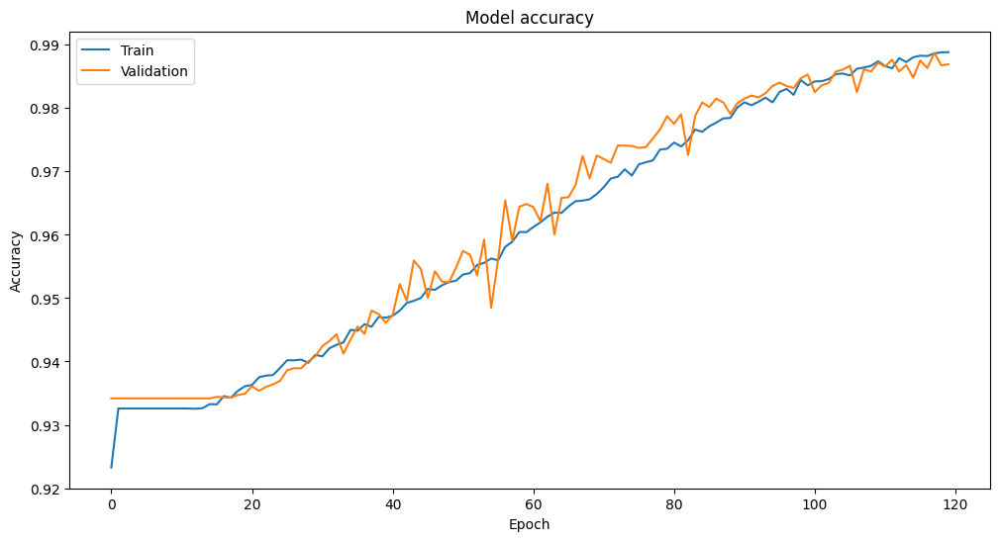

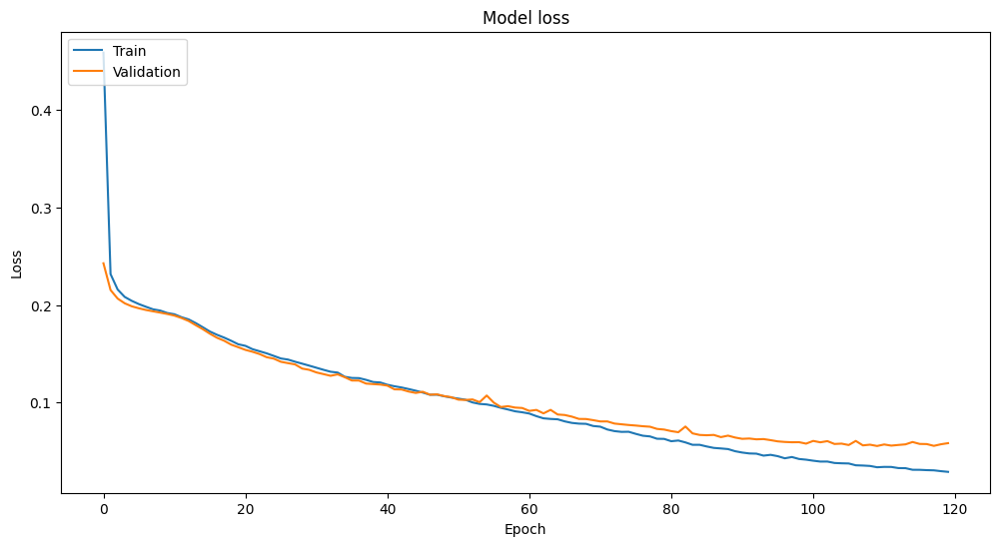

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, roc_auc_score, mean_absolute_error, mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, LSTM, Bidirectional
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame
# Create additional features
data['total_delay'] = data['carrier_delay'] + data['weather_delay'] + data['nas_delay'] + data['security_delay'] + data['late_aircraft_delay']

# Select features and target
features = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay',
            'total_delay', 'carrier', 'airport']
X = data[features]
y = data['delayed']

# Identify categorical and numerical columns
categorical_cols = ['carrier', 'airport']
numerical_cols = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay', 'total_delay']

# Preprocessing for numerical data (with imputation)
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# Preprocess the data
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

# Convert sparse matrix to dense matrix
X_train = X_train.toarray()
X_test = X_test.toarray()

# Reshape input data to 3D for LSTM [samples, timesteps, features]
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

# Check for NaN values
print("NaN values in X_train:", np.isnan(X_train).sum())
print("NaN values in X_test:", np.isnan(X_test).sum())
print("NaN values in y_train:", np.isnan(y_train).sum())
print("NaN values in y_test:", np.isnan(y_test).sum())

# Define the Bidirectional LSTM model
model = Sequential([
    Bidirectional(LSTM(128, activation='relu', return_sequences=True), input_shape=(X_train.shape[1], X_train.shape[2])),
    Dropout(0.4),
    Bidirectional(LSTM(64, activation='relu', return_sequences=False)),
    Dropout(0.4),
    Dense(1, activation='sigmoid')
])

# Compile the model with a different optimizer
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Callbacks for early stopping and saving the best model
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('best_model.keras', save_best_only=True, monitor='val_loss')

# Train the model
history = model.fit(X_train, y_train, epochs=120, batch_size=128, validation_split=0.2,
                    callbacks=[early_stopping, model_checkpoint])

# Evaluate the model on the test set
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy:.4f}")

# Evaluate the model on the training set
train_loss, train_accuracy = model.evaluate(X_train, y_train)
print(f"Training Accuracy: {train_accuracy:.4f}")

# Calculate additional performance metrics
y_pred = (model.predict(X_test) > 0.5).astype("int32")
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Calculate specificity
conf_matrix = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = conf_matrix.ravel()
specificity = tn / (tn + fp)

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Specificity: {specificity:.4f}")

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)
disp.plot()
plt.show()

# Calculate ROC curve and AUC
y_pred_proba = model.predict(X_test).ravel()
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)
print(f"ROC AUC: {roc_auc:.4f}")

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Calculate error metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")

# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


APPLYING BIDIRECTIONAL LSTM at 0.2 test dataset

NaN values in X_train: 0
NaN values in X_test: 0
NaN values in y_train: 0
NaN values in y_test: 0
Epoch 1/120
461/461 [==============================] - 11s 12ms/step - loss: 0.4925 - accuracy: 0.9195 - val_loss: 0.2527 - val_accuracy: 0.9339
Epoch 2/120
461/461 [==============================] - 5s 11ms/step - loss: 0.2378 - accuracy: 0.9321 - val_loss: 0.2191 - val_accuracy: 0.9339
Epoch 3/120
461/461 [==============================] - 5s 11ms/step - loss: 0.2192 - accuracy: 0.9321 - val_loss: 0.2100 - val_accuracy: 0.9339
Epoch 4/120
461/461 [==============================] - 5s 10ms/step - loss: 0.2116 - accuracy: 0.9321 - val_loss: 0.2046 - val_accuracy: 0.9339
Epoch 5/120
461/461 [==============================] - 5s 10ms/step - loss: 0.2056 - accuracy: 0.9321 - val_loss: 0.2015 - val_accuracy: 0.9339
Epoch 6/120
461/461 [==============================] - 5s 10ms/step - loss: 0.2023 - accuracy: 0.9321 - val_loss: 0.1990 - val_accuracy: 0.9339
Epoch 7/120
461/461 [================

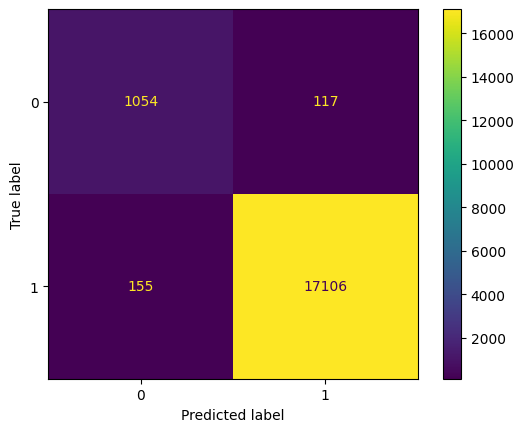

576/576 [==============================] - 1s 2ms/step
ROC AUC: 0.9842


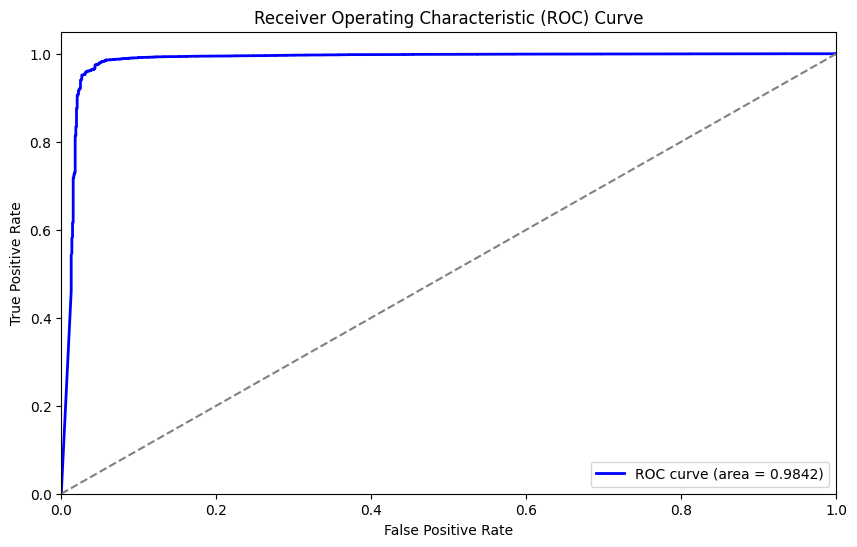

Mean Absolute Error (MAE): 0.0148
Mean Squared Error (MSE): 0.0148
Root Mean Squared Error (RMSE): 0.1215


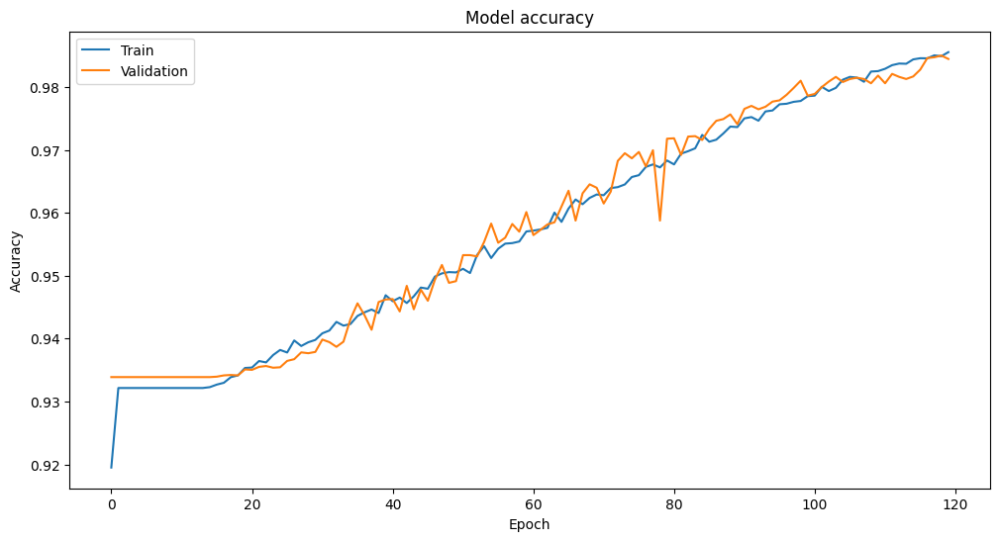

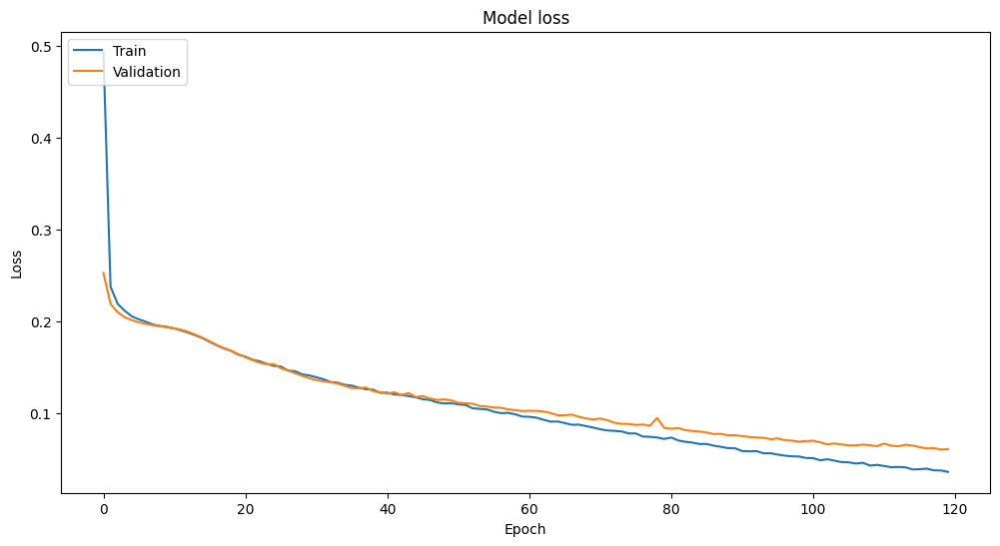

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, roc_auc_score, mean_absolute_error, mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, LSTM, Bidirectional
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame
# Create additional features
data['total_delay'] = data['carrier_delay'] + data['weather_delay'] + data['nas_delay'] + data['security_delay'] + data['late_aircraft_delay']

# Select features and target
features = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay',
            'total_delay', 'carrier', 'airport']
X = data[features]
y = data['delayed']

# Identify categorical and numerical columns
categorical_cols = ['carrier', 'airport']
numerical_cols = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay', 'total_delay']

# Preprocessing for numerical data (with imputation)
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Preprocess the data
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

# Convert sparse matrix to dense matrix
X_train = X_train.toarray()
X_test = X_test.toarray()

# Reshape input data to 3D for LSTM [samples, timesteps, features]
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

# Check for NaN values
print("NaN values in X_train:", np.isnan(X_train).sum())
print("NaN values in X_test:", np.isnan(X_test).sum())
print("NaN values in y_train:", np.isnan(y_train).sum())
print("NaN values in y_test:", np.isnan(y_test).sum())

# Define the Bidirectional LSTM model
model = Sequential([
    Bidirectional(LSTM(128, activation='relu', return_sequences=True), input_shape=(X_train.shape[1], X_train.shape[2])),
    Dropout(0.4),
    Bidirectional(LSTM(64, activation='relu', return_sequences=False)),
    Dropout(0.4),
    Dense(1, activation='sigmoid')
])

# Compile the model with a different optimizer
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Callbacks for early stopping and saving the best model
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('best_model.keras', save_best_only=True, monitor='val_loss')

# Train the model
history = model.fit(X_train, y_train, epochs=120, batch_size=128, validation_split=0.2,
                    callbacks=[early_stopping, model_checkpoint])

# Evaluate the model on the test set
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy:.4f}")

# Evaluate the model on the training set
train_loss, train_accuracy = model.evaluate(X_train, y_train)
print(f"Training Accuracy: {train_accuracy:.4f}")

# Calculate additional performance metrics
y_pred = (model.predict(X_test) > 0.5).astype("int32")
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Calculate specificity
conf_matrix = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = conf_matrix.ravel()
specificity = tn / (tn + fp)

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Specificity: {specificity:.4f}")

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)
disp.plot()
plt.show()

# Calculate ROC curve and AUC
y_pred_proba = model.predict(X_test).ravel()
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)
print(f"ROC AUC: {roc_auc:.4f}")

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Calculate error metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")

# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


APPLYING BIDIRECTIONAL LSTM at 0.3 test dataset

NaN values in X_train: 0
NaN values in X_test: 0
NaN values in y_train: 0
NaN values in y_test: 0
Epoch 1/120
404/404 [==============================] - 10s 12ms/step - loss: 0.5142 - accuracy: 0.9280 - val_loss: 0.2603 - val_accuracy: 0.9344
Epoch 2/120
404/404 [==============================] - 4s 10ms/step - loss: 0.2413 - accuracy: 0.9321 - val_loss: 0.2206 - val_accuracy: 0.9344
Epoch 3/120
404/404 [==============================] - 4s 10ms/step - loss: 0.2214 - accuracy: 0.9321 - val_loss: 0.2107 - val_accuracy: 0.9344
Epoch 4/120
404/404 [==============================] - 4s 10ms/step - loss: 0.2129 - accuracy: 0.9321 - val_loss: 0.2054 - val_accuracy: 0.9344
Epoch 5/120
404/404 [==============================] - 4s 10ms/step - loss: 0.2076 - accuracy: 0.9321 - val_loss: 0.2022 - val_accuracy: 0.9344
Epoch 6/120
404/404 [==============================] - 4s 10ms/step - loss: 0.2038 - accuracy: 0.9321 - val_loss: 0.1999 - val_accuracy: 0.9344
Epoch 7/120
404/404 [================

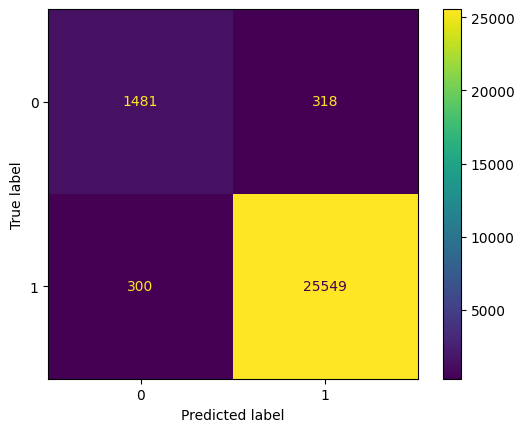

864/864 [==============================] - 2s 2ms/step
ROC AUC: 0.9808


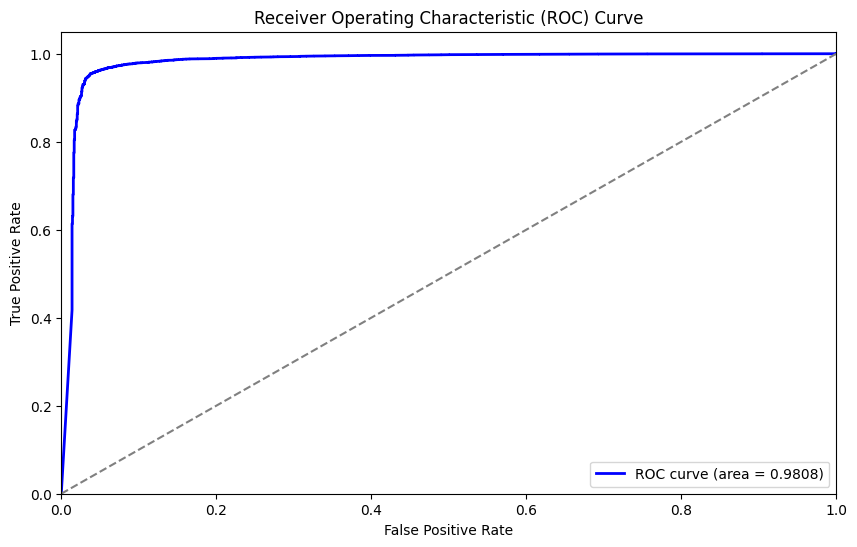

Mean Absolute Error (MAE): 0.0224
Mean Squared Error (MSE): 0.0224
Root Mean Squared Error (RMSE): 0.1495


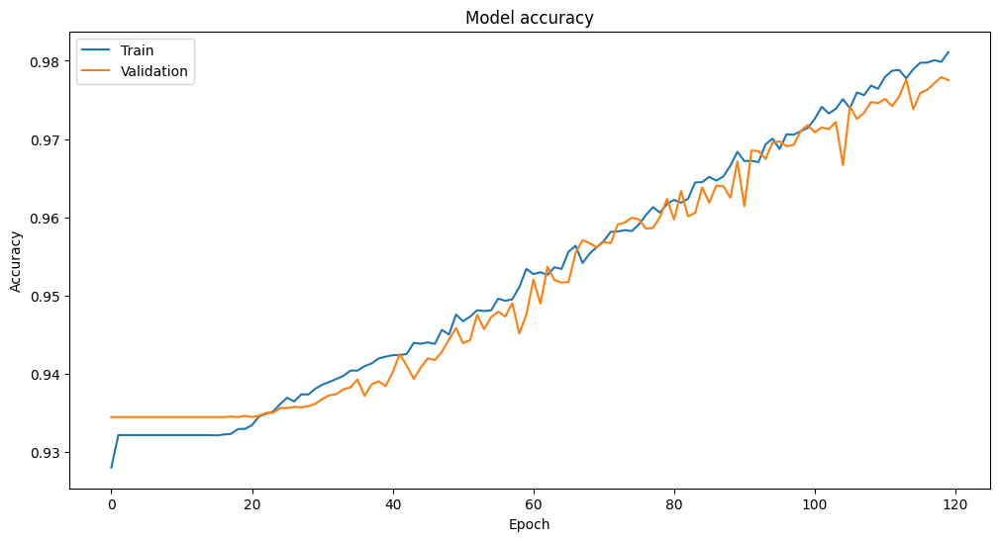

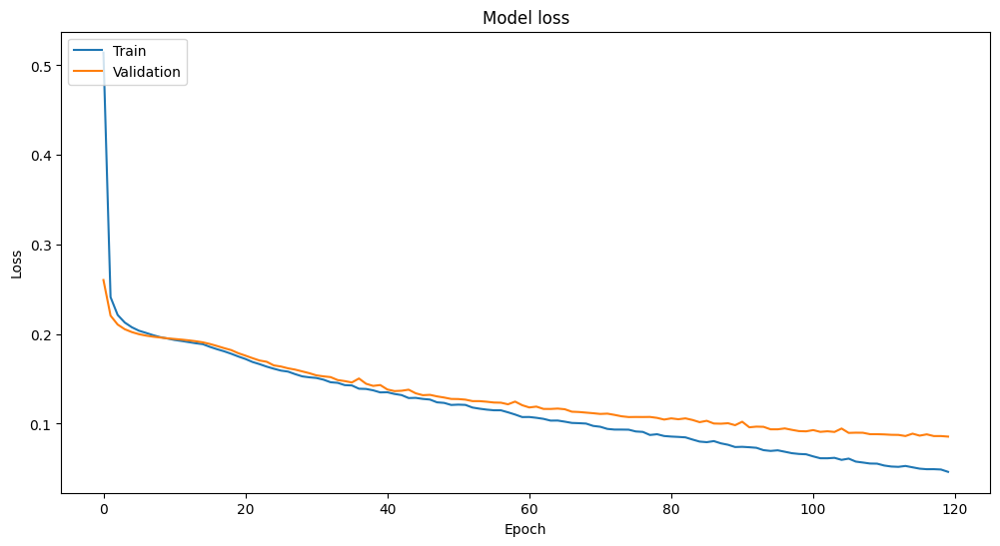

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, roc_auc_score, mean_absolute_error, mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, LSTM, Bidirectional
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame
# Create additional features
data['total_delay'] = data['carrier_delay'] + data['weather_delay'] + data['nas_delay'] + data['security_delay'] + data['late_aircraft_delay']

# Select features and target
features = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay',
            'total_delay', 'carrier', 'airport']
X = data[features]
y = data['delayed']

# Identify categorical and numerical columns
categorical_cols = ['carrier', 'airport']
numerical_cols = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay', 'total_delay']

# Preprocessing for numerical data (with imputation)
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Preprocess the data
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

# Convert sparse matrix to dense matrix
X_train = X_train.toarray()
X_test = X_test.toarray()

# Reshape input data to 3D for LSTM [samples, timesteps, features]
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

# Check for NaN values
print("NaN values in X_train:", np.isnan(X_train).sum())
print("NaN values in X_test:", np.isnan(X_test).sum())
print("NaN values in y_train:", np.isnan(y_train).sum())
print("NaN values in y_test:", np.isnan(y_test).sum())

# Define the Bidirectional LSTM model
model = Sequential([
    Bidirectional(LSTM(128, activation='relu', return_sequences=True), input_shape=(X_train.shape[1], X_train.shape[2])),
    Dropout(0.4),
    Bidirectional(LSTM(64, activation='relu', return_sequences=False)),
    Dropout(0.4),
    Dense(1, activation='sigmoid')
])

# Compile the model with a different optimizer
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Callbacks for early stopping and saving the best model
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('best_model.keras', save_best_only=True, monitor='val_loss')

# Train the model
history = model.fit(X_train, y_train, epochs=120, batch_size=128, validation_split=0.2,
                    callbacks=[early_stopping, model_checkpoint])

# Evaluate the model on the test set
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy:.4f}")

# Evaluate the model on the training set
train_loss, train_accuracy = model.evaluate(X_train, y_train)
print(f"Training Accuracy: {train_accuracy:.4f}")

# Calculate additional performance metrics
y_pred = (model.predict(X_test) > 0.5).astype("int32")
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Calculate specificity
conf_matrix = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = conf_matrix.ravel()
specificity = tn / (tn + fp)

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Specificity: {specificity:.4f}")

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)
disp.plot()
plt.show()

# Calculate ROC curve and AUC
y_pred_proba = model.predict(X_test).ravel()
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)
print(f"ROC AUC: {roc_auc:.4f}")

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Calculate error metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")

# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


APPLYING BIDIRECTIONAL LSTM at 0.4 test dataset

NaN values in X_train: 0
NaN values in X_test: 0
NaN values in y_train: 0
NaN values in y_test: 0
Epoch 1/120
346/346 [==============================] - 9s 13ms/step - loss: 0.5506 - accuracy: 0.9277 - val_loss: 0.3031 - val_accuracy: 0.9342
Epoch 2/120
346/346 [==============================] - 4s 11ms/step - loss: 0.2570 - accuracy: 0.9319 - val_loss: 0.2276 - val_accuracy: 0.9342
Epoch 3/120
346/346 [==============================] - 4s 11ms/step - loss: 0.2277 - accuracy: 0.9319 - val_loss: 0.2152 - val_accuracy: 0.9342
Epoch 4/120
346/346 [==============================] - 4s 10ms/step - loss: 0.2177 - accuracy: 0.9319 - val_loss: 0.2092 - val_accuracy: 0.9342
Epoch 5/120
346/346 [==============================] - 3s 10ms/step - loss: 0.2116 - accuracy: 0.9319 - val_loss: 0.2050 - val_accuracy: 0.9342
Epoch 6/120
346/346 [==============================] - 4s 10ms/step - loss: 0.2068 - accuracy: 0.9319 - val_loss: 0.2022 - val_accuracy: 0.9342
Epoch 7/120
346/346 [=================

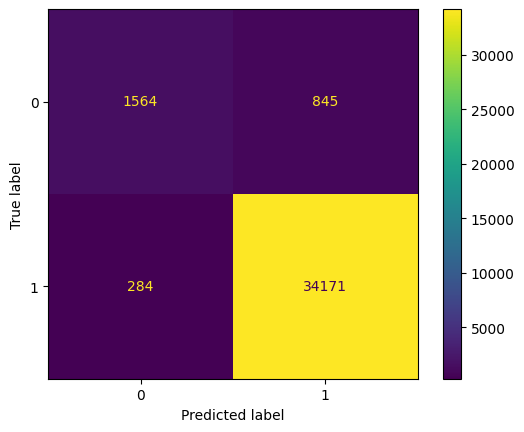

1152/1152 [==============================] - 2s 2ms/step
ROC AUC: 0.9728


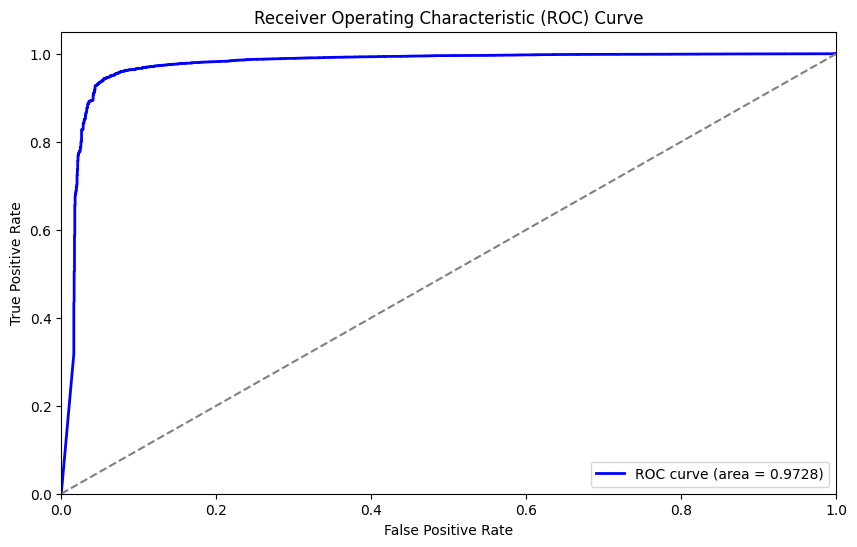

Mean Absolute Error (MAE): 0.0306
Mean Squared Error (MSE): 0.0306
Root Mean Squared Error (RMSE): 0.1750


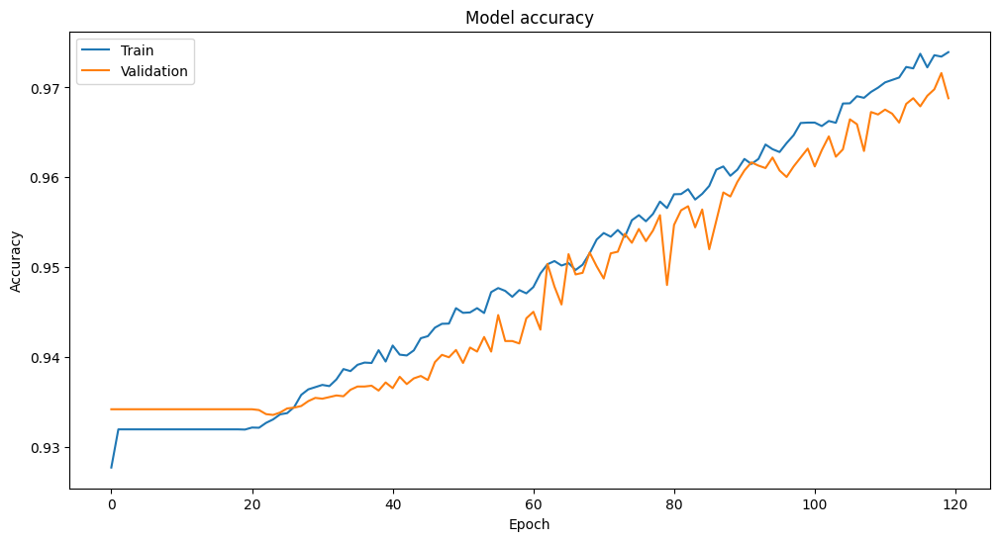

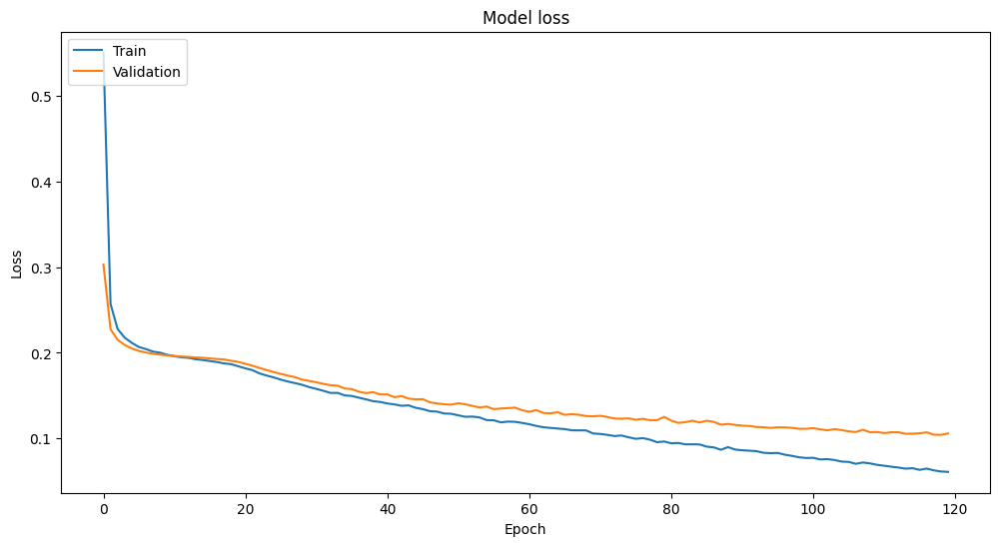

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, roc_auc_score, mean_absolute_error, mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, LSTM, Bidirectional
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame
# Create additional features
data['total_delay'] = data['carrier_delay'] + data['weather_delay'] + data['nas_delay'] + data['security_delay'] + data['late_aircraft_delay']

# Select features and target
features = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay',
            'total_delay', 'carrier', 'airport']
X = data[features]
y = data['delayed']

# Identify categorical and numerical columns
categorical_cols = ['carrier', 'airport']
numerical_cols = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay', 'total_delay']

# Preprocessing for numerical data (with imputation)
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

# Preprocess the data
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

# Convert sparse matrix to dense matrix
X_train = X_train.toarray()
X_test = X_test.toarray()

# Reshape input data to 3D for LSTM [samples, timesteps, features]
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

# Check for NaN values
print("NaN values in X_train:", np.isnan(X_train).sum())
print("NaN values in X_test:", np.isnan(X_test).sum())
print("NaN values in y_train:", np.isnan(y_train).sum())
print("NaN values in y_test:", np.isnan(y_test).sum())

# Define the Bidirectional LSTM model
model = Sequential([
    Bidirectional(LSTM(128, activation='relu', return_sequences=True), input_shape=(X_train.shape[1], X_train.shape[2])),
    Dropout(0.4),
    Bidirectional(LSTM(64, activation='relu', return_sequences=False)),
    Dropout(0.4),
    Dense(1, activation='sigmoid')
])

# Compile the model with a different optimizer
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Callbacks for early stopping and saving the best model
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('best_model.keras', save_best_only=True, monitor='val_loss')

# Train the model
history = model.fit(X_train, y_train, epochs=120, batch_size=128, validation_split=0.2,
                    callbacks=[early_stopping, model_checkpoint])

# Evaluate the model
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy:.4f}")

# Evaluate the model on the training set
train_loss, train_accuracy = model.evaluate(X_train, y_train)
print(f"Training Accuracy: {train_accuracy:.4f}")

# Calculate additional performance metrics
y_pred = (model.predict(X_test) > 0.5).astype("int32")
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

# Calculate specificity
tn, fp, fn, tp = conf_matrix.ravel()
specificity = tn / (tn + fp)

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Specificity: {specificity:.4f}")

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)
disp.plot()
plt.show()

# Calculate ROC curve and AUC
y_pred_proba = model.predict(X_test).ravel()
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)
print(f"ROC AUC: {roc_auc:.4f}")

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Calculate error metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")

# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


APPLYING GRU at 0.1 test dataset

NaN values in X_train: 0
NaN values in X_test: 0
NaN values in y_train: 0
NaN values in y_test: 0
Epoch 1/120
519/519 [==============================] - 7s 9ms/step - loss: 0.4571 - accuracy: 0.9090 - val_loss: 0.2444 - val_accuracy: 0.9342
Epoch 2/120
519/519 [==============================] - 4s 8ms/step - loss: 0.2390 - accuracy: 0.9326 - val_loss: 0.2178 - val_accuracy: 0.9342
Epoch 3/120
519/519 [==============================] - 4s 8ms/step - loss: 0.2214 - accuracy: 0.9326 - val_loss: 0.2085 - val_accuracy: 0.9342
Epoch 4/120
519/519 [==============================] - 4s 8ms/step - loss: 0.2138 - accuracy: 0.9326 - val_loss: 0.2031 - val_accuracy: 0.9342
Epoch 5/120
519/519 [==============================] - 4s 8ms/step - loss: 0.2087 - accuracy: 0.9326 - val_loss: 0.1993 - val_accuracy: 0.9342
Epoch 6/120
519/519 [==============================] - 4s 8ms/step - loss: 0.2043 - accuracy: 0.9326 - val_loss: 0.1967 - val_accuracy: 0.9342
Epoch 7/120
519/519 [=======================

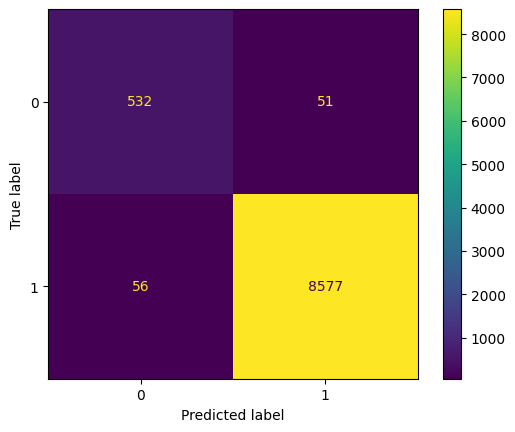

288/288 [==============================] - 1s 2ms/step
ROC AUC: 0.9892


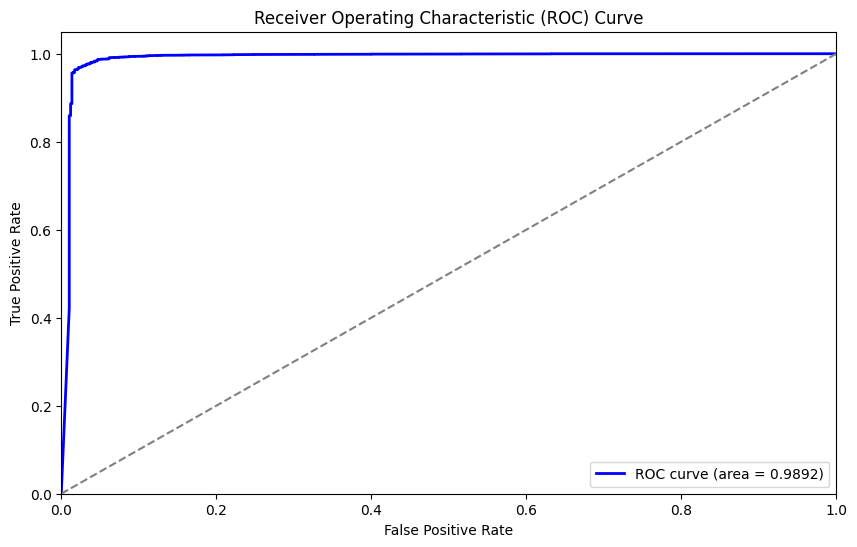

Mean Absolute Error (MAE): 0.0116
Mean Squared Error (MSE): 0.0116
Root Mean Squared Error (RMSE): 0.1078


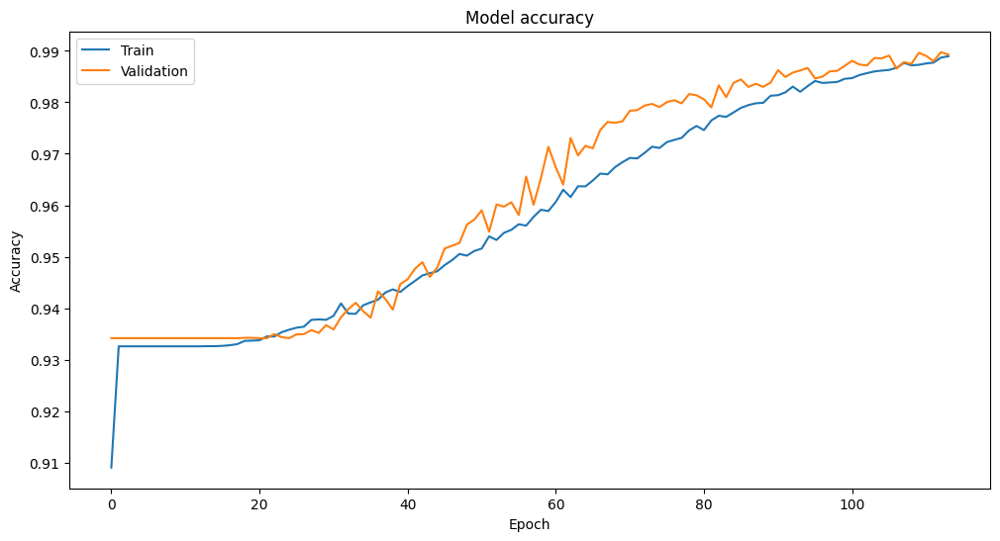

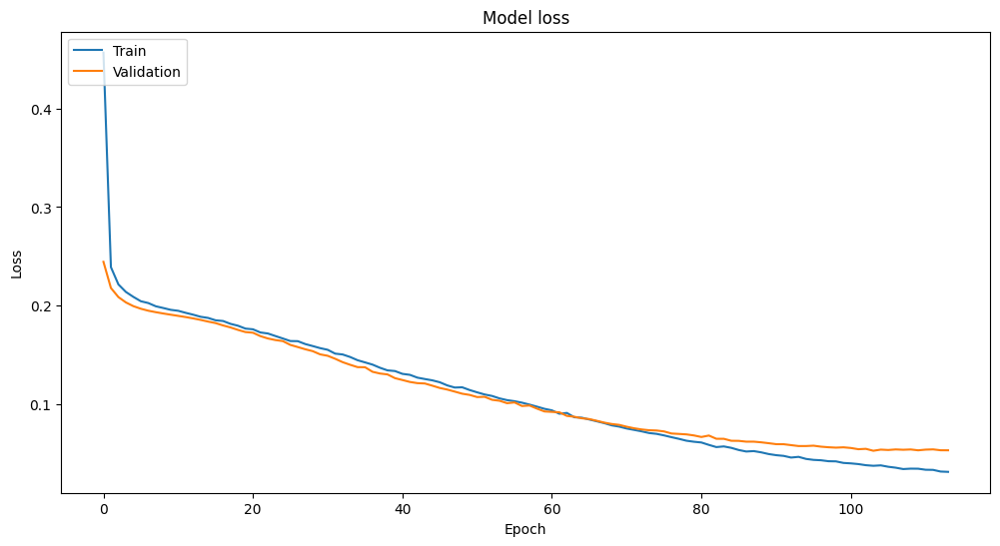

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, roc_auc_score, mean_absolute_error, mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GRU
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame
# Create additional features
data['total_delay'] = data['carrier_delay'] + data['weather_delay'] + data['nas_delay'] + data['security_delay'] + data['late_aircraft_delay']

# Select features and target
features = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay',
            'total_delay', 'carrier', 'airport']
X = data[features]
y = data['delayed']

# Identify categorical and numerical columns
categorical_cols = ['carrier', 'airport']
numerical_cols = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay', 'total_delay']

# Preprocessing for numerical data (with imputation)
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# Preprocess the data
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

# Convert sparse matrix to dense matrix
X_train = X_train.toarray()
X_test = X_test.toarray()

# Reshape input data to 3D for GRU [samples, timesteps, features]
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

# Check for NaN values
print("NaN values in X_train:", np.isnan(X_train).sum())
print("NaN values in X_test:", np.isnan(X_test).sum())
print("NaN values in y_train:", np.isnan(y_train).sum())
print("NaN values in y_test:", np.isnan(y_test).sum())

# Define the GRU model
model = Sequential([
    GRU(128, activation='relu', return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dropout(0.4),
    GRU(64, activation='relu', return_sequences=False),
    Dropout(0.4),
    Dense(1, activation='sigmoid')
])

# Compile the model with a different optimizer
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Callbacks for early stopping and saving the best model
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('best_model.keras', save_best_only=True, monitor='val_loss')

# Train the model
history = model.fit(X_train, y_train, epochs=120, batch_size=128, validation_split=0.2,
                    callbacks=[early_stopping, model_checkpoint])

# Evaluate the model on the test set
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy:.4f}")

# Evaluate the model on the training set
train_loss, train_accuracy = model.evaluate(X_train, y_train)
print(f"Training Accuracy: {train_accuracy:.4f}")

# Calculate additional performance metrics
y_pred = (model.predict(X_test) > 0.5).astype("int32")
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Calculate specificity
conf_matrix = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = conf_matrix.ravel()
specificity = tn / (tn + fp)

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Specificity: {specificity:.4f}")

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)
disp.plot()
plt.show()

# Calculate ROC curve and AUC
y_pred_proba = model.predict(X_test).ravel()
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)
print(f"ROC AUC: {roc_auc:.4f}")

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Calculate error metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")

# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


APPLYING GRU at 0.2 test dataset

NaN values in X_train: 0
NaN values in X_test: 0
NaN values in y_train: 0
NaN values in y_test: 0
Epoch 1/120
461/461 [==============================] - 7s 9ms/step - loss: 0.4593 - accuracy: 0.9232 - val_loss: 0.2483 - val_accuracy: 0.9339
Epoch 2/120
461/461 [==============================] - 4s 8ms/step - loss: 0.2401 - accuracy: 0.9321 - val_loss: 0.2204 - val_accuracy: 0.9339
Epoch 3/120
461/461 [==============================] - 4s 8ms/step - loss: 0.2238 - accuracy: 0.9321 - val_loss: 0.2110 - val_accuracy: 0.9339
Epoch 4/120
461/461 [==============================] - 4s 8ms/step - loss: 0.2153 - accuracy: 0.9321 - val_loss: 0.2055 - val_accuracy: 0.9339
Epoch 5/120
461/461 [==============================] - 4s 8ms/step - loss: 0.2092 - accuracy: 0.9321 - val_loss: 0.2017 - val_accuracy: 0.9339
Epoch 6/120
461/461 [==============================] - 4s 8ms/step - loss: 0.2048 - accuracy: 0.9321 - val_loss: 0.1991 - val_accuracy: 0.9339
Epoch 7/120
461/461 [=======================

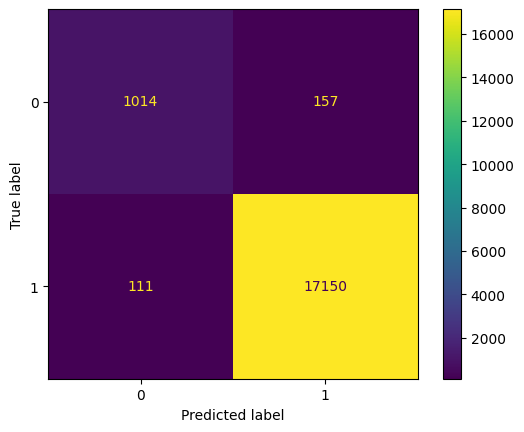

576/576 [==============================] - 1s 2ms/step
ROC AUC: 0.9851


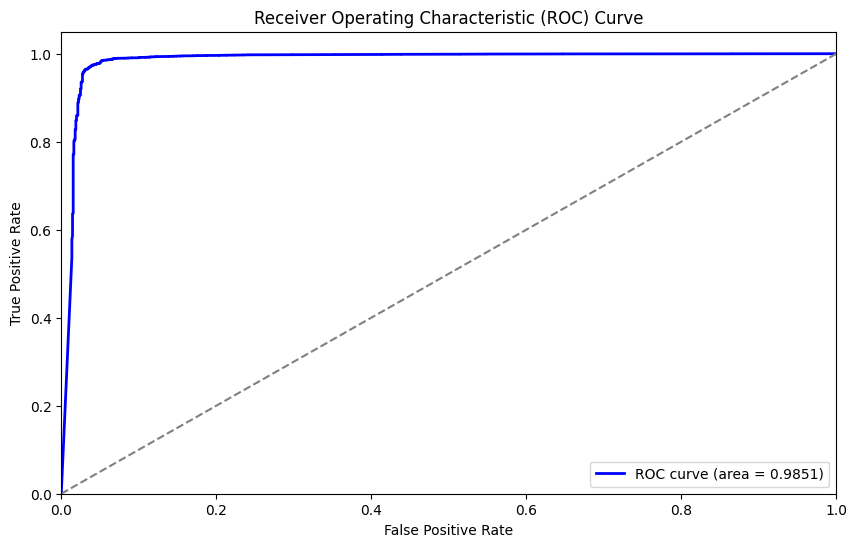

Mean Absolute Error (MAE): 0.0145
Mean Squared Error (MSE): 0.0145
Root Mean Squared Error (RMSE): 0.1206


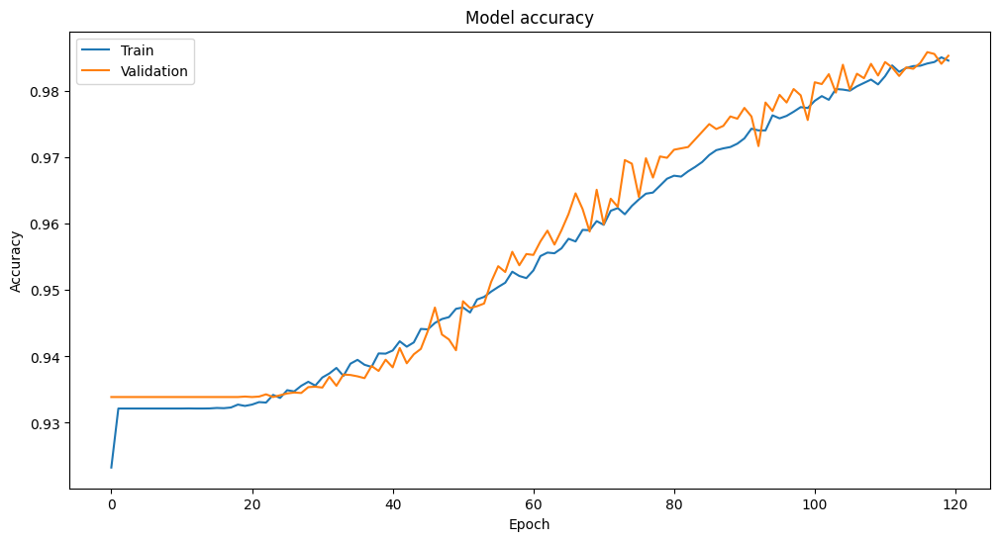

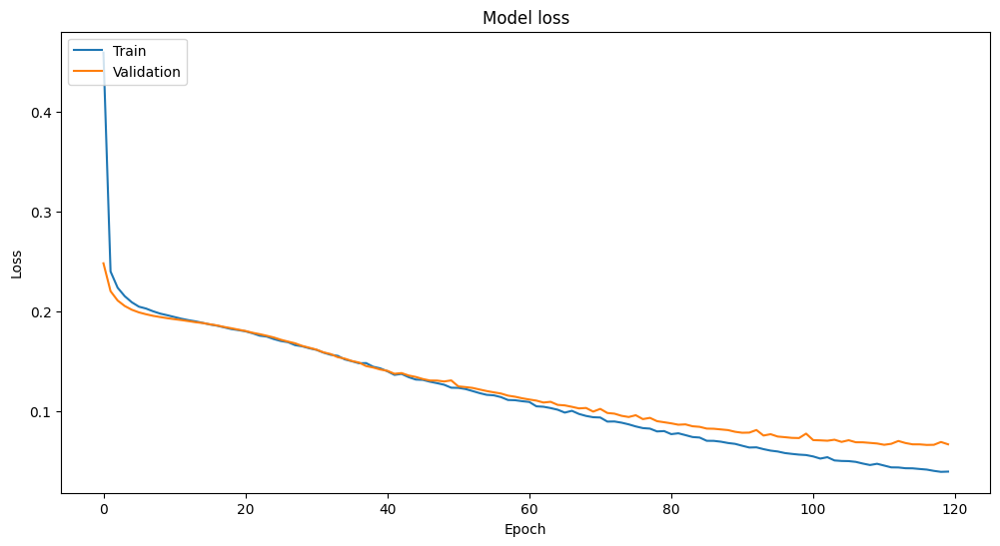

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, roc_auc_score, mean_absolute_error, mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GRU
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame
# Create additional features
data['total_delay'] = data['carrier_delay'] + data['weather_delay'] + data['nas_delay'] + data['security_delay'] + data['late_aircraft_delay']

# Select features and target
features = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay',
            'total_delay', 'carrier', 'airport']
X = data[features]
y = data['delayed']

# Identify categorical and numerical columns
categorical_cols = ['carrier', 'airport']
numerical_cols = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay', 'total_delay']

# Preprocessing for numerical data (with imputation)
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Preprocess the data
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

# Convert sparse matrix to dense matrix
X_train = X_train.toarray()
X_test = X_test.toarray()

# Reshape input data to 3D for GRU [samples, timesteps, features]
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

# Check for NaN values
print("NaN values in X_train:", np.isnan(X_train).sum())
print("NaN values in X_test:", np.isnan(X_test).sum())
print("NaN values in y_train:", np.isnan(y_train).sum())
print("NaN values in y_test:", np.isnan(y_test).sum())

# Define the GRU model
model = Sequential([
    GRU(128, activation='relu', return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dropout(0.4),
    GRU(64, activation='relu', return_sequences=False),
    Dropout(0.4),
    Dense(1, activation='sigmoid')
])

# Compile the model with a different optimizer
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Callbacks for early stopping and saving the best model
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('best_model.keras', save_best_only=True, monitor='val_loss')

# Train the model
history = model.fit(X_train, y_train, epochs=120, batch_size=128, validation_split=0.2,
                    callbacks=[early_stopping, model_checkpoint])

# Evaluate the model on the test set
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy:.4f}")

# Evaluate the model on the training set
train_loss, train_accuracy = model.evaluate(X_train, y_train)
print(f"Training Accuracy: {train_accuracy:.4f}")

# Calculate additional performance metrics
y_pred = (model.predict(X_test) > 0.5).astype("int32")
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Calculate specificity
conf_matrix = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = conf_matrix.ravel()
specificity = tn / (tn + fp)

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Specificity: {specificity:.4f}")

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)
disp.plot()
plt.show()

# Calculate ROC curve and AUC
y_pred_proba = model.predict(X_test).ravel()
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)
print(f"ROC AUC: {roc_auc:.4f}")

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Calculate error metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")

# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


APPLYING GRU at 0.3 test dataset

NaN values in X_train: 0
NaN values in X_test: 0
NaN values in y_train: 0
NaN values in y_test: 0
Epoch 1/120
404/404 [==============================] - 7s 9ms/step - loss: 0.5104 - accuracy: 0.9113 - val_loss: 0.2687 - val_accuracy: 0.9344
Epoch 2/120
404/404 [==============================] - 3s 8ms/step - loss: 0.2479 - accuracy: 0.9321 - val_loss: 0.2232 - val_accuracy: 0.9344
Epoch 3/120
404/404 [==============================] - 3s 8ms/step - loss: 0.2272 - accuracy: 0.9321 - val_loss: 0.2130 - val_accuracy: 0.9344
Epoch 4/120
404/404 [==============================] - 3s 8ms/step - loss: 0.2185 - accuracy: 0.9321 - val_loss: 0.2074 - val_accuracy: 0.9344
Epoch 5/120
404/404 [==============================] - 3s 8ms/step - loss: 0.2128 - accuracy: 0.9321 - val_loss: 0.2037 - val_accuracy: 0.9344
Epoch 6/120
404/404 [==============================] - 3s 8ms/step - loss: 0.2082 - accuracy: 0.9321 - val_loss: 0.2010 - val_accuracy: 0.9344
Epoch 7/120
404/404 [=======================

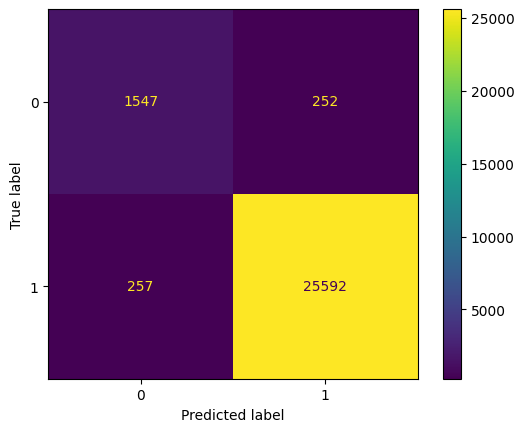

864/864 [==============================] - 2s 2ms/step
ROC AUC: 0.9818


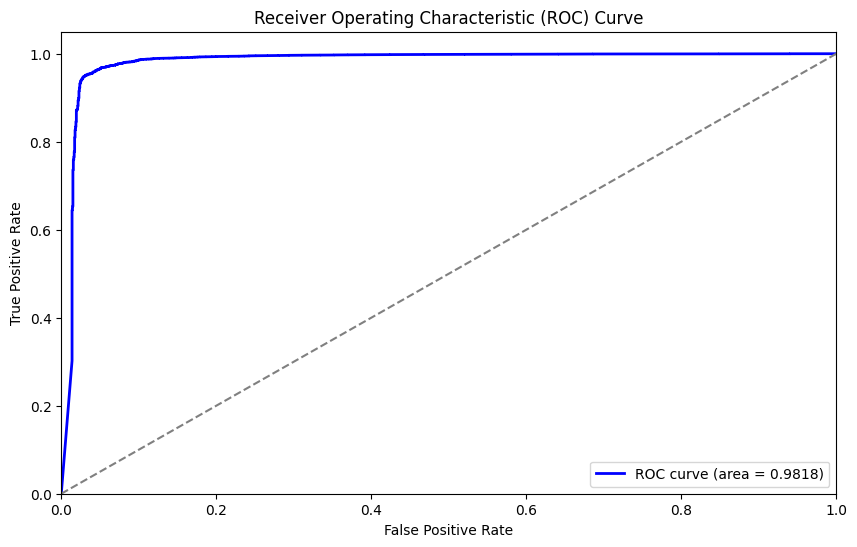

Mean Absolute Error (MAE): 0.0184
Mean Squared Error (MSE): 0.0184
Root Mean Squared Error (RMSE): 0.1357


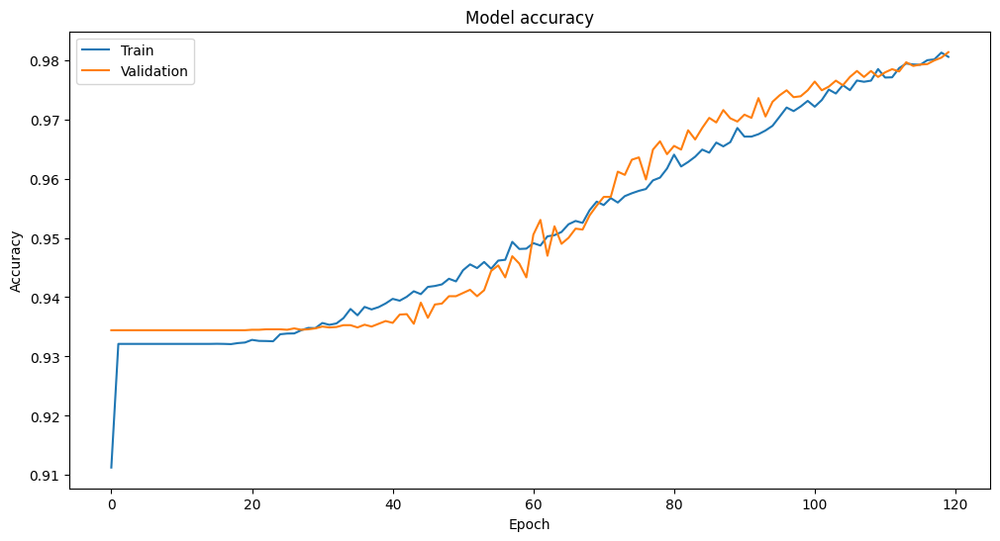

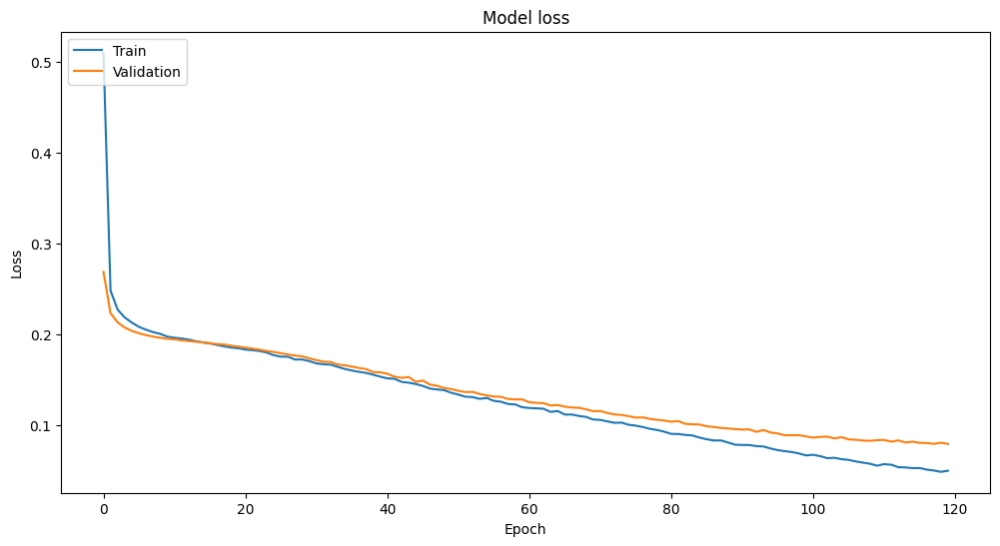

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, roc_auc_score, mean_absolute_error, mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GRU
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame
# Create additional features
data['total_delay'] = data['carrier_delay'] + data['weather_delay'] + data['nas_delay'] + data['security_delay'] + data['late_aircraft_delay']

# Select features and target
features = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay',
            'total_delay', 'carrier', 'airport']
X = data[features]
y = data['delayed']

# Identify categorical and numerical columns
categorical_cols = ['carrier', 'airport']
numerical_cols = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay', 'total_delay']

# Preprocessing for numerical data (with imputation)
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Preprocess the data
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

# Convert sparse matrix to dense matrix
X_train = X_train.toarray()
X_test = X_test.toarray()

# Reshape input data to 3D for GRU [samples, timesteps, features]
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

# Check for NaN values
print("NaN values in X_train:", np.isnan(X_train).sum())
print("NaN values in X_test:", np.isnan(X_test).sum())
print("NaN values in y_train:", np.isnan(y_train).sum())
print("NaN values in y_test:", np.isnan(y_test).sum())

# Define the GRU model
model = Sequential([
    GRU(128, activation='relu', return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dropout(0.4),
    GRU(64, activation='relu', return_sequences=False),
    Dropout(0.4),
    Dense(1, activation='sigmoid')
])

# Compile the model with a different optimizer
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Callbacks for early stopping and saving the best model
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('best_model.keras', save_best_only=True, monitor='val_loss')

# Train the model
history = model.fit(X_train, y_train, epochs=120, batch_size=128, validation_split=0.2,
                    callbacks=[early_stopping, model_checkpoint])

# Evaluate the model on the test set
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy:.4f}")

# Evaluate the model on the training set
train_loss, train_accuracy = model.evaluate(X_train, y_train)
print(f"Training Accuracy: {train_accuracy:.4f}")

# Calculate additional performance metrics
y_pred = (model.predict(X_test) > 0.5).astype("int32")
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Calculate specificity
conf_matrix = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = conf_matrix.ravel()
specificity = tn / (tn + fp)

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Specificity: {specificity:.4f}")

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)
disp.plot()
plt.show()

# Calculate ROC curve and AUC
y_pred_proba = model.predict(X_test).ravel()
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)
print(f"ROC AUC: {roc_auc:.4f}")

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Calculate error metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")

# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


APPLYING GRU at 0.4 test dataset

NaN values in X_train: 0
NaN values in X_test: 0
NaN values in y_train: 0
NaN values in y_test: 0
Epoch 1/120
346/346 [==============================] - 6s 9ms/step - loss: 0.5368 - accuracy: 0.9084 - val_loss: 0.3009 - val_accuracy: 0.9342
Epoch 2/120
346/346 [==============================] - 3s 8ms/step - loss: 0.2572 - accuracy: 0.9319 - val_loss: 0.2280 - val_accuracy: 0.9342
Epoch 3/120
346/346 [==============================] - 3s 8ms/step - loss: 0.2317 - accuracy: 0.9319 - val_loss: 0.2164 - val_accuracy: 0.9342
Epoch 4/120
346/346 [==============================] - 3s 8ms/step - loss: 0.2216 - accuracy: 0.9319 - val_loss: 0.2101 - val_accuracy: 0.9342
Epoch 5/120
346/346 [==============================] - 3s 8ms/step - loss: 0.2159 - accuracy: 0.9319 - val_loss: 0.2058 - val_accuracy: 0.9342
Epoch 6/120
346/346 [==============================] - 3s 8ms/step - loss: 0.2110 - accuracy: 0.9319 - val_loss: 0.2028 - val_accuracy: 0.9342
Epoch 7/120
346/346 [=======================

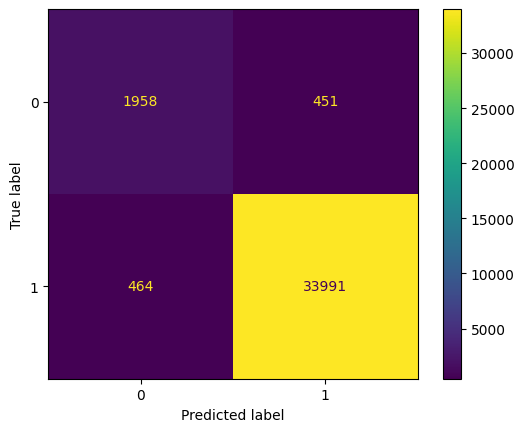

1152/1152 [==============================] - 2s 2ms/step
ROC AUC: 0.9742


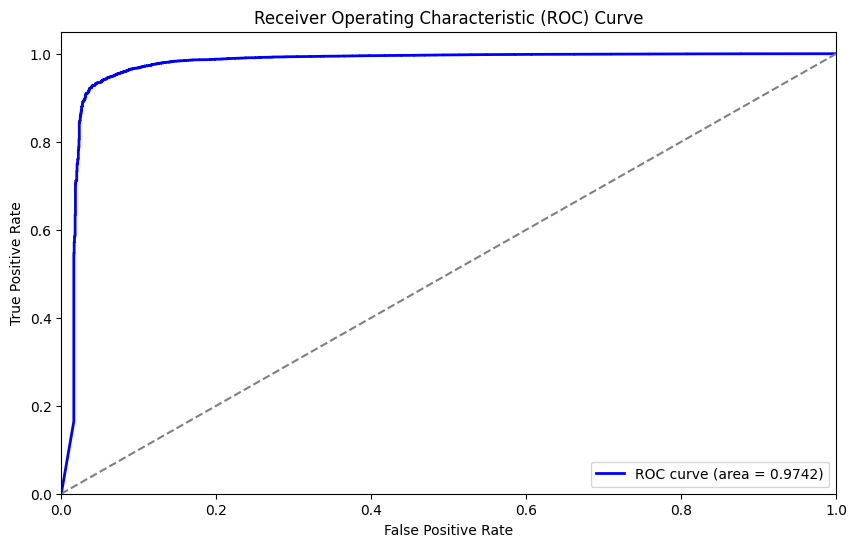

Mean Absolute Error (MAE): 0.0248
Mean Squared Error (MSE): 0.0248
Root Mean Squared Error (RMSE): 0.1575


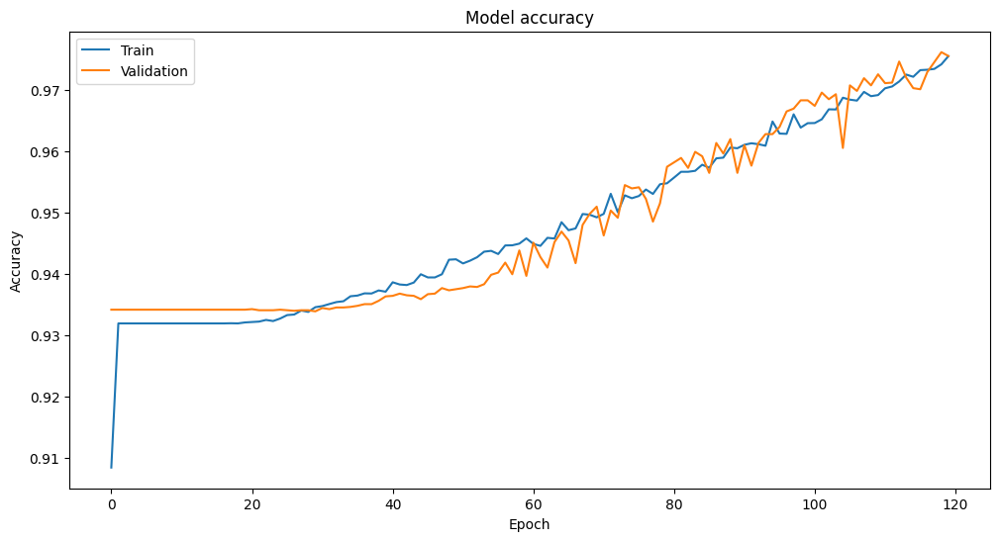

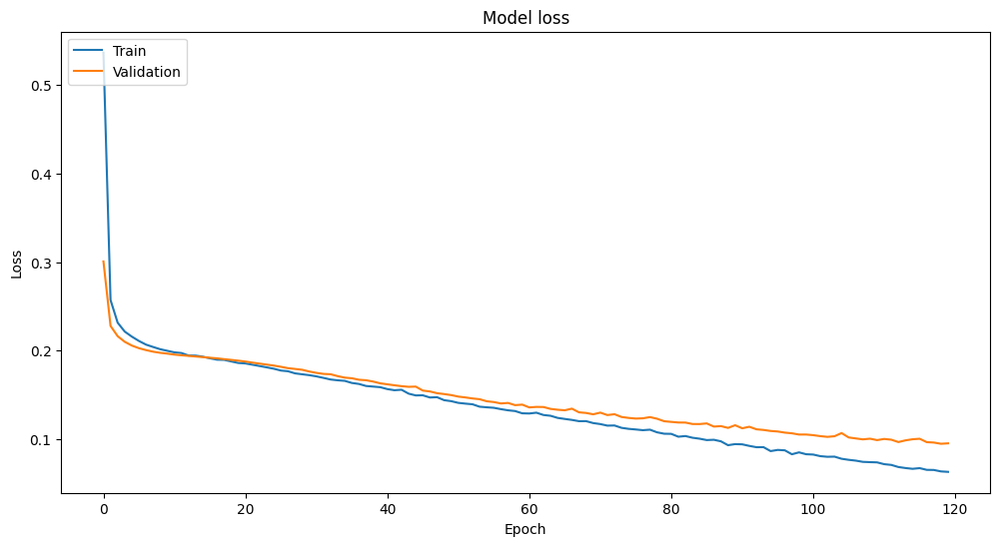

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, roc_auc_score, mean_absolute_error, mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GRU
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame
# Create additional features
data['total_delay'] = data['carrier_delay'] + data['weather_delay'] + data['nas_delay'] + data['security_delay'] + data['late_aircraft_delay']

# Select features and target
features = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay',
            'total_delay', 'carrier', 'airport']
X = data[features]
y = data['delayed']

# Identify categorical and numerical columns
categorical_cols = ['carrier', 'airport']
numerical_cols = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay', 'total_delay']

# Preprocessing for numerical data (with imputation)
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

# Preprocess the data
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

# Convert sparse matrix to dense matrix
X_train = X_train.toarray()
X_test = X_test.toarray()

# Reshape input data to 3D for GRU [samples, timesteps, features]
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

# Check for NaN values
print("NaN values in X_train:", np.isnan(X_train).sum())
print("NaN values in X_test:", np.isnan(X_test).sum())
print("NaN values in y_train:", np.isnan(y_train).sum())
print("NaN values in y_test:", np.isnan(y_test).sum())

# Define the GRU model
model = Sequential([
    GRU(128, activation='relu', return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dropout(0.4),
    GRU(64, activation='relu', return_sequences=False),
    Dropout(0.4),
    Dense(1, activation='sigmoid')
])

# Compile the model with a different optimizer
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Callbacks for early stopping and saving the best model
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('best_model.keras', save_best_only=True, monitor='val_loss')

# Train the model
history = model.fit(X_train, y_train, epochs=120, batch_size=128, validation_split=0.2,
                    callbacks=[early_stopping, model_checkpoint])

# Evaluate the model on the test set
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy:.4f}")

# Evaluate the model on the training set
train_loss, train_accuracy = model.evaluate(X_train, y_train)
print(f"Training Accuracy: {train_accuracy:.4f}")

# Calculate additional performance metrics
y_pred = (model.predict(X_test) > 0.5).astype("int32")
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Calculate specificity
conf_matrix = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = conf_matrix.ravel()
specificity = tn / (tn + fp)

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Specificity: {specificity:.4f}")

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)
disp.plot()
plt.show()

# Calculate ROC curve and AUC
y_pred_proba = model.predict(X_test).ravel()
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)
print(f"ROC AUC: {roc_auc:.4f}")

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Calculate error metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")

# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


APPLYING classic lstm+ 1D CNNat 0.1 test dataset

NaN values in X_train_resampled: 0
NaN values in X_test: 0
NaN values in y_train_resampled: 0
NaN values in y_test: 0
Epoch 1/120
968/968 [==============================] - 7s 6ms/step - loss: 1.5214 - accuracy: 0.6346 - val_loss: 1.1213 - val_accuracy: 0.0952
Epoch 2/120
968/968 [==============================] - 5s 5ms/step - loss: 0.7088 - accuracy: 0.6976 - val_loss: 0.8383 - val_accuracy: 0.5400
Epoch 3/120
968/968 [==============================] - 5s 5ms/step - loss: 0.6294 - accuracy: 0.7539 - val_loss: 0.8118 - val_accuracy: 0.7989
Epoch 4/120
968/968 [==============================] - 5s 5ms/step - loss: 0.6093 - accuracy: 0.8065 - val_loss: 0.7949 - val_accuracy: 0.8722
Epoch 5/120
968/968 [==============================] - 5s 5ms/step - loss: 0.5981 - accuracy: 0.8421 - val_loss: 0.7221 - val_accuracy: 0.9482
Epoch 6/120
968/968 [==============================] - 5s 5ms/step - loss: 0.5925 - accuracy: 0.8533 - val_loss: 0.6224 - val_accuracy: 0.9493
Epoch 7/120
968/968 [===

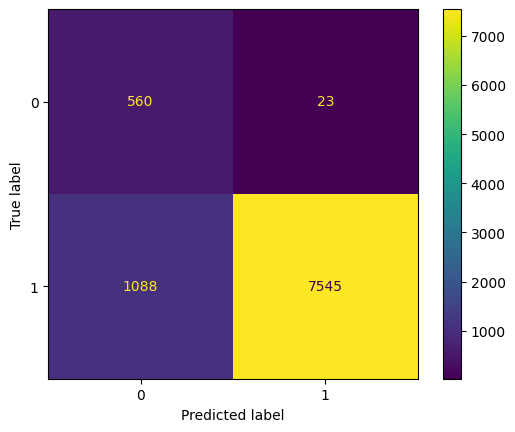

288/288 [==============================] - 0s 2ms/step
ROC AUC: 0.9741


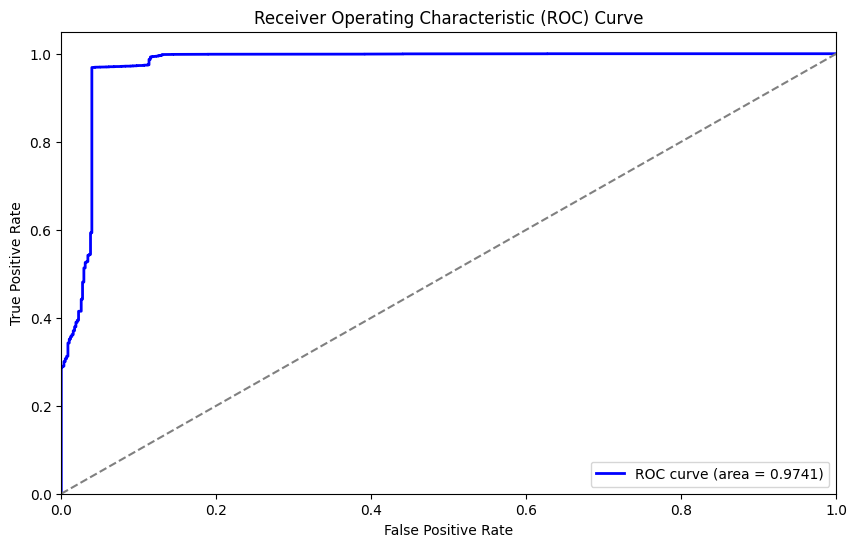

Mean Absolute Error (MAE): 0.1206
Mean Squared Error (MSE): 0.1206
Root Mean Squared Error (RMSE): 0.3472


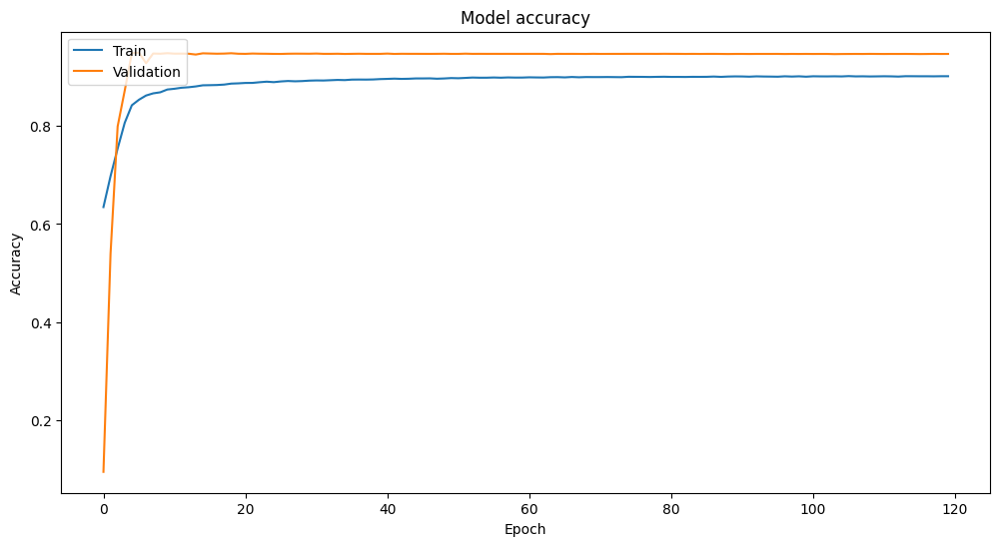

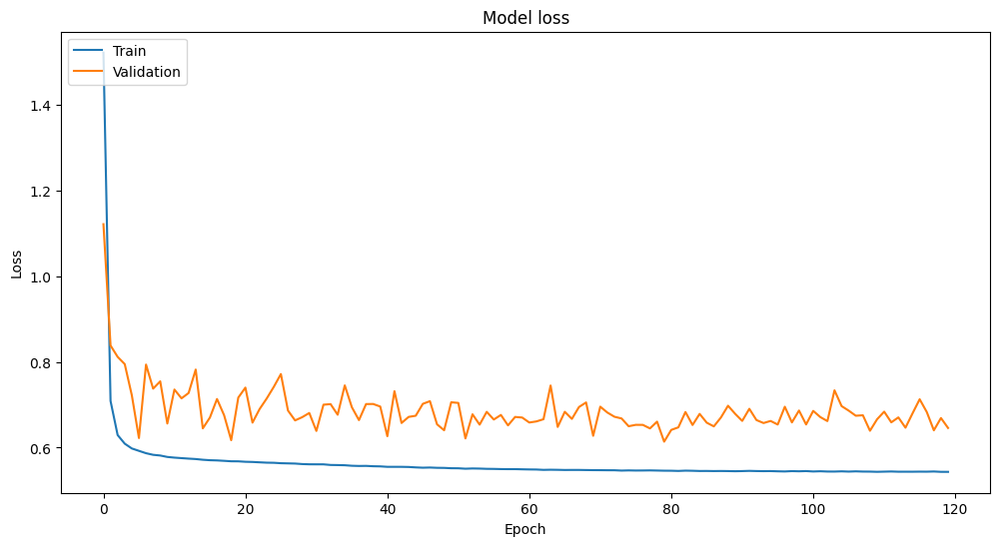

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, roc_auc_score, mean_absolute_error, mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, LSTM, Conv1D, MaxPooling1D, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint
import seaborn as sns
import matplotlib.pyplot as plt
from imblearn.over_sampling import SMOTE
from sklearn.utils import class_weight

# Assuming 'data' is your DataFrame
# Create additional features
data['total_delay'] = data['carrier_delay'] + data['weather_delay'] + data['nas_delay'] + data['security_delay'] + data['late_aircraft_delay']

# Select features and target
features = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay',
            'total_delay', 'carrier', 'airport']
X = data[features]
y = data['delayed']

# Identify categorical and numerical columns
categorical_cols = ['carrier', 'airport']
numerical_cols = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay', 'total_delay']

# Preprocessing for numerical data (with imputation)
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# Preprocess the data
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

# Convert sparse matrix to dense matrix
X_train = X_train.toarray()
X_test = X_test.toarray()

# Apply SMOTE to the training data
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# Reshape input data to 3D for CNN and LSTM [samples, timesteps, features]
X_train_resampled = X_train_resampled.reshape((X_train_resampled.shape[0], X_train_resampled.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

# Check for NaN values
print("NaN values in X_train_resampled:", np.isnan(X_train_resampled).sum())
print("NaN values in X_test:", np.isnan(X_test).sum())
print("NaN values in y_train_resampled:", np.isnan(y_train_resampled).sum())
print("NaN values in y_test:", np.isnan(y_test).sum())

from tensorflow.keras.regularizers import l2

# Define the hybrid 1-D CNN and LSTM model with L2 regularization
model = Sequential([
    Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(X_train_resampled.shape[1], X_train_resampled.shape[2]), kernel_regularizer=l2(0.01)),
    MaxPooling1D(pool_size=2),
    Conv1D(filters=128, kernel_size=3, activation='relu', kernel_regularizer=l2(0.01)),
    MaxPooling1D(pool_size=2),
    Flatten(),
    Dense(128, activation='relu', kernel_regularizer=l2(0.01)),
    Dropout(0.4),
    Dense(64, activation='relu', kernel_regularizer=l2(0.01)),
    Dropout(0.4),
    Dense(1, activation='sigmoid', kernel_regularizer=l2(0.01))
])

# Compile the model with a different optimizer
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Calculate class weights
class_weights = class_weight.compute_class_weight('balanced', classes=np.unique(y_train_resampled), y=y_train_resampled)
class_weights = dict(enumerate(class_weights))

# Callback for saving the best model
model_checkpoint = ModelCheckpoint('best_model.keras', save_best_only=True, monitor='val_loss')

# Train the model with class weights
history = model.fit(X_train_resampled, y_train_resampled, epochs=120, batch_size=128, validation_split=0.2,
                    callbacks=[model_checkpoint],
                    class_weight=class_weights)

# Evaluate the model on the test set
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy:.4f}")

# Evaluate the model on the training set
train_loss, train_accuracy = model.evaluate(X_train_resampled, y_train_resampled)
print(f"Training Accuracy: {train_accuracy:.4f}")

# Calculate additional performance metrics
y_pred = (model.predict(X_test) > 0.5).astype("int32")
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Calculate specificity
conf_matrix = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = conf_matrix.ravel()
specificity = tn / (tn + fp)

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Specificity: {specificity:.4f}")

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)
disp.plot()
plt.show()

# Calculate ROC curve and AUC
y_pred_proba = model.predict(X_test).ravel()
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)
print(f"ROC AUC: {roc_auc:.4f}")

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Calculate error metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")

# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


APPLYING classic lstm+ 1D CNNat 0.2 test dataset

NaN values in X_train_resampled: 0
NaN values in X_test: 0
NaN values in y_train_resampled: 0
NaN values in y_test: 0
Epoch 1/120
860/860 [==============================] - 6s 6ms/step - loss: 1.6051 - accuracy: 0.6418 - val_loss: 1.0640 - val_accuracy: 0.4506
Epoch 2/120
860/860 [==============================] - 4s 5ms/step - loss: 0.7371 - accuracy: 0.7292 - val_loss: 0.7560 - val_accuracy: 0.9289
Epoch 3/120
860/860 [==============================] - 4s 5ms/step - loss: 0.6251 - accuracy: 0.8120 - val_loss: 0.7721 - val_accuracy: 0.9187
Epoch 4/120
860/860 [==============================] - 5s 5ms/step - loss: 0.5983 - accuracy: 0.8485 - val_loss: 0.7315 - val_accuracy: 0.9507
Epoch 5/120
860/860 [==============================] - 4s 5ms/step - loss: 0.5888 - accuracy: 0.8626 - val_loss: 0.7212 - val_accuracy: 0.9505
Epoch 6/120
860/860 [==============================] - 4s 5ms/step - loss: 0.5828 - accuracy: 0.8696 - val_loss: 0.8109 - val_accuracy: 0.9255
Epoch 7/120
860/860 [===

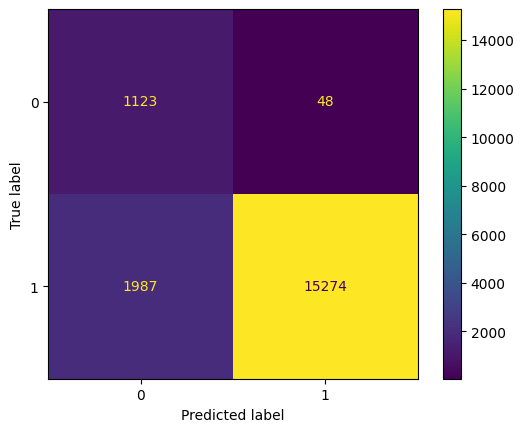

576/576 [==============================] - 1s 2ms/step
ROC AUC: 0.9682


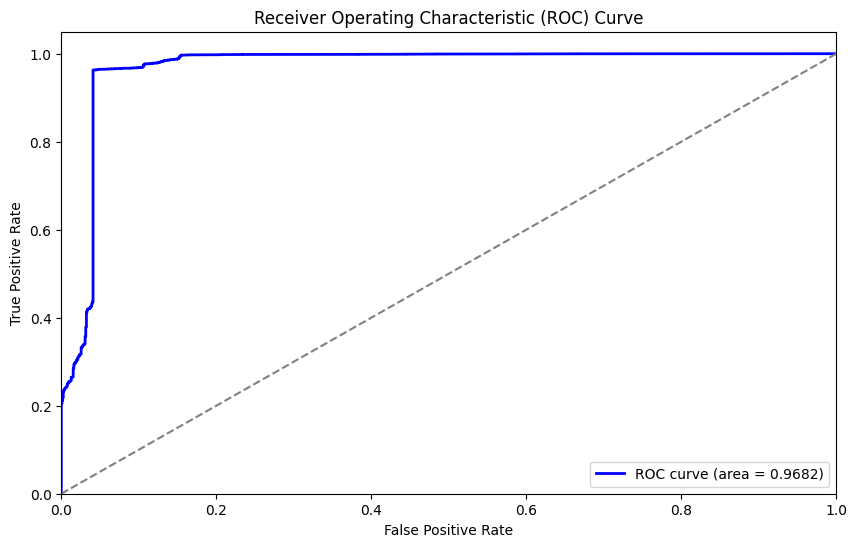

Mean Absolute Error (MAE): 0.1104
Mean Squared Error (MSE): 0.1104
Root Mean Squared Error (RMSE): 0.3323


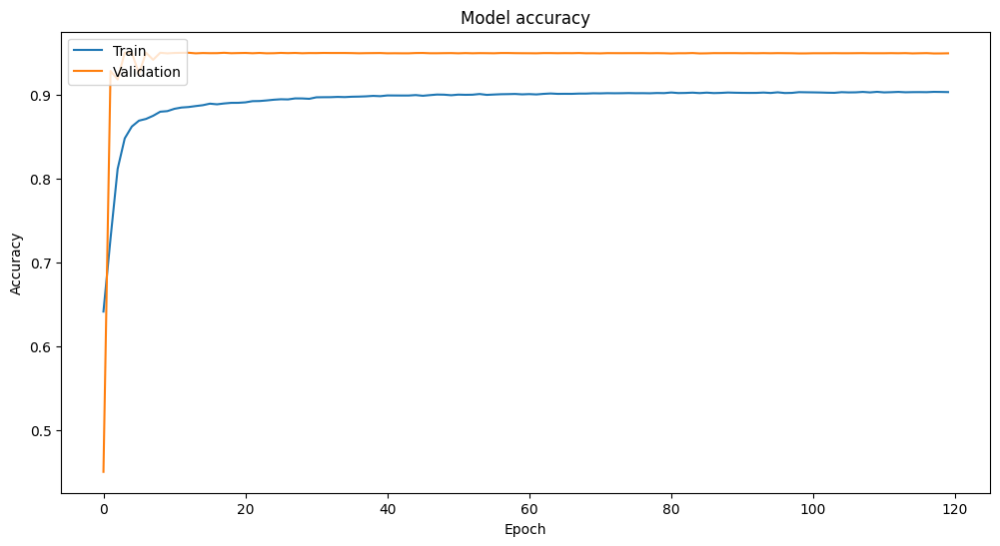

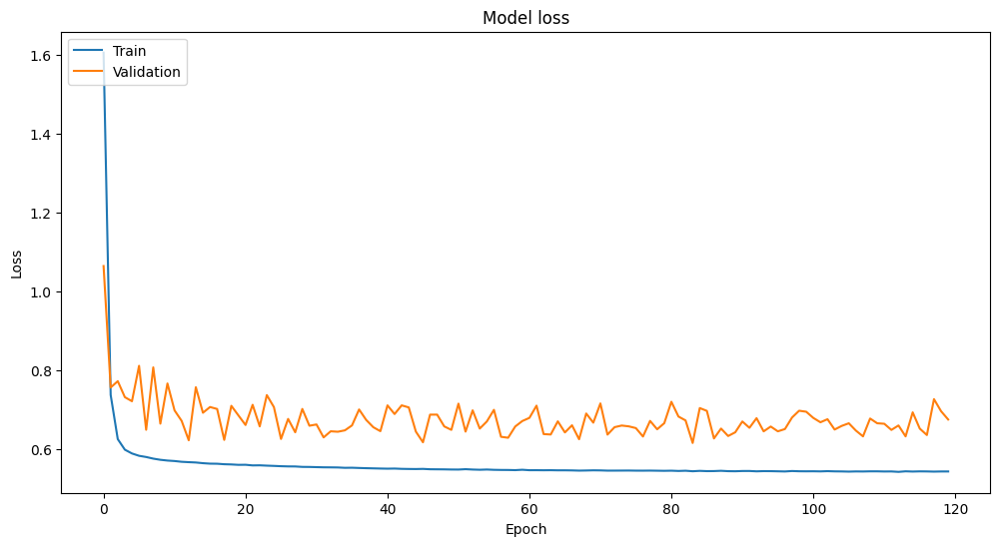

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, roc_auc_score, mean_absolute_error, mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, LSTM, Conv1D, MaxPooling1D, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint
import seaborn as sns
import matplotlib.pyplot as plt
from imblearn.over_sampling import SMOTE
from sklearn.utils import class_weight

# Assuming 'data' is your DataFrame
# Create additional features
data['total_delay'] = data['carrier_delay'] + data['weather_delay'] + data['nas_delay'] + data['security_delay'] + data['late_aircraft_delay']

# Select features and target
features = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay',
            'total_delay', 'carrier', 'airport']
X = data[features]
y = data['delayed']

# Identify categorical and numerical columns
categorical_cols = ['carrier', 'airport']
numerical_cols = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay', 'total_delay']

# Preprocessing for numerical data (with imputation)
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Preprocess the data
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

# Convert sparse matrix to dense matrix
X_train = X_train.toarray()
X_test = X_test.toarray()

# Apply SMOTE to the training data
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# Reshape input data to 3D for CNN and LSTM [samples, timesteps, features]
X_train_resampled = X_train_resampled.reshape((X_train_resampled.shape[0], X_train_resampled.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

# Check for NaN values
print("NaN values in X_train_resampled:", np.isnan(X_train_resampled).sum())
print("NaN values in X_test:", np.isnan(X_test).sum())
print("NaN values in y_train_resampled:", np.isnan(y_train_resampled).sum())
print("NaN values in y_test:", np.isnan(y_test).sum())

from tensorflow.keras.regularizers import l2

# Define the hybrid 1-D CNN and LSTM model with L2 regularization
model = Sequential([
    Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(X_train_resampled.shape[1], X_train_resampled.shape[2]), kernel_regularizer=l2(0.01)),
    MaxPooling1D(pool_size=2),
    Conv1D(filters=128, kernel_size=3, activation='relu', kernel_regularizer=l2(0.01)),
    MaxPooling1D(pool_size=2),
    Flatten(),
    Dense(128, activation='relu', kernel_regularizer=l2(0.01)),
    Dropout(0.4),
    Dense(64, activation='relu', kernel_regularizer=l2(0.01)),
    Dropout(0.4),
    Dense(1, activation='sigmoid', kernel_regularizer=l2(0.01))
])

# Compile the model with a different optimizer
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Calculate class weights
class_weights = class_weight.compute_class_weight('balanced', classes=np.unique(y_train_resampled), y=y_train_resampled)
class_weights = dict(enumerate(class_weights))

# Callback for saving the best model
model_checkpoint = ModelCheckpoint('best_model.keras', save_best_only=True, monitor='val_loss')

# Train the model with class weights
history = model.fit(X_train_resampled, y_train_resampled, epochs=120, batch_size=128, validation_split=0.2,
                    callbacks=[model_checkpoint],
                    class_weight=class_weights)

# Evaluate the model on the test set
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy:.4f}")

# Evaluate the model on the training set
train_loss, train_accuracy = model.evaluate(X_train_resampled, y_train_resampled)
print(f"Training Accuracy: {train_accuracy:.4f}")

# Calculate additional performance metrics
y_pred = (model.predict(X_test) > 0.5).astype("int32")
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Calculate specificity
conf_matrix = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = conf_matrix.ravel()
specificity = tn / (tn + fp)

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Specificity: {specificity:.4f}")

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)
disp.plot()
plt.show()

# Calculate ROC curve and AUC
y_pred_proba = model.predict(X_test).ravel()
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)
print(f"ROC AUC: {roc_auc:.4f}")

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Calculate error metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")

# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


APPLYING classic lstm+ 1D CNNat 0.3 test dataset

NaN values in X_train_resampled: 0
NaN values in X_test: 0
NaN values in y_train_resampled: 0
NaN values in y_test: 0
Epoch 1/120
753/753 [==============================] - 7s 6ms/step - loss: 1.7131 - accuracy: 0.6356 - val_loss: 1.0932 - val_accuracy: 0.4878
Epoch 2/120
753/753 [==============================] - 4s 5ms/step - loss: 0.7878 - accuracy: 0.6859 - val_loss: 0.8522 - val_accuracy: 0.6086
Epoch 3/120
753/753 [==============================] - 4s 5ms/step - loss: 0.6534 - accuracy: 0.7318 - val_loss: 0.8343 - val_accuracy: 0.6234
Epoch 4/120
753/753 [==============================] - 4s 5ms/step - loss: 0.6236 - accuracy: 0.7627 - val_loss: 0.9528 - val_accuracy: 0.2814
Epoch 5/120
753/753 [==============================] - 4s 5ms/step - loss: 0.6130 - accuracy: 0.7957 - val_loss: 0.8644 - val_accuracy: 0.6755
Epoch 6/120
753/753 [==============================] - 4s 5ms/step - loss: 0.6032 - accuracy: 0.8266 - val_loss: 0.6170 - val_accuracy: 0.9518
Epoch 7/120
753/753 [===

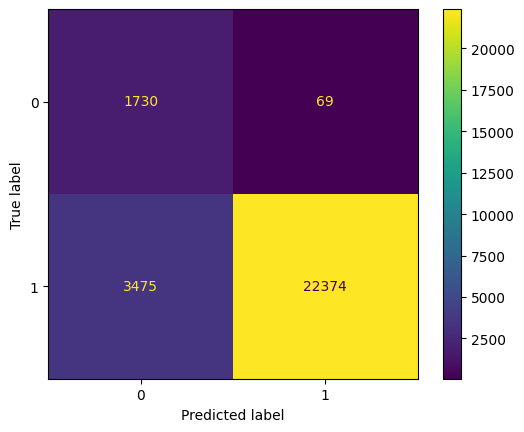

864/864 [==============================] - 1s 2ms/step
ROC AUC: 0.9761


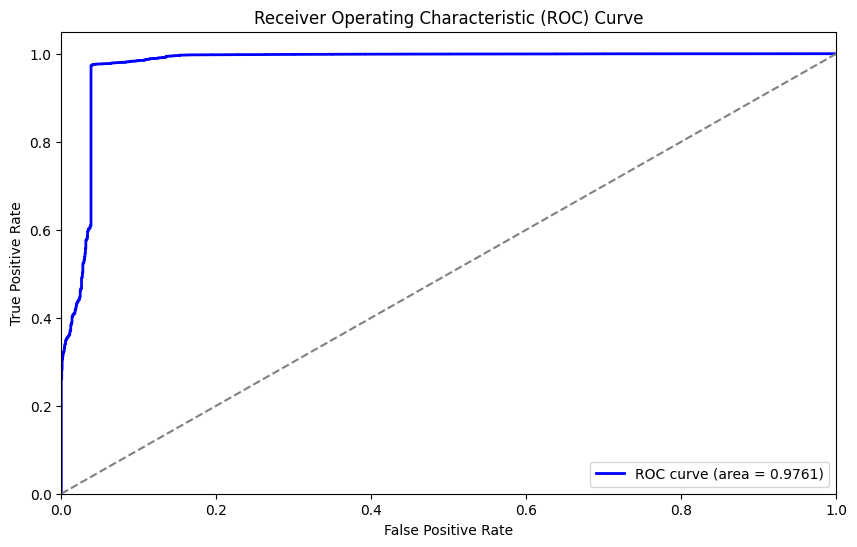

Mean Absolute Error (MAE): 0.1282
Mean Squared Error (MSE): 0.1282
Root Mean Squared Error (RMSE): 0.3580


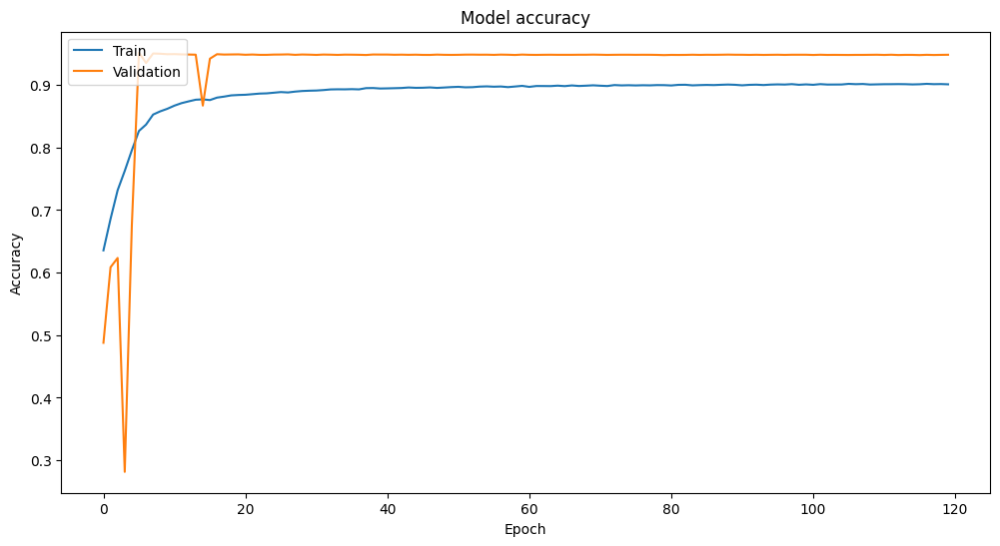

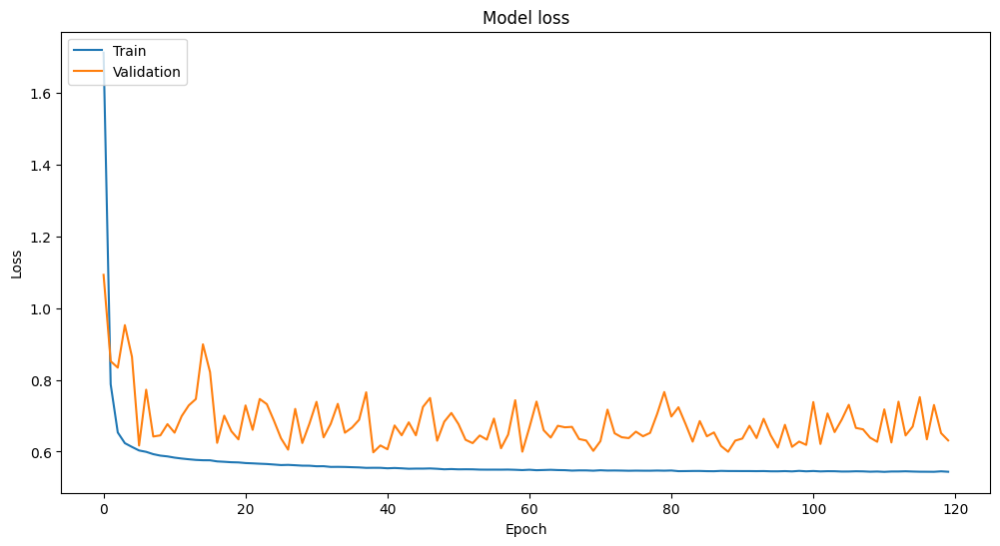

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, roc_auc_score, mean_absolute_error, mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, LSTM, Conv1D, MaxPooling1D, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint
import seaborn as sns
import matplotlib.pyplot as plt
from imblearn.over_sampling import SMOTE
from sklearn.utils import class_weight

# Assuming 'data' is your DataFrame
# Create additional features
data['total_delay'] = data['carrier_delay'] + data['weather_delay'] + data['nas_delay'] + data['security_delay'] + data['late_aircraft_delay']

# Select features and target
features = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay',
            'total_delay', 'carrier', 'airport']
X = data[features]
y = data['delayed']

# Identify categorical and numerical columns
categorical_cols = ['carrier', 'airport']
numerical_cols = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay', 'total_delay']

# Preprocessing for numerical data (with imputation)
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Preprocess the data
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

# Convert sparse matrix to dense matrix
X_train = X_train.toarray()
X_test = X_test.toarray()

# Apply SMOTE to the training data
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# Reshape input data to 3D for CNN and LSTM [samples, timesteps, features]
X_train_resampled = X_train_resampled.reshape((X_train_resampled.shape[0], X_train_resampled.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

# Check for NaN values
print("NaN values in X_train_resampled:", np.isnan(X_train_resampled).sum())
print("NaN values in X_test:", np.isnan(X_test).sum())
print("NaN values in y_train_resampled:", np.isnan(y_train_resampled).sum())
print("NaN values in y_test:", np.isnan(y_test).sum())

from tensorflow.keras.regularizers import l2

# Define the hybrid 1-D CNN and LSTM model with L2 regularization
model = Sequential([
    Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(X_train_resampled.shape[1], X_train_resampled.shape[2]), kernel_regularizer=l2(0.01)),
    MaxPooling1D(pool_size=2),
    Conv1D(filters=128, kernel_size=3, activation='relu', kernel_regularizer=l2(0.01)),
    MaxPooling1D(pool_size=2),
    Flatten(),
    Dense(128, activation='relu', kernel_regularizer=l2(0.01)),
    Dropout(0.4),
    Dense(64, activation='relu', kernel_regularizer=l2(0.01)),
    Dropout(0.4),
    Dense(1, activation='sigmoid', kernel_regularizer=l2(0.01))
])

# Compile the model with a different optimizer
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Calculate class weights
class_weights = class_weight.compute_class_weight('balanced', classes=np.unique(y_train_resampled), y=y_train_resampled)
class_weights = dict(enumerate(class_weights))

# Callback for saving the best model
model_checkpoint = ModelCheckpoint('best_model.keras', save_best_only=True, monitor='val_loss')

# Train the model with class weights
history = model.fit(X_train_resampled, y_train_resampled, epochs=120, batch_size=128, validation_split=0.2,
                    callbacks=[model_checkpoint],
                    class_weight=class_weights)

# Evaluate the model on the test set
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy:.4f}")

# Evaluate the model on the training set
train_loss, train_accuracy = model.evaluate(X_train_resampled, y_train_resampled)
print(f"Training Accuracy: {train_accuracy:.4f}")

# Calculate additional performance metrics
y_pred = (model.predict(X_test) > 0.5).astype("int32")
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Calculate specificity
conf_matrix = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = conf_matrix.ravel()
specificity = tn / (tn + fp)

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Specificity: {specificity:.4f}")

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)
disp.plot()
plt.show()

# Calculate ROC curve and AUC
y_pred_proba = model.predict(X_test).ravel()
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)
print(f"ROC AUC: {roc_auc:.4f}")

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Calculate error metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")

# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


APPLYING classic lstm+ 1D CNNat 0.4 test dataset

NaN values in X_train_resampled: 0
NaN values in X_test: 0
NaN values in y_train_resampled: 0
NaN values in y_test: 0
Epoch 1/120
645/645 [==============================] - 6s 6ms/step - loss: 1.8340 - accuracy: 0.6306 - val_loss: 1.2606 - val_accuracy: 0.1637
Epoch 2/120
645/645 [==============================] - 3s 5ms/step - loss: 0.8534 - accuracy: 0.6718 - val_loss: 0.9846 - val_accuracy: 0.2390
Epoch 3/120
645/645 [==============================] - 3s 5ms/step - loss: 0.6756 - accuracy: 0.7256 - val_loss: 0.7639 - val_accuracy: 0.8512
Epoch 4/120
645/645 [==============================] - 3s 5ms/step - loss: 0.6313 - accuracy: 0.7574 - val_loss: 0.7213 - val_accuracy: 0.9212
Epoch 5/120
645/645 [==============================] - 3s 5ms/step - loss: 0.6132 - accuracy: 0.7947 - val_loss: 0.8560 - val_accuracy: 0.6807
Epoch 6/120
645/645 [==============================] - 3s 5ms/step - loss: 0.6042 - accuracy: 0.8290 - val_loss: 0.7577 - val_accuracy: 0.9364
Epoch 7/120
645/645 [===

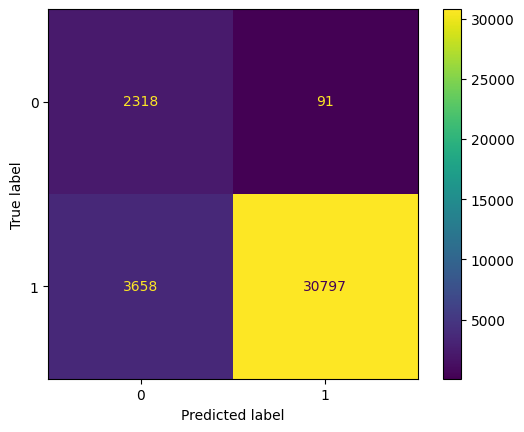

1152/1152 [==============================] - 2s 2ms/step
ROC AUC: 0.9743


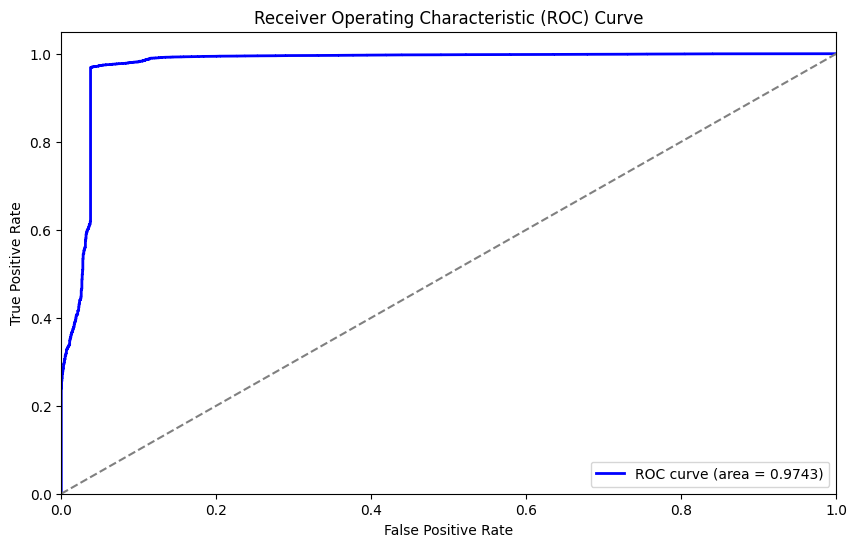

Mean Absolute Error (MAE): 0.1017
Mean Squared Error (MSE): 0.1017
Root Mean Squared Error (RMSE): 0.3189


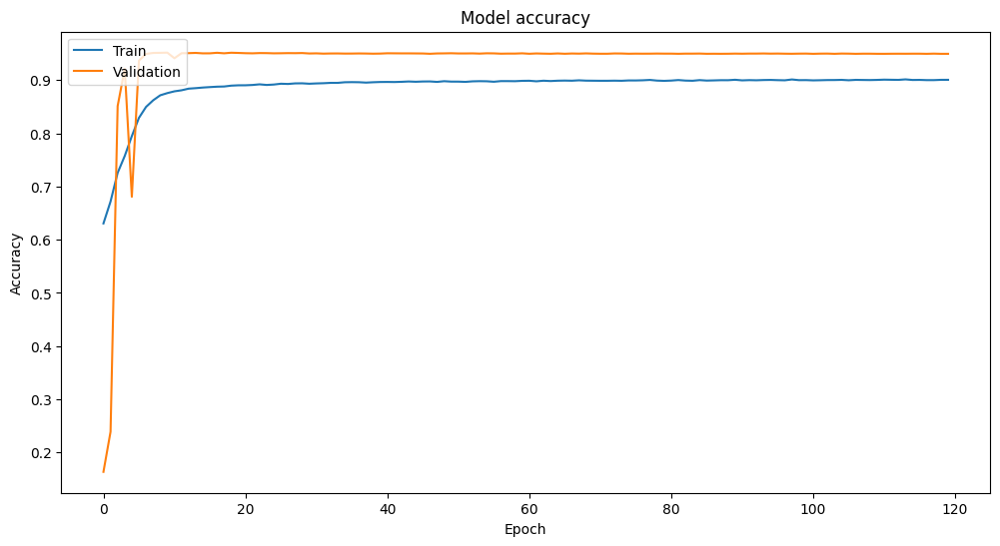

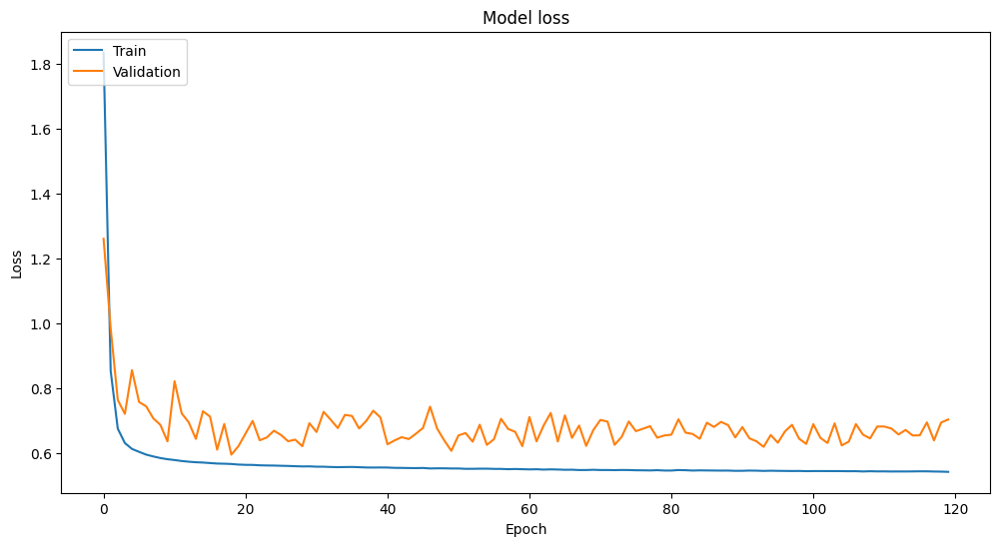

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, roc_auc_score, mean_absolute_error, mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, LSTM, Conv1D, MaxPooling1D, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint
import seaborn as sns
import matplotlib.pyplot as plt
from imblearn.over_sampling import SMOTE
from sklearn.utils import class_weight

# Assuming 'data' is your DataFrame
# Create additional features
data['total_delay'] = data['carrier_delay'] + data['weather_delay'] + data['nas_delay'] + data['security_delay'] + data['late_aircraft_delay']

# Select features and target
features = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay',
            'total_delay', 'carrier', 'airport']
X = data[features]
y = data['delayed']

# Identify categorical and numerical columns
categorical_cols = ['carrier', 'airport']
numerical_cols = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay', 'total_delay']

# Preprocessing for numerical data (with imputation)
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

# Preprocess the data
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

# Convert sparse matrix to dense matrix
X_train = X_train.toarray()
X_test = X_test.toarray()

# Apply SMOTE to the training data
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# Reshape input data to 3D for CNN and LSTM [samples, timesteps, features]
X_train_resampled = X_train_resampled.reshape((X_train_resampled.shape[0], X_train_resampled.shape[1], 1))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1], 1))

# Check for NaN values
print("NaN values in X_train_resampled:", np.isnan(X_train_resampled).sum())
print("NaN values in X_test:", np.isnan(X_test).sum())
print("NaN values in y_train_resampled:", np.isnan(y_train_resampled).sum())
print("NaN values in y_test:", np.isnan(y_test).sum())

from tensorflow.keras.regularizers import l2

# Define the hybrid 1-D CNN and LSTM model with L2 regularization
model = Sequential([
    Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=(X_train_resampled.shape[1], X_train_resampled.shape[2]), kernel_regularizer=l2(0.01)),
    MaxPooling1D(pool_size=2),
    Conv1D(filters=128, kernel_size=3, activation='relu', kernel_regularizer=l2(0.01)),
    MaxPooling1D(pool_size=2),
    Flatten(),
    Dense(128, activation='relu', kernel_regularizer=l2(0.01)),
    Dropout(0.4),
    Dense(64, activation='relu', kernel_regularizer=l2(0.01)),
    Dropout(0.4),
    Dense(1, activation='sigmoid', kernel_regularizer=l2(0.01))
])

# Compile the model with a different optimizer
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Calculate class weights
class_weights = class_weight.compute_class_weight('balanced', classes=np.unique(y_train_resampled), y=y_train_resampled)
class_weights = dict(enumerate(class_weights))

# Callback for saving the best model
model_checkpoint = ModelCheckpoint('best_model.keras', save_best_only=True, monitor='val_loss')

# Train the model with class weights
history = model.fit(X_train_resampled, y_train_resampled, epochs=120, batch_size=128, validation_split=0.2,
                    callbacks=[model_checkpoint],
                    class_weight=class_weights)

# Evaluate the model on the test set
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy:.4f}")

# Evaluate the model on the training set
train_loss, train_accuracy = model.evaluate(X_train_resampled, y_train_resampled)
print(f"Training Accuracy: {train_accuracy:.4f}")

# Calculate additional performance metrics
y_pred = (model.predict(X_test) > 0.5).astype("int32")
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Calculate specificity
conf_matrix = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = conf_matrix.ravel()
specificity = tn / (tn + fp)

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Specificity: {specificity:.4f}")

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)
disp.plot()
plt.show()

# Calculate ROC curve and AUC
y_pred_proba = model.predict(X_test).ravel()
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)
print(f"ROC AUC: {roc_auc:.4f}")

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Calculate error metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")

# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


classic lstm at 0.1 test dataset

NaN values in X_train: 0
NaN values in X_test: 0
NaN values in y_train: 0
NaN values in y_test: 0
Epoch 1/120
1037/1037 [==============================] - 10s 7ms/step - loss: 1.8958 - accuracy: 0.9180 - val_loss: 0.7282 - val_accuracy: 0.9342
Epoch 2/120
1037/1037 [==============================] - 7s 7ms/step - loss: 0.4984 - accuracy: 0.9326 - val_loss: 0.3541 - val_accuracy: 0.9342
Epoch 3/120
1037/1037 [==============================] - 7s 7ms/step - loss: 0.3279 - accuracy: 0.9326 - val_loss: 0.2830 - val_accuracy: 0.9342
Epoch 4/120
1037/1037 [==============================] - 7s 7ms/step - loss: 0.2873 - accuracy: 0.9326 - val_loss: 0.2600 - val_accuracy: 0.9342
Epoch 5/120
1037/1037 [==============================] - 7s 7ms/step - loss: 0.2717 - accuracy: 0.9326 - val_loss: 0.2507 - val_accuracy: 0.9342
Epoch 6/120
1037/1037 [==============================] - 7s 7ms/step - loss: 0.2649 - accuracy: 0.9326 - val_loss: 0.2467 - val_accuracy: 0.9342
Epoch 7/120
1037/1037 [========

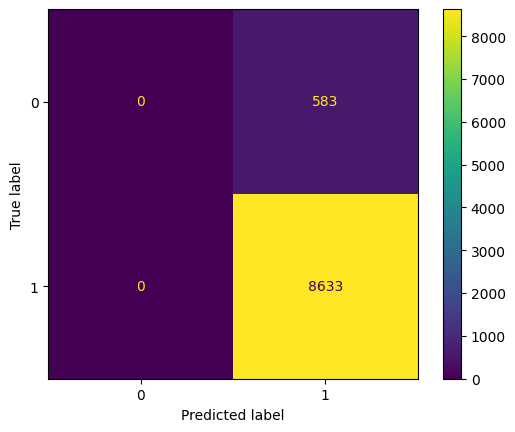

288/288 [==============================] - 1s 2ms/step
ROC AUC: 0.8966


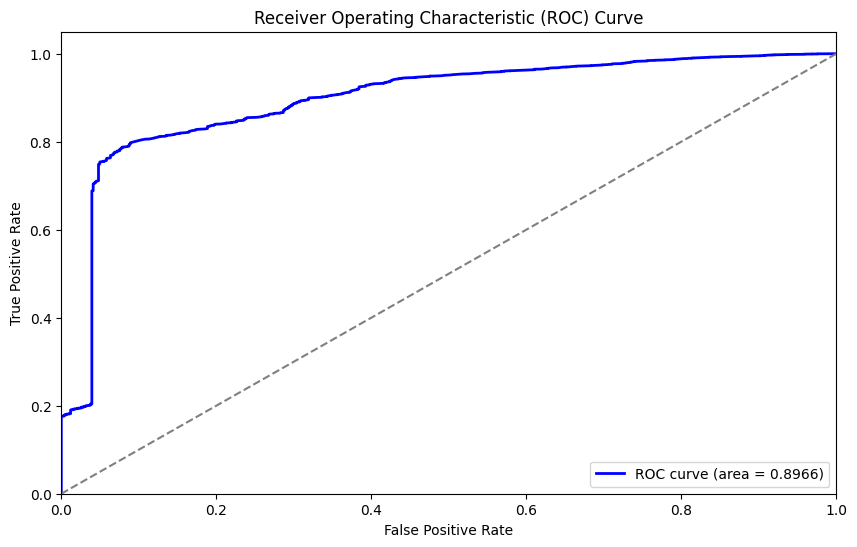

Mean Absolute Error (MAE): 0.0633
Mean Squared Error (MSE): 0.0633
Root Mean Squared Error (RMSE): 0.2515


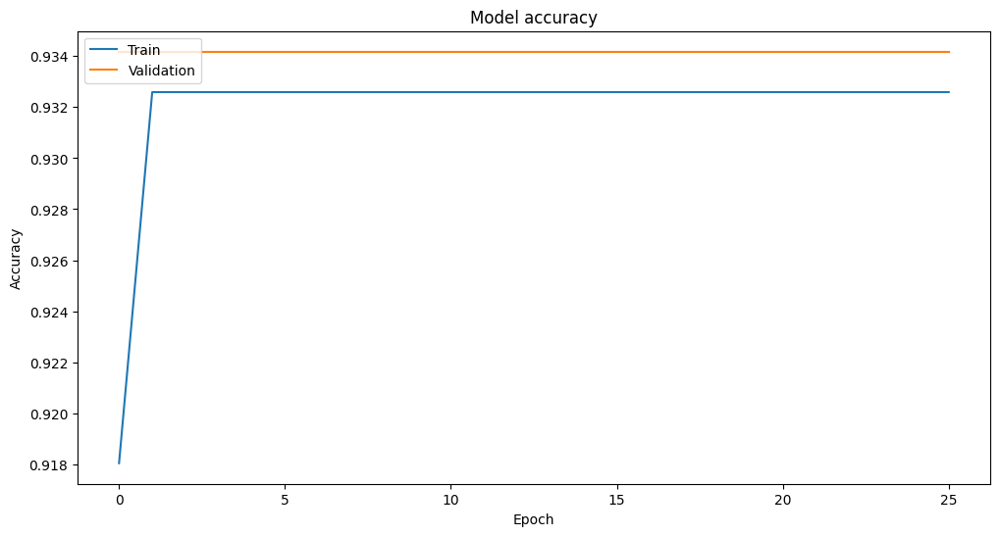

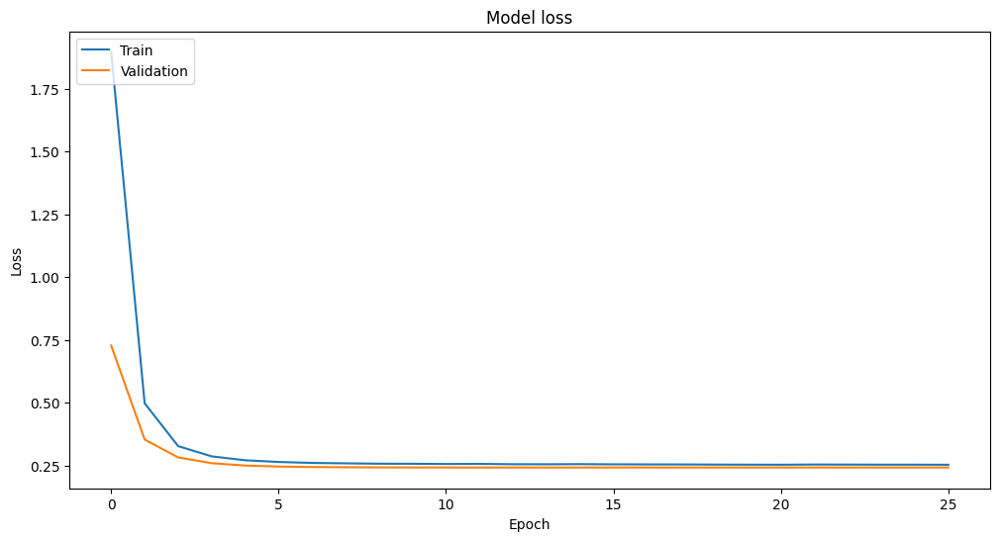

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, roc_auc_score, mean_absolute_error, mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, LSTM
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.regularizers import l2
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame
# Create additional features
data['total_delay'] = data['carrier_delay'] + data['weather_delay'] + data['nas_delay'] + data['security_delay'] + data['late_aircraft_delay']

# Select features and target
features = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay',
            'total_delay', 'carrier', 'airport']
X = data[features]
y = data['delayed']

# Identify categorical and numerical columns
categorical_cols = ['carrier', 'airport']
numerical_cols = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay', 'total_delay']

# Preprocessing for numerical data (with imputation)
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# Preprocess the data
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

# Convert sparse matrix to dense matrix
X_train = X_train.toarray()
X_test = X_test.toarray()

# Reshape input data to 3D for LSTM [samples, timesteps, features]
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

# Check for NaN values
print("NaN values in X_train:", np.isnan(X_train).sum())
print("NaN values in X_test:", np.isnan(X_test).sum())
print("NaN values in y_train:", np.isnan(y_train).sum())
print("NaN values in y_test:", np.isnan(y_test).sum())

# Define the classic LSTM model
model = Sequential([
    LSTM(64, activation='relu', return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2]), kernel_regularizer=l2(0.01)),
    Dropout(0.5),
    LSTM(32, activation='relu', return_sequences=False, kernel_regularizer=l2(0.01)),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

# Compile the model with a different optimizer
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Callbacks for early stopping and saving the best model
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('best_model.keras', save_best_only=True, monitor='val_loss')

# Train the model
history = model.fit(X_train, y_train, epochs=120, batch_size=64, validation_split=0.2,
                    callbacks=[early_stopping, model_checkpoint])

# Evaluate the model on the test set
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy:.4f}")

# Evaluate the model on the training set
train_loss, train_accuracy = model.evaluate(X_train, y_train)
print(f"Training Accuracy: {train_accuracy:.4f}")

# Calculate additional performance metrics
y_pred = (model.predict(X_test) > 0.5).astype("int32")
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Calculate specificity
conf_matrix = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = conf_matrix.ravel()
specificity = tn / (tn + fp)

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Specificity: {specificity:.4f}")

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)
disp.plot()
plt.show()

# Calculate ROC curve and AUC
y_pred_proba = model.predict(X_test).ravel()
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)
print(f"ROC AUC: {roc_auc:.4f}")

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Calculate error metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")

# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


classic lstm at 0.2 test data

NaN values in X_train: 0
NaN values in X_test: 0
NaN values in y_train: 0
NaN values in y_test: 0
Epoch 1/120
461/461 [==============================] - 6s 8ms/step - loss: 0.5777 - accuracy: 0.9249 - val_loss: 0.3439 - val_accuracy: 0.9339
Epoch 2/120
461/461 [==============================] - 3s 7ms/step - loss: 0.2673 - accuracy: 0.9321 - val_loss: 0.2295 - val_accuracy: 0.9339
Epoch 3/120
461/461 [==============================] - 3s 7ms/step - loss: 0.2320 - accuracy: 0.9321 - val_loss: 0.2162 - val_accuracy: 0.9339
Epoch 4/120
461/461 [==============================] - 3s 7ms/step - loss: 0.2201 - accuracy: 0.9321 - val_loss: 0.2097 - val_accuracy: 0.9339
Epoch 5/120
461/461 [==============================] - 3s 7ms/step - loss: 0.2152 - accuracy: 0.9321 - val_loss: 0.2054 - val_accuracy: 0.9339
Epoch 6/120
461/461 [==============================] - 3s 7ms/step - loss: 0.2091 - accuracy: 0.9321 - val_loss: 0.2024 - val_accuracy: 0.9339
Epoch 7/120
461/461 [=======================

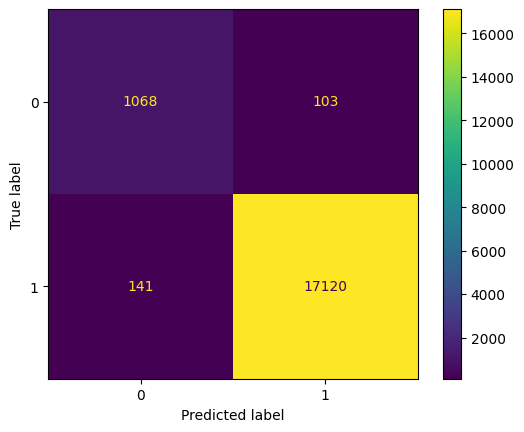

576/576 [==============================] - 1s 2ms/step
ROC AUC: 0.9866


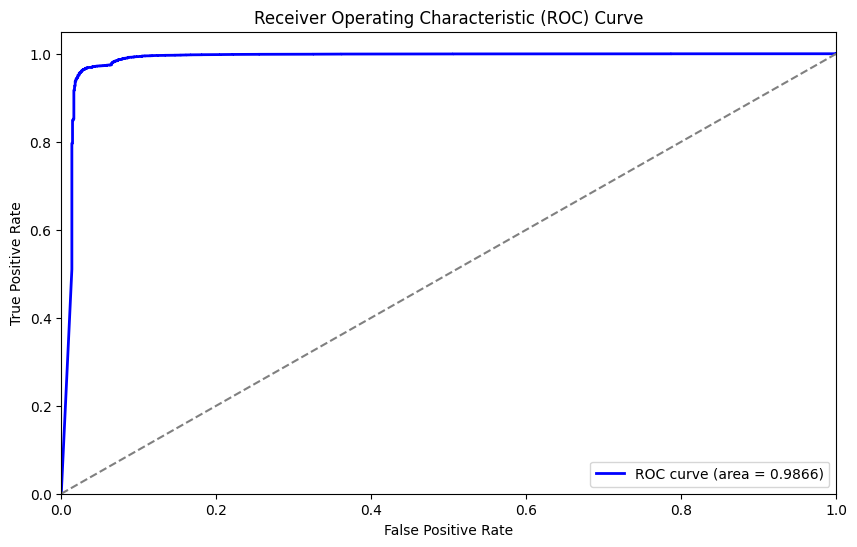

Mean Absolute Error (MAE): 0.0132
Mean Squared Error (MSE): 0.0132
Root Mean Squared Error (RMSE): 0.1151


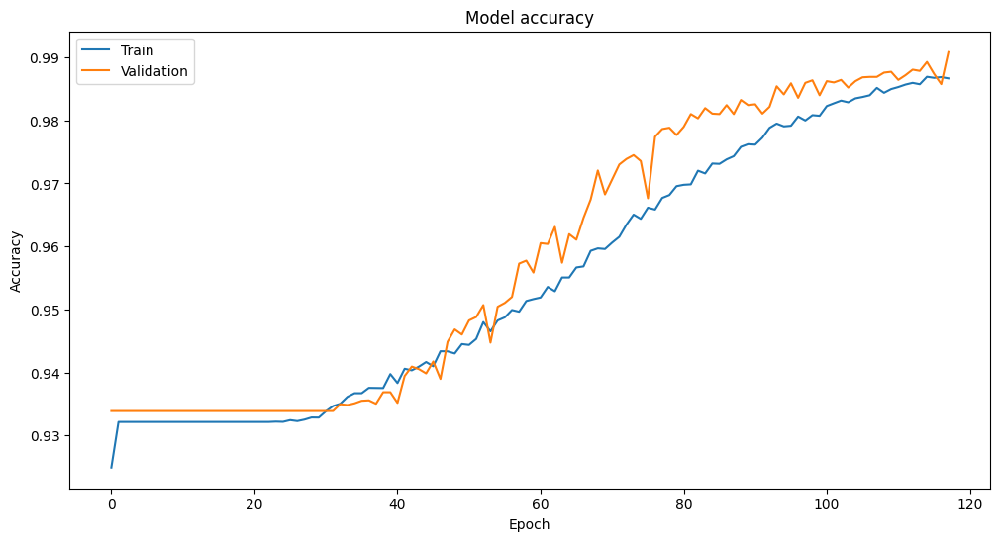

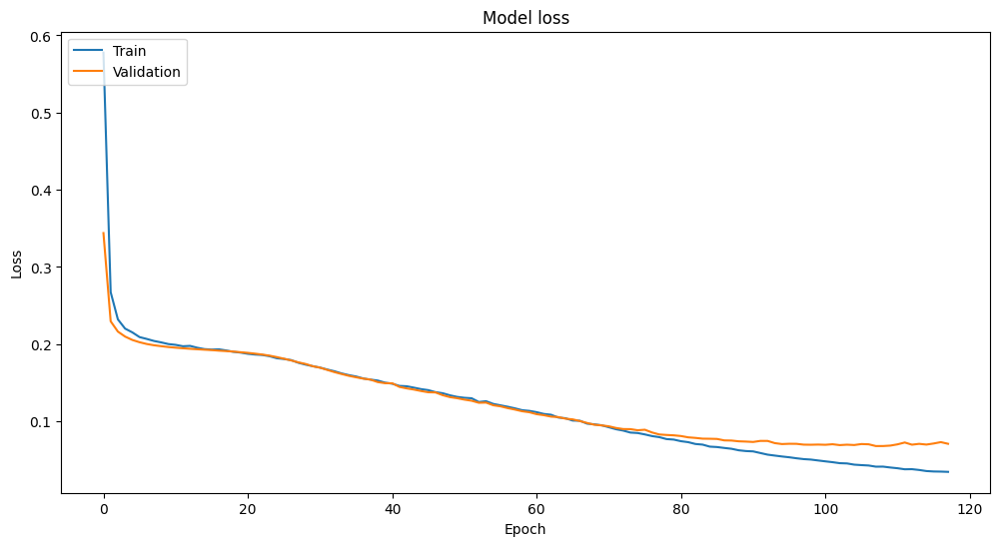

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, roc_auc_score, mean_absolute_error, mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, LSTM
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame
# Create additional features
data['total_delay'] = data['carrier_delay'] + data['weather_delay'] + data['nas_delay'] + data['security_delay'] + data['late_aircraft_delay']

# Select features and target
features = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay',
            'total_delay', 'carrier', 'airport']
X = data[features]
y = data['delayed']

# Identify categorical and numerical columns
categorical_cols = ['carrier', 'airport']
numerical_cols = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay', 'total_delay']

# Preprocessing for numerical data (with imputation)
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Preprocess the data
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

# Convert sparse matrix to dense matrix
X_train = X_train.toarray()
X_test = X_test.toarray()

# Reshape input data to 3D for LSTM [samples, timesteps, features]
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

# Check for NaN values
print("NaN values in X_train:", np.isnan(X_train).sum())
print("NaN values in X_test:", np.isnan(X_test).sum())
print("NaN values in y_train:", np.isnan(y_train).sum())
print("NaN values in y_test:", np.isnan(y_test).sum())

# Define the classic LSTM model
model = Sequential([
    LSTM(128, activation='relu', return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dropout(0.4),
    LSTM(64, activation='relu', return_sequences=False),
    Dropout(0.4),
    Dense(1, activation='sigmoid')
])

# Compile the model with a different optimizer
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Callbacks for early stopping and saving the best model
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('best_model.keras', save_best_only=True, monitor='val_loss')

# Train the model
history = model.fit(X_train, y_train, epochs=120, batch_size=128, validation_split=0.2,
                    callbacks=[early_stopping, model_checkpoint])

# Evaluate the model on the test set
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy:.4f}")

# Evaluate the model on the training set
train_loss, train_accuracy = model.evaluate(X_train, y_train)
print(f"Training Accuracy: {train_accuracy:.4f}")

# Calculate additional performance metrics
y_pred = (model.predict(X_test) > 0.5).astype("int32")
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Calculate specificity
conf_matrix = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = conf_matrix.ravel()
specificity = tn / (tn + fp)

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Specificity: {specificity:.4f}")

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)
disp.plot()
plt.show()

# Calculate ROC curve and AUC
y_pred_proba = model.predict(X_test).ravel()
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)
print(f"ROC AUC: {roc_auc:.4f}")

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Calculate error metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")

# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


classic lstm at 0.3 test data

NaN values in X_train: 0
NaN values in X_test: 0
NaN values in y_train: 0
NaN values in y_test: 0
Epoch 1/120
404/404 [==============================] - 6s 8ms/step - loss: 0.5993 - accuracy: 0.9262 - val_loss: 0.4010 - val_accuracy: 0.9344
Epoch 2/120
404/404 [==============================] - 3s 7ms/step - loss: 0.2863 - accuracy: 0.9321 - val_loss: 0.2355 - val_accuracy: 0.9344
Epoch 3/120
404/404 [==============================] - 3s 7ms/step - loss: 0.2362 - accuracy: 0.9321 - val_loss: 0.2190 - val_accuracy: 0.9344
Epoch 4/120
404/404 [==============================] - 3s 7ms/step - loss: 0.2240 - accuracy: 0.9321 - val_loss: 0.2118 - val_accuracy: 0.9344
Epoch 5/120
404/404 [==============================] - 3s 7ms/step - loss: 0.2158 - accuracy: 0.9321 - val_loss: 0.2070 - val_accuracy: 0.9344
Epoch 6/120
404/404 [==============================] - 3s 7ms/step - loss: 0.2115 - accuracy: 0.9321 - val_loss: 0.2039 - val_accuracy: 0.9344
Epoch 7/120
404/404 [=======================

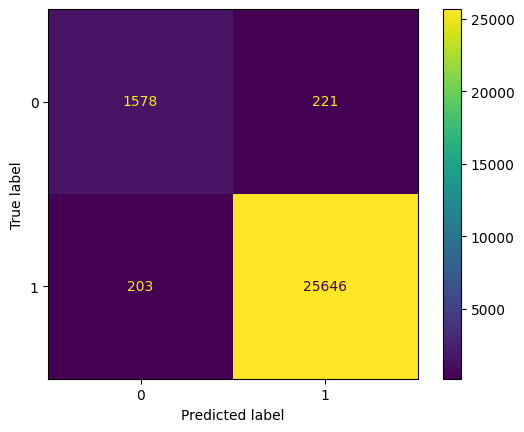

864/864 [==============================] - 1s 2ms/step
ROC AUC: 0.9843


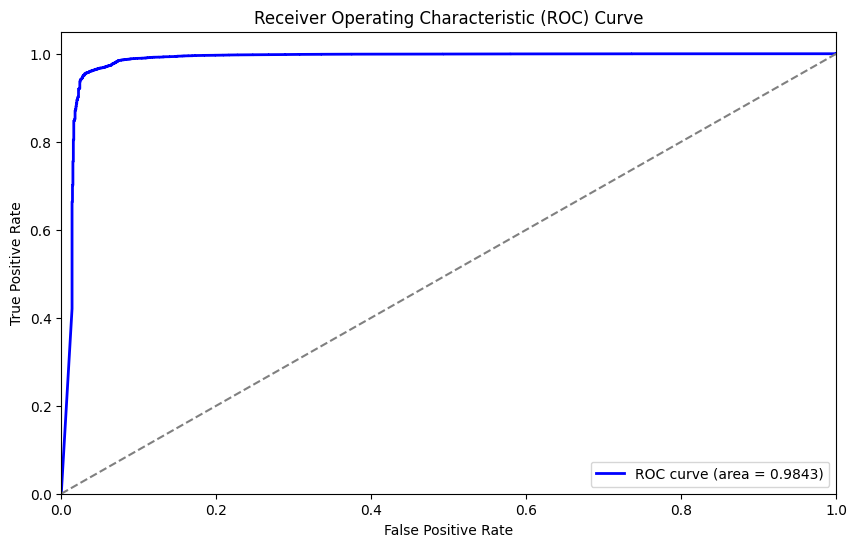

Mean Absolute Error (MAE): 0.0153
Mean Squared Error (MSE): 0.0153
Root Mean Squared Error (RMSE): 0.1238


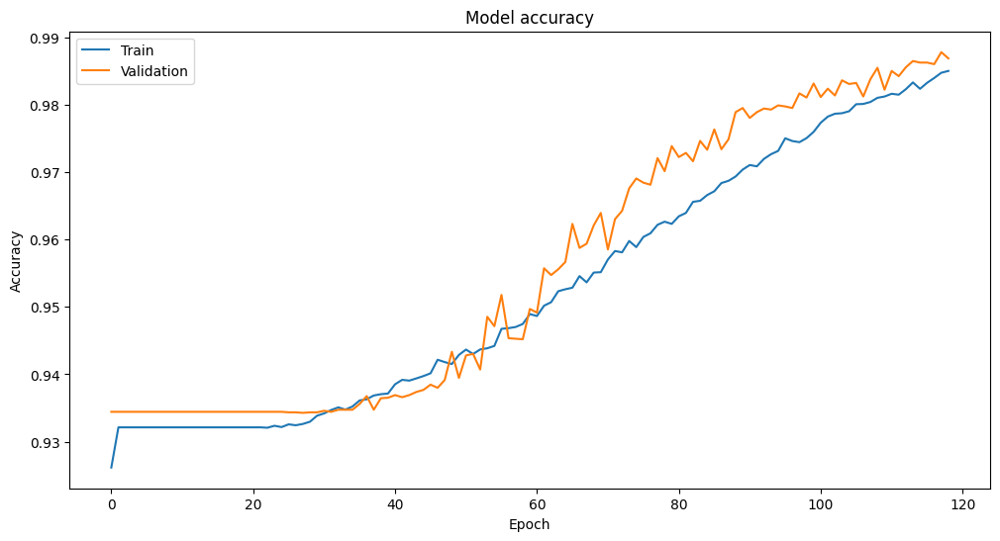

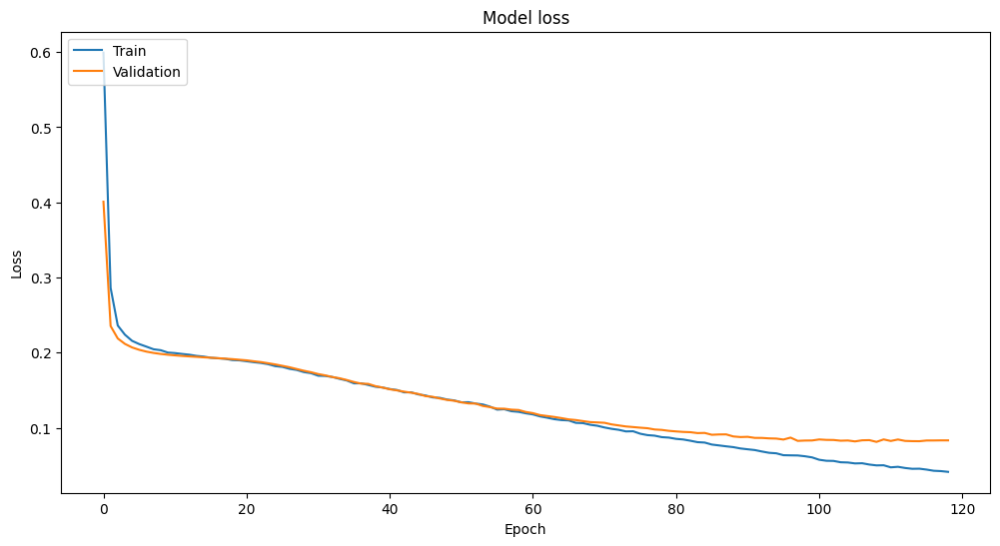

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, roc_auc_score, mean_absolute_error, mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, LSTM
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame
# Create additional features
data['total_delay'] = data['carrier_delay'] + data['weather_delay'] + data['nas_delay'] + data['security_delay'] + data['late_aircraft_delay']

# Select features and target
features = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay',
            'total_delay', 'carrier', 'airport']
X = data[features]
y = data['delayed']

# Identify categorical and numerical columns
categorical_cols = ['carrier', 'airport']
numerical_cols = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay', 'total_delay']

# Preprocessing for numerical data (with imputation)
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Preprocess the data
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

# Convert sparse matrix to dense matrix
X_train = X_train.toarray()
X_test = X_test.toarray()

# Reshape input data to 3D for LSTM [samples, timesteps, features]
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

# Check for NaN values
print("NaN values in X_train:", np.isnan(X_train).sum())
print("NaN values in X_test:", np.isnan(X_test).sum())
print("NaN values in y_train:", np.isnan(y_train).sum())
print("NaN values in y_test:", np.isnan(y_test).sum())

# Define the classic LSTM model
model = Sequential([
    LSTM(128, activation='relu', return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dropout(0.4),
    LSTM(64, activation='relu', return_sequences=False),
    Dropout(0.4),
    Dense(1, activation='sigmoid')
])

# Compile the model with a different optimizer
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Callbacks for early stopping and saving the best model
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('best_model.keras', save_best_only=True, monitor='val_loss')

# Train the model
history = model.fit(X_train, y_train, epochs=120, batch_size=128, validation_split=0.2,
                    callbacks=[early_stopping, model_checkpoint])

# Evaluate the model on the test set
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy:.4f}")

# Evaluate the model on the training set
train_loss, train_accuracy = model.evaluate(X_train, y_train)
print(f"Training Accuracy: {train_accuracy:.4f}")

# Calculate additional performance metrics
y_pred = (model.predict(X_test) > 0.5).astype("int32")
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Calculate specificity
conf_matrix = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = conf_matrix.ravel()
specificity = tn / (tn + fp)

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Specificity: {specificity:.4f}")

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)
disp.plot()
plt.show()

# Calculate ROC curve and AUC
y_pred_proba = model.predict(X_test).ravel()
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)
print(f"ROC AUC: {roc_auc:.4f}")

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Calculate error metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")

# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


classic lstm at 0.4 test data

NaN values in X_train: 0
NaN values in X_test: 0
NaN values in y_train: 0
NaN values in y_test: 0
Epoch 1/120
346/346 [==============================] - 5s 8ms/step - loss: 0.6269 - accuracy: 0.9234 - val_loss: 0.4892 - val_accuracy: 0.9342
Epoch 2/120
346/346 [==============================] - 2s 7ms/step - loss: 0.3263 - accuracy: 0.9319 - val_loss: 0.2457 - val_accuracy: 0.9342
Epoch 3/120
346/346 [==============================] - 2s 7ms/step - loss: 0.2442 - accuracy: 0.9319 - val_loss: 0.2243 - val_accuracy: 0.9342
Epoch 4/120
346/346 [==============================] - 2s 7ms/step - loss: 0.2294 - accuracy: 0.9319 - val_loss: 0.2155 - val_accuracy: 0.9342
Epoch 5/120
346/346 [==============================] - 2s 7ms/step - loss: 0.2221 - accuracy: 0.9319 - val_loss: 0.2103 - val_accuracy: 0.9342
Epoch 6/120
346/346 [==============================] - 2s 7ms/step - loss: 0.2160 - accuracy: 0.9319 - val_loss: 0.2067 - val_accuracy: 0.9342
Epoch 7/120
346/346 [=======================

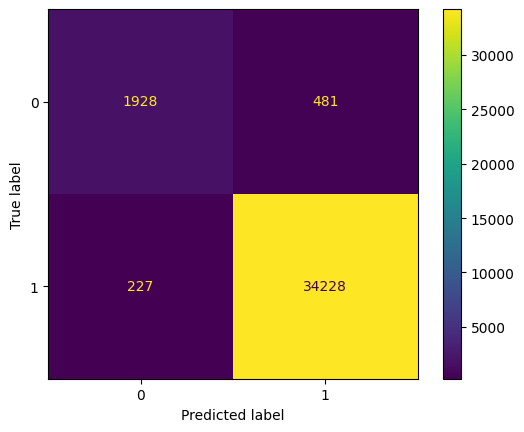

1152/1152 [==============================] - 2s 2ms/step
ROC AUC: 0.9795


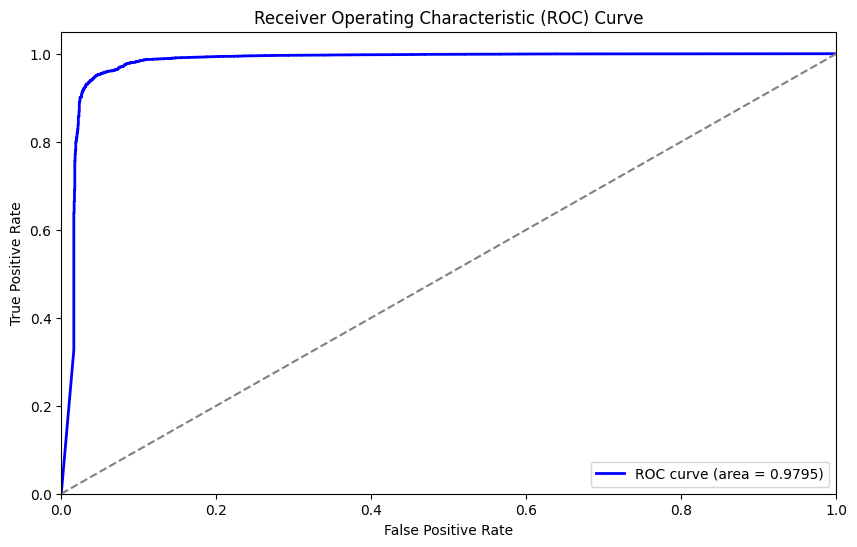

Mean Absolute Error (MAE): 0.0192
Mean Squared Error (MSE): 0.0192
Root Mean Squared Error (RMSE): 0.1386


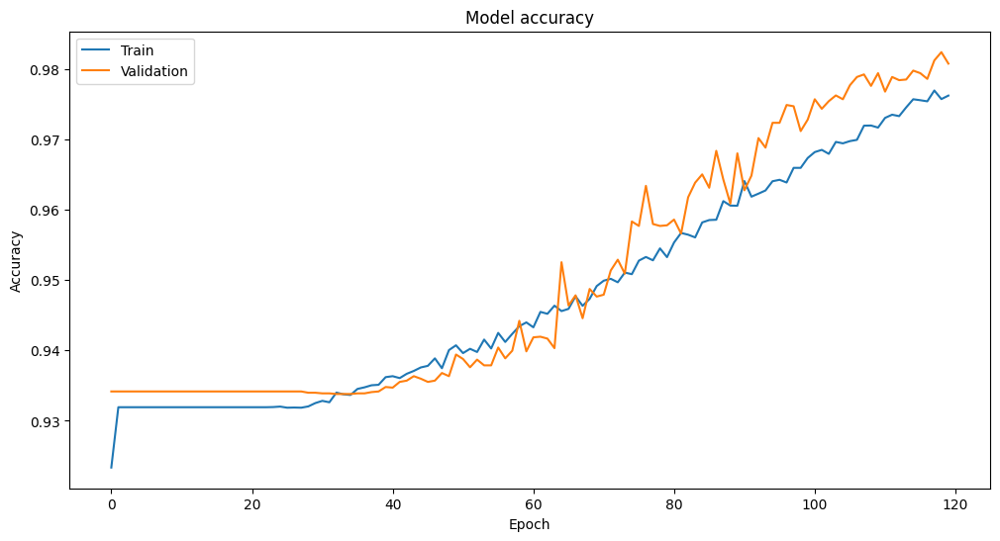

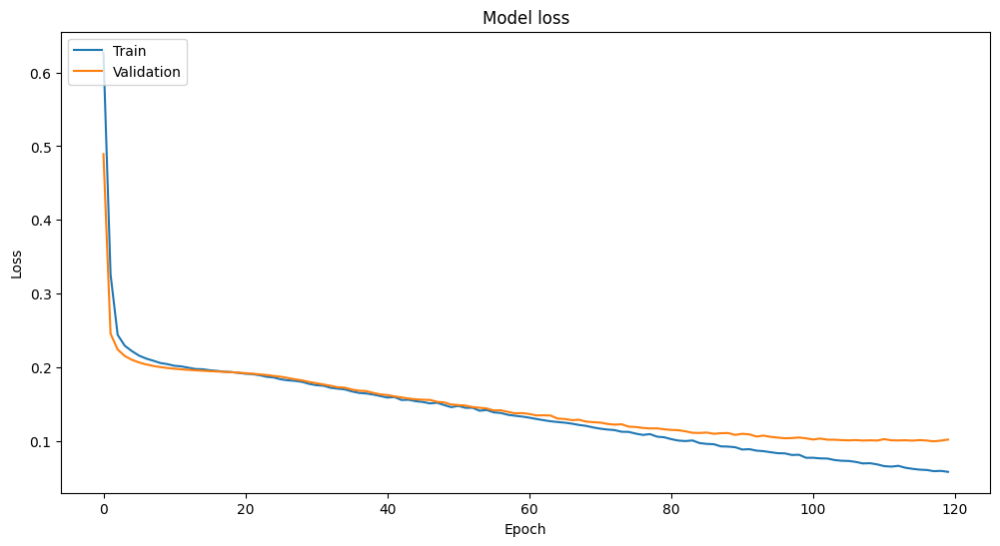

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, roc_auc_score, mean_absolute_error, mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, LSTM
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame
# Create additional features
data['total_delay'] = data['carrier_delay'] + data['weather_delay'] + data['nas_delay'] + data['security_delay'] + data['late_aircraft_delay']

# Select features and target
features = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay',
            'total_delay', 'carrier', 'airport']
X = data[features]
y = data['delayed']

# Identify categorical and numerical columns
categorical_cols = ['carrier', 'airport']
numerical_cols = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay', 'total_delay']

# Preprocessing for numerical data (with imputation)
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0., random_state=42)

# Preprocess the data
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

# Convert sparse matrix to dense matrix
X_train = X_train.toarray()
X_test = X_test.toarray()

# Reshape input data to 3D for LSTM [samples, timesteps, features]
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

# Check for NaN values
print("NaN values in X_train:", np.isnan(X_train).sum())
print("NaN values in X_test:", np.isnan(X_test).sum())
print("NaN values in y_train:", np.isnan(y_train).sum())
print("NaN values in y_test:", np.isnan(y_test).sum())

# Define the classic LSTM model
model = Sequential([
    LSTM(128, activation='relu', return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dropout(0.4),
    LSTM(64, activation='relu', return_sequences=False),
    Dropout(0.4),
    Dense(1, activation='sigmoid')
])

# Compile the model with a different optimizer
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Callbacks for early stopping and saving the best model
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
model_checkpoint = ModelCheckpoint('best_model.keras', save_best_only=True, monitor='val_loss')

# Train the model
history = model.fit(X_train, y_train, epochs=120, batch_size=128, validation_split=0.2,
                    callbacks=[early_stopping, model_checkpoint])

# Evaluate the model on the test set
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy:.4f}")

# Evaluate the model on the training set
train_loss, train_accuracy = model.evaluate(X_train, y_train)
print(f"Training Accuracy: {train_accuracy:.4f}")

# Calculate additional performance metrics
y_pred = (model.predict(X_test) > 0.5).astype("int32")
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Calculate specificity
conf_matrix = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = conf_matrix.ravel()
specificity = tn / (tn + fp)

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Specificity: {specificity:.4f}")

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)
disp.plot()
plt.show()

# Calculate ROC curve and AUC
y_pred_proba = model.predict(X_test).ravel()
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)
print(f"ROC AUC: {roc_auc:.4f}")

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Calculate error metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")

# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


gru 0.1

NaN values in X_train: 0
NaN values in X_test: 0
NaN values in y_train: 0
NaN values in y_test: 0
Epoch 1/120
519/519 [==============================] - 8s 9ms/step - loss: 0.4190 - accuracy: 0.9291 - val_loss: 0.2376 - val_accuracy: 0.9342 - lr: 1.0000e-04
Epoch 2/120
519/519 [==============================] - 5s 9ms/step - loss: 0.2340 - accuracy: 0.9326 - val_loss: 0.2160 - val_accuracy: 0.9342 - lr: 1.0000e-04
Epoch 3/120
519/519 [==============================] - 5s 9ms/step - loss: 0.2182 - accuracy: 0.9326 - val_loss: 0.2076 - val_accuracy: 0.9342 - lr: 1.0000e-04
Epoch 4/120
519/519 [==============================] - 5s 9ms/step - loss: 0.2117 - accuracy: 0.9326 - val_loss: 0.2025 - val_accuracy: 0.9342 - lr: 1.0000e-04
Epoch 5/120
519/519 [==============================] - 5s 9ms/step - loss: 0.2067 - accuracy: 0.9326 - val_loss: 0.1991 - val_accuracy: 0.9342 - lr: 1.0000e-04
Epoch 6/120
519/519 [==============================] - 5s 9ms/step - loss: 0.2041 - accuracy: 0.9326 -

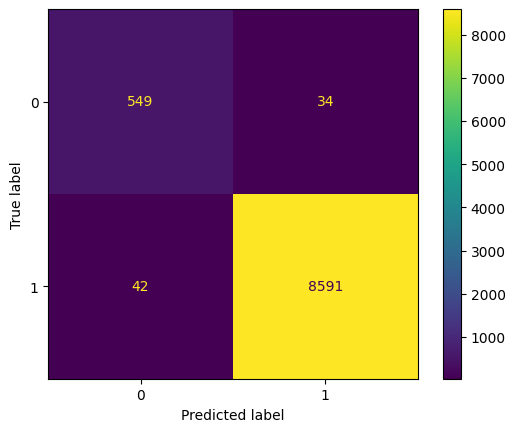

288/288 [==============================] - 1s 2ms/step
ROC AUC: 0.9913


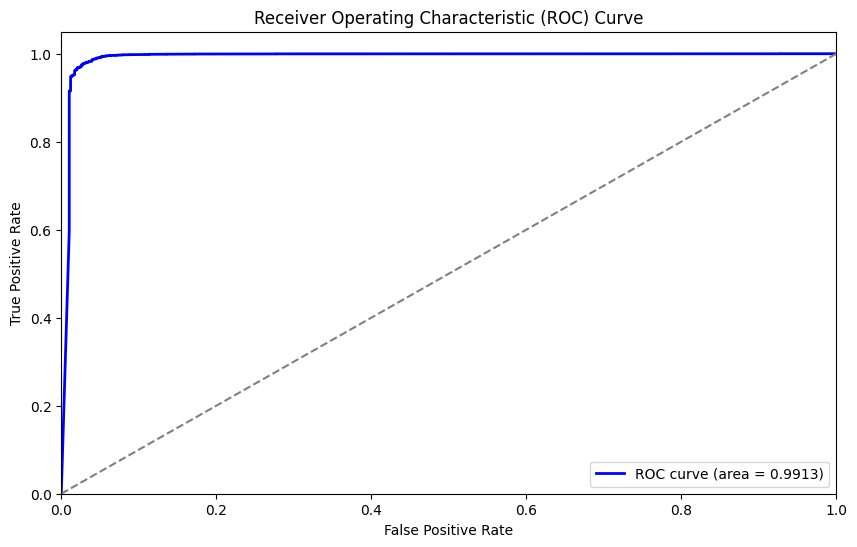

Mean Absolute Error (MAE): 0.0082
Mean Squared Error (MSE): 0.0082
Root Mean Squared Error (RMSE): 0.0908


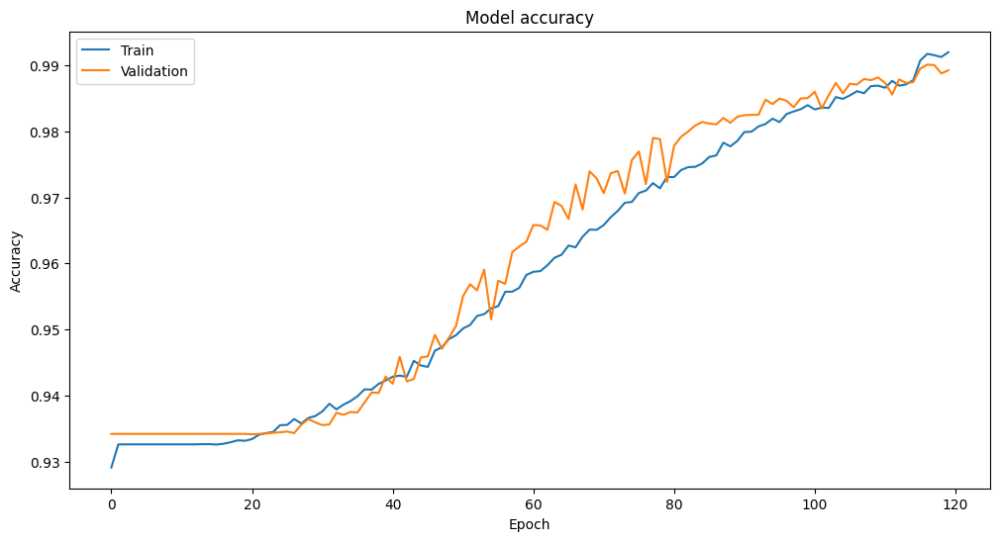

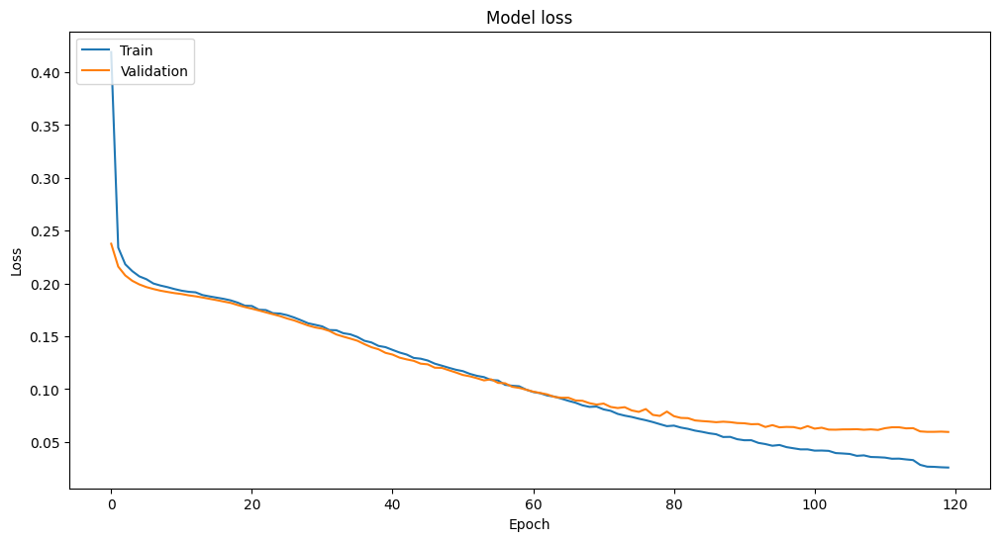

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, roc_auc_score, mean_absolute_error, mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GRU
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame
# Create additional features
data['total_delay'] = data['carrier_delay'] + data['weather_delay'] + data['nas_delay'] + data['security_delay'] + data['late_aircraft_delay']

# Select features and target
features = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay',
            'total_delay', 'carrier', 'airport']
X = data[features]
y = data['delayed']

# Identify categorical and numerical columns
categorical_cols = ['carrier', 'airport']
numerical_cols = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay', 'total_delay']

# Preprocessing for numerical data (with imputation)
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# Preprocess the data
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

# Convert sparse matrix to dense matrix
X_train = X_train.toarray()
X_test = X_test.toarray()

# Reshape input data to 3D for GRU [samples, timesteps, features]
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

# Check for NaN values
print("NaN values in X_train:", np.isnan(X_train).sum())
print("NaN values in X_test:", np.isnan(X_test).sum())
print("NaN values in y_train:", np.isnan(y_train).sum())
print("NaN values in y_test:", np.isnan(y_test).sum())

# Define the GRU model
model = Sequential([
    GRU(128, activation='relu', return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dropout(0.4),
    GRU(64, activation='relu', return_sequences=False),
    Dropout(0.4),
    Dense(1, activation='sigmoid')
])

# Compile the model with a different optimizer
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Callbacks for early stopping, learning rate reduction, and saving the best model
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001)
model_checkpoint = ModelCheckpoint('best_model.keras', save_best_only=True, monitor='val_loss')

# Train the model
history = model.fit(X_train, y_train, epochs=120, batch_size=128, validation_split=0.2,
                    callbacks=[early_stopping, reduce_lr, model_checkpoint])

# Evaluate the model on the test set
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy:.4f}")

# Evaluate the model on the training set
train_loss, train_accuracy = model.evaluate(X_train, y_train)
print(f"Training Accuracy: {train_accuracy:.4f}")

# Calculate additional performance metrics
y_pred = (model.predict(X_test) > 0.5).astype("int32")
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Calculate specificity
conf_matrix = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = conf_matrix.ravel()
specificity = tn / (tn + fp)

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Specificity: {specificity:.4f}")

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)
disp.plot()
plt.show()

# Calculate ROC curve and AUC
y_pred_proba = model.predict(X_test).ravel()
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)
print(f"ROC AUC: {roc_auc:.4f}")

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Calculate error metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")

# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


GRU 0.2

NaN values in X_train: 0
NaN values in X_test: 0
NaN values in y_train: 0
NaN values in y_test: 0
Epoch 1/120
461/461 [==============================] - 8s 10ms/step - loss: 0.4562 - accuracy: 0.9234 - val_loss: 0.2511 - val_accuracy: 0.9339 - lr: 1.0000e-04
Epoch 2/120
461/461 [==============================] - 4s 9ms/step - loss: 0.2428 - accuracy: 0.9321 - val_loss: 0.2214 - val_accuracy: 0.9339 - lr: 1.0000e-04
Epoch 3/120
461/461 [==============================] - 4s 9ms/step - loss: 0.2233 - accuracy: 0.9321 - val_loss: 0.2117 - val_accuracy: 0.9339 - lr: 1.0000e-04
Epoch 4/120
461/461 [==============================] - 4s 9ms/step - loss: 0.2150 - accuracy: 0.9321 - val_loss: 0.2057 - val_accuracy: 0.9339 - lr: 1.0000e-04
Epoch 5/120
461/461 [==============================] - 4s 9ms/step - loss: 0.2092 - accuracy: 0.9321 - val_loss: 0.2019 - val_accuracy: 0.9339 - lr: 1.0000e-04
Epoch 6/120
461/461 [==============================] - 4s 9ms/step - loss: 0.2058 - accuracy: 0.9321 

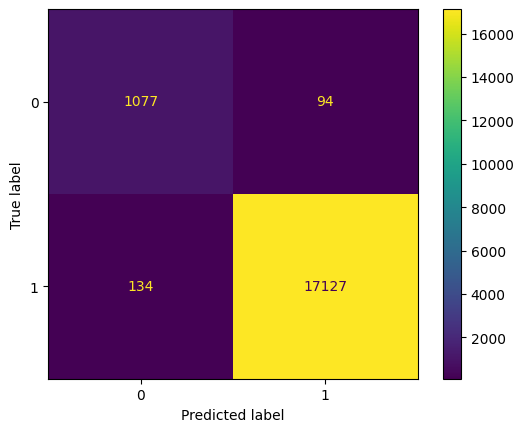

576/576 [==============================] - 1s 2ms/step
ROC AUC: 0.9850


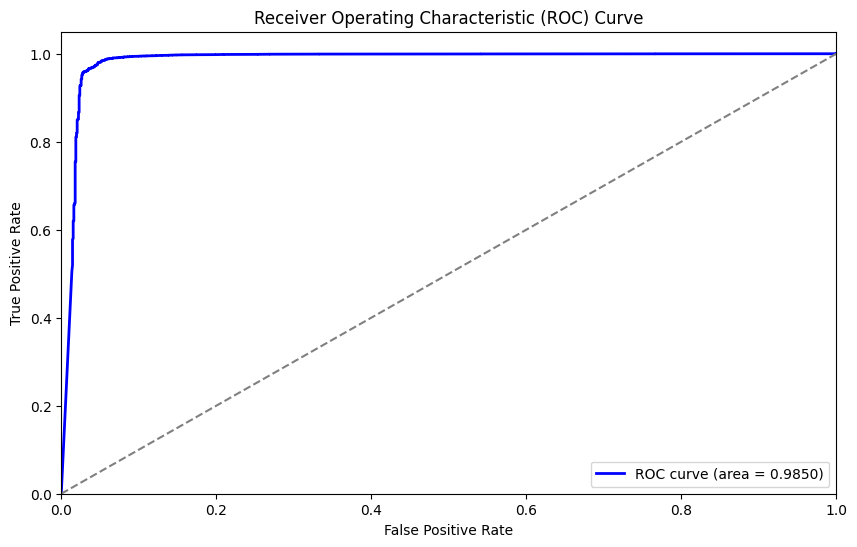

Mean Absolute Error (MAE): 0.0124
Mean Squared Error (MSE): 0.0124
Root Mean Squared Error (RMSE): 0.1112


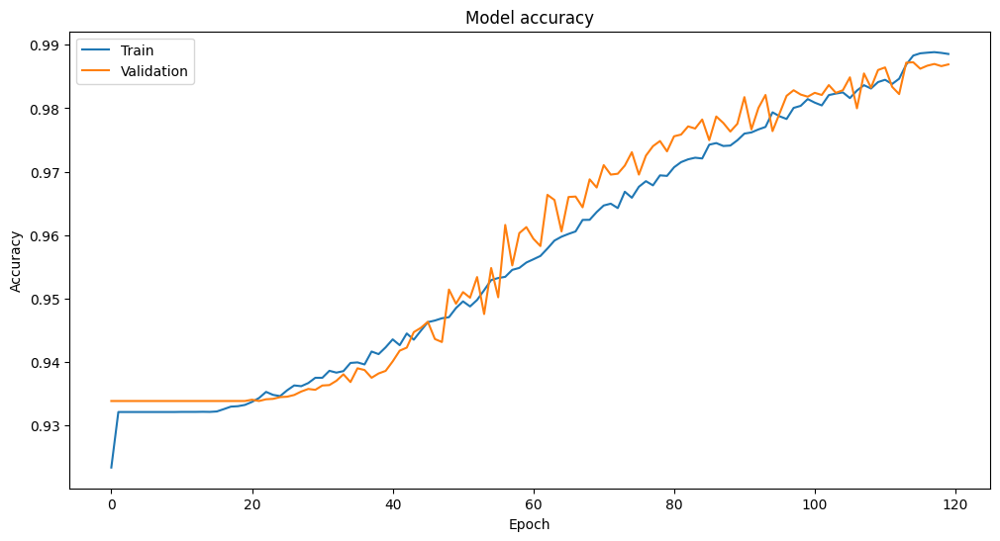

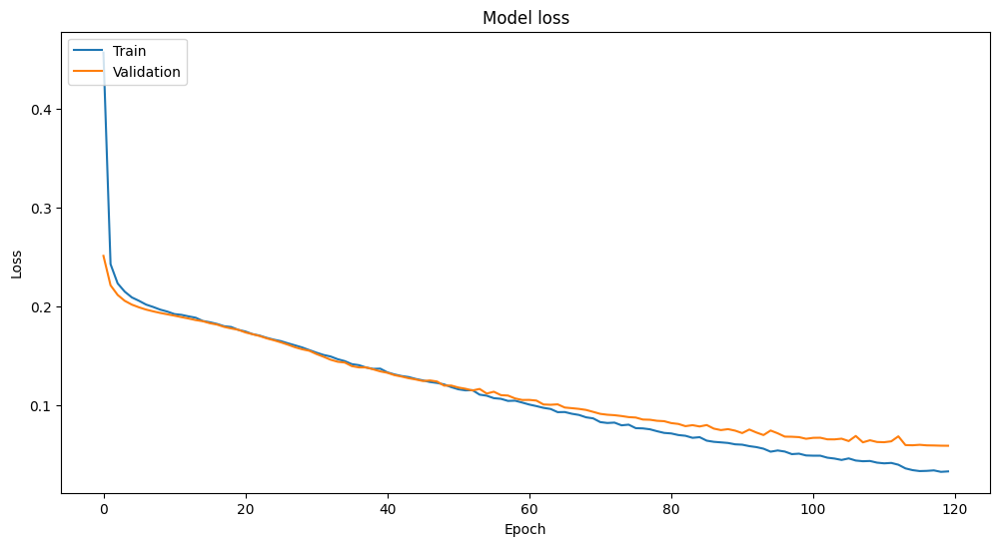

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, roc_auc_score, mean_absolute_error, mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GRU
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame
# Create additional features
data['total_delay'] = data['carrier_delay'] + data['weather_delay'] + data['nas_delay'] + data['security_delay'] + data['late_aircraft_delay']

# Select features and target
features = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay',
            'total_delay', 'carrier', 'airport']
X = data[features]
y = data['delayed']

# Identify categorical and numerical columns
categorical_cols = ['carrier', 'airport']
numerical_cols = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay', 'total_delay']

# Preprocessing for numerical data (with imputation)
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Preprocess the data
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

# Convert sparse matrix to dense matrix
X_train = X_train.toarray()
X_test = X_test.toarray()

# Reshape input data to 3D for GRU [samples, timesteps, features]
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

# Check for NaN values
print("NaN values in X_train:", np.isnan(X_train).sum())
print("NaN values in X_test:", np.isnan(X_test).sum())
print("NaN values in y_train:", np.isnan(y_train).sum())
print("NaN values in y_test:", np.isnan(y_test).sum())

# Define the GRU model
model = Sequential([
    GRU(128, activation='relu', return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dropout(0.4),
    GRU(64, activation='relu', return_sequences=False),
    Dropout(0.4),
    Dense(1, activation='sigmoid')
])

# Compile the model with a different optimizer
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Callbacks for early stopping, learning rate reduction, and saving the best model
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001)
model_checkpoint = ModelCheckpoint('best_model.keras', save_best_only=True, monitor='val_loss')

# Train the model
history = model.fit(X_train, y_train, epochs=120, batch_size=128, validation_split=0.2,
                    callbacks=[early_stopping, reduce_lr, model_checkpoint])

# Evaluate the model on the test set
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy:.4f}")

# Evaluate the model on the training set
train_loss, train_accuracy = model.evaluate(X_train, y_train)
print(f"Training Accuracy: {train_accuracy:.4f}")

# Calculate additional performance metrics
y_pred = (model.predict(X_test) > 0.5).astype("int32")
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Calculate specificity
conf_matrix = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = conf_matrix.ravel()
specificity = tn / (tn + fp)

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Specificity: {specificity:.4f}")

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)
disp.plot()
plt.show()

# Calculate ROC curve and AUC
y_pred_proba = model.predict(X_test).ravel()
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)
print(f"ROC AUC: {roc_auc:.4f}")

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Calculate error metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")

# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


In [ ]:
GRU 0.3

NaN values in X_train: 0
NaN values in X_test: 0
NaN values in y_train: 0
NaN values in y_test: 0
Epoch 1/120
404/404 [==============================] - 7s 9ms/step - loss: 0.5108 - accuracy: 0.9064 - val_loss: 0.2734 - val_accuracy: 0.9344 - lr: 1.0000e-04
Epoch 2/120
404/404 [==============================] - 3s 8ms/step - loss: 0.2527 - accuracy: 0.9321 - val_loss: 0.2248 - val_accuracy: 0.9344 - lr: 1.0000e-04
Epoch 3/120
404/404 [==============================] - 3s 8ms/step - loss: 0.2294 - accuracy: 0.9321 - val_loss: 0.2138 - val_accuracy: 0.9344 - lr: 1.0000e-04
Epoch 4/120
404/404 [==============================] - 3s 8ms/step - loss: 0.2194 - accuracy: 0.9321 - val_loss: 0.2079 - val_accuracy: 0.9344 - lr: 1.0000e-04
Epoch 5/120
404/404 [==============================] - 3s 8ms/step - loss: 0.2128 - accuracy: 0.9321 - val_loss: 0.2038 - val_accuracy: 0.9344 - lr: 1.0000e-04
Epoch 6/120
404/404 [==============================] - 3s 8ms/step - loss: 0.2082 - accuracy: 0.9321 -

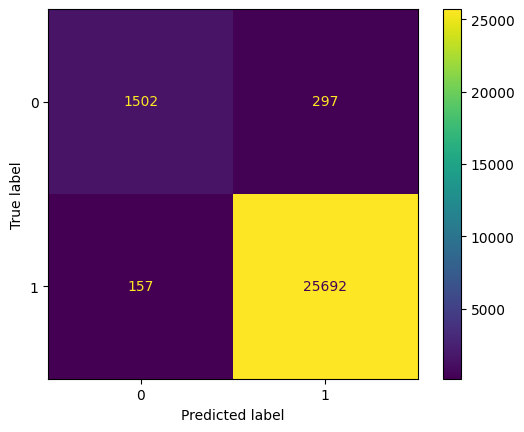

864/864 [==============================] - 1s 2ms/step
ROC AUC: 0.9801


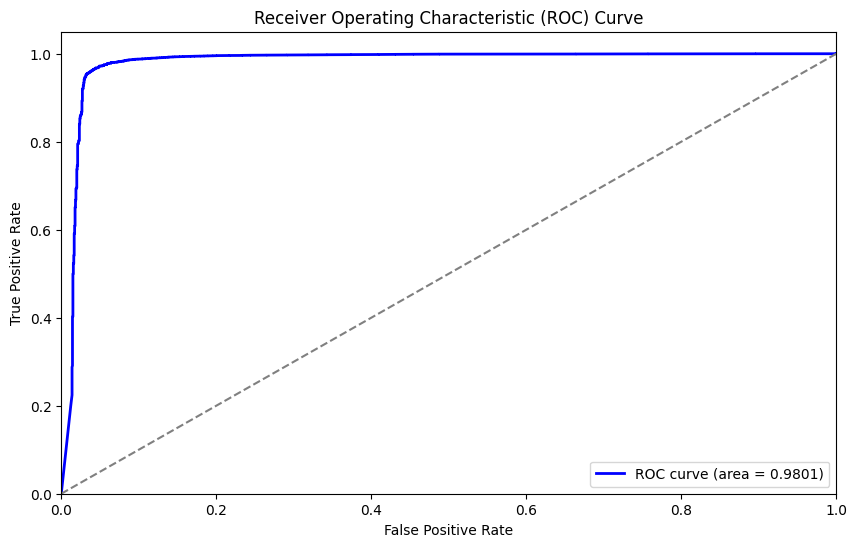

Mean Absolute Error (MAE): 0.0164
Mean Squared Error (MSE): 0.0164
Root Mean Squared Error (RMSE): 0.1281


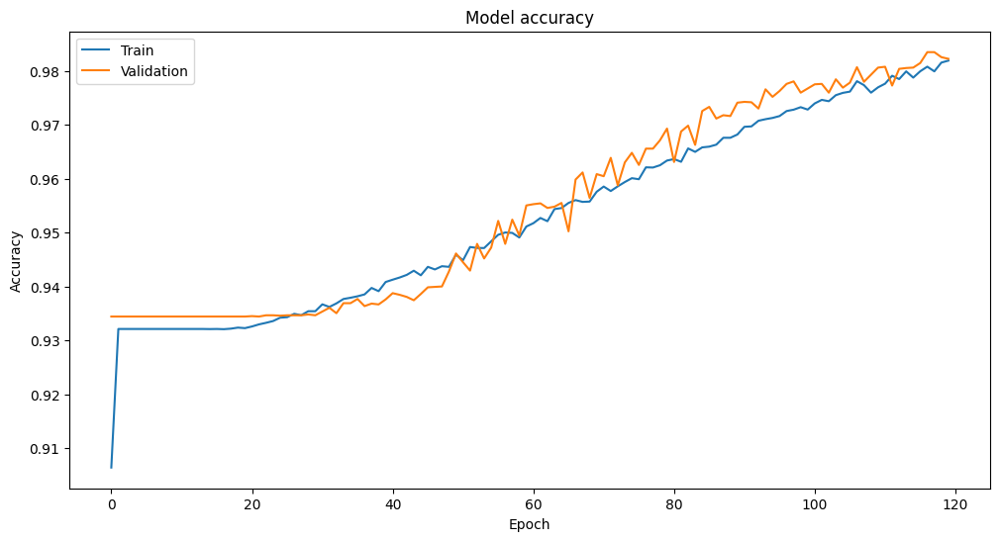

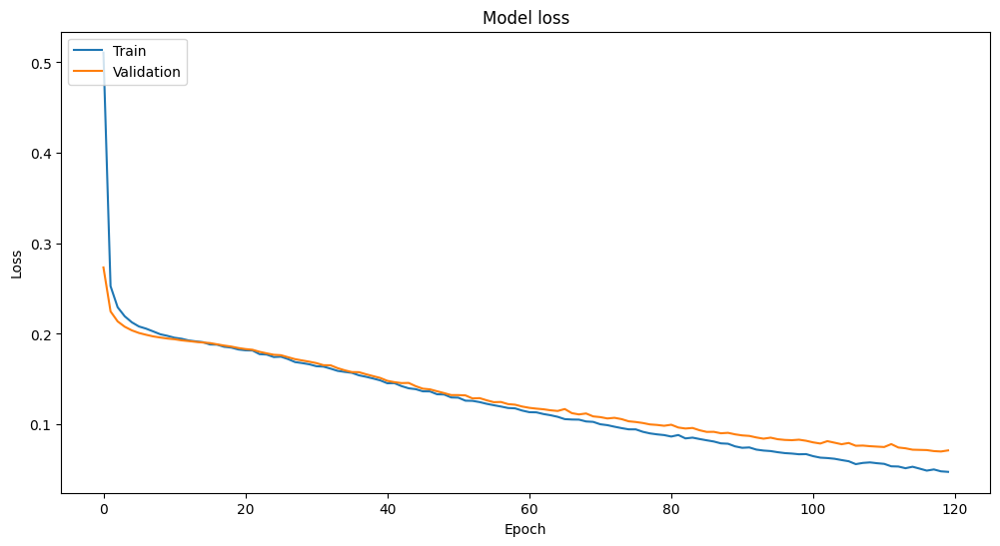

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, roc_auc_score, mean_absolute_error, mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GRU
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame
# Create additional features
data['total_delay'] = data['carrier_delay'] + data['weather_delay'] + data['nas_delay'] + data['security_delay'] + data['late_aircraft_delay']

# Select features and target
features = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay',
            'total_delay', 'carrier', 'airport']
X = data[features]
y = data['delayed']

# Identify categorical and numerical columns
categorical_cols = ['carrier', 'airport']
numerical_cols = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay', 'total_delay']

# Preprocessing for numerical data (with imputation)
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Preprocess the data
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

# Convert sparse matrix to dense matrix
X_train = X_train.toarray()
X_test = X_test.toarray()

# Reshape input data to 3D for GRU [samples, timesteps, features]
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

# Check for NaN values
print("NaN values in X_train:", np.isnan(X_train).sum())
print("NaN values in X_test:", np.isnan(X_test).sum())
print("NaN values in y_train:", np.isnan(y_train).sum())
print("NaN values in y_test:", np.isnan(y_test).sum())

# Define the GRU model
model = Sequential([
    GRU(128, activation='relu', return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dropout(0.4),
    GRU(64, activation='relu', return_sequences=False),
    Dropout(0.4),
    Dense(1, activation='sigmoid')
])

# Compile the model with a different optimizer
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Callbacks for early stopping, learning rate reduction, and saving the best model
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001)
model_checkpoint = ModelCheckpoint('best_model.keras', save_best_only=True, monitor='val_loss')

# Train the model
history = model.fit(X_train, y_train, epochs=120, batch_size=128, validation_split=0.2,
                    callbacks=[early_stopping, reduce_lr, model_checkpoint])

# Evaluate the model on the test set
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy:.4f}")

# Evaluate the model on the training set
train_loss, train_accuracy = model.evaluate(X_train, y_train)
print(f"Training Accuracy: {train_accuracy:.4f}")

# Calculate additional performance metrics
y_pred = (model.predict(X_test) > 0.5).astype("int32")
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Calculate specificity
conf_matrix = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = conf_matrix.ravel()
specificity = tn / (tn + fp)

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Specificity: {specificity:.4f}")

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)
disp.plot()
plt.show()

# Calculate ROC curve and AUC
y_pred_proba = model.predict(X_test).ravel()
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)
print(f"ROC AUC: {roc_auc:.4f}")

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Calculate error metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")

# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


GRU 0.4

NaN values in X_train: 0
NaN values in X_test: 0
NaN values in y_train: 0
NaN values in y_test: 0
Epoch 1/120
346/346 [==============================] - 6s 10ms/step - loss: 0.5150 - accuracy: 0.9209 - val_loss: 0.2911 - val_accuracy: 0.9342 - lr: 1.0000e-04
Epoch 2/120
346/346 [==============================] - 3s 9ms/step - loss: 0.2571 - accuracy: 0.9319 - val_loss: 0.2280 - val_accuracy: 0.9342 - lr: 1.0000e-04
Epoch 3/120
346/346 [==============================] - 3s 9ms/step - loss: 0.2313 - accuracy: 0.9319 - val_loss: 0.2166 - val_accuracy: 0.9342 - lr: 1.0000e-04
Epoch 4/120
346/346 [==============================] - 3s 9ms/step - loss: 0.2225 - accuracy: 0.9319 - val_loss: 0.2102 - val_accuracy: 0.9342 - lr: 1.0000e-04
Epoch 5/120
346/346 [==============================] - 3s 9ms/step - loss: 0.2159 - accuracy: 0.9319 - val_loss: 0.2060 - val_accuracy: 0.9342 - lr: 1.0000e-04
Epoch 6/120
346/346 [==============================] - 3s 9ms/step - loss: 0.2120 - accuracy: 0.9319 

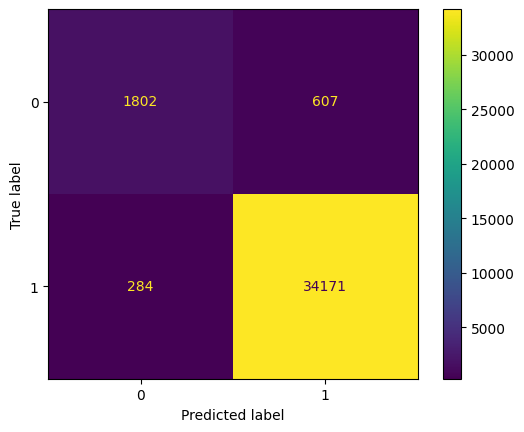

1152/1152 [==============================] - 2s 2ms/step
ROC AUC: 0.9747


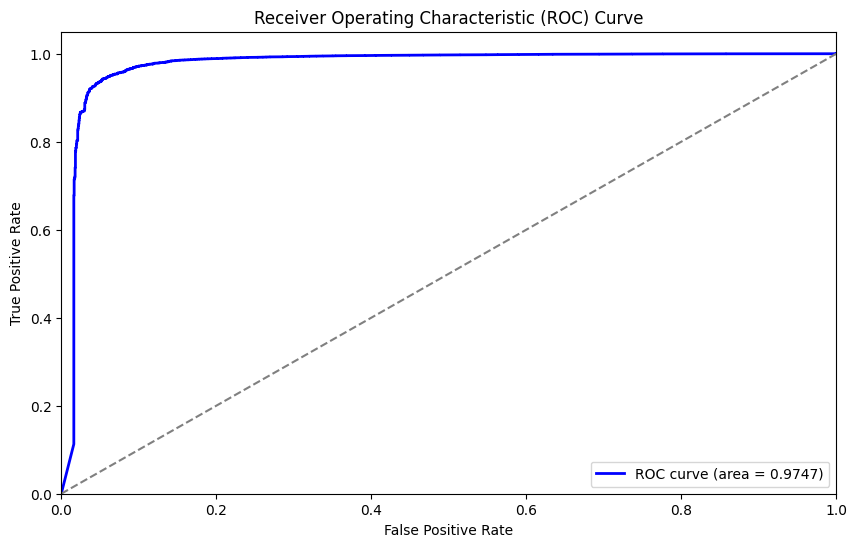

Mean Absolute Error (MAE): 0.0242
Mean Squared Error (MSE): 0.0242
Root Mean Squared Error (RMSE): 0.1555


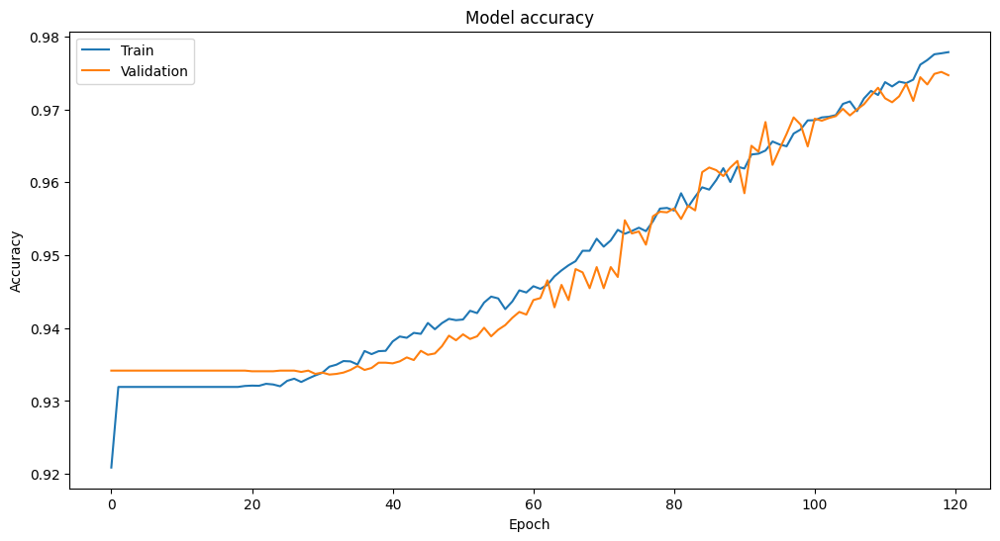

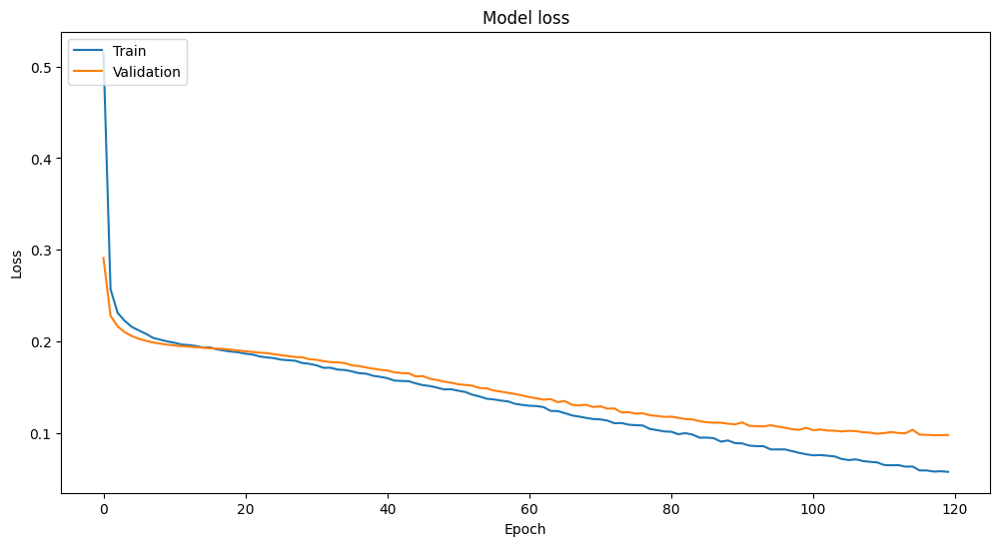

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, roc_auc_score, mean_absolute_error, mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GRU
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame
# Create additional features
data['total_delay'] = data['carrier_delay'] + data['weather_delay'] + data['nas_delay'] + data['security_delay'] + data['late_aircraft_delay']

# Select features and target
features = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay',
            'total_delay', 'carrier', 'airport']
X = data[features]
y = data['delayed']

# Identify categorical and numerical columns
categorical_cols = ['carrier', 'airport']
numerical_cols = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay', 'total_delay']

# Preprocessing for numerical data (with imputation)
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

# Preprocess the data
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

# Convert sparse matrix to dense matrix
X_train = X_train.toarray()
X_test = X_test.toarray()

# Reshape input data to 3D for GRU [samples, timesteps, features]
X_train = X_train.reshape((X_train.shape[0], 1, X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], 1, X_test.shape[1]))

# Check for NaN values
print("NaN values in X_train:", np.isnan(X_train).sum())
print("NaN values in X_test:", np.isnan(X_test).sum())
print("NaN values in y_train:", np.isnan(y_train).sum())
print("NaN values in y_test:", np.isnan(y_test).sum())

# Define the GRU model
model = Sequential([
    GRU(128, activation='relu', return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dropout(0.4),
    GRU(64, activation='relu', return_sequences=False),
    Dropout(0.4),
    Dense(1, activation='sigmoid')
])

# Compile the model with a different optimizer
model.compile(optimizer=Adam(learning_rate=0.0001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Callbacks for early stopping, learning rate reduction, and saving the best model
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001)
model_checkpoint = ModelCheckpoint('best_model.keras', save_best_only=True, monitor='val_loss')

# Train the model
history = model.fit(X_train, y_train, epochs=120, batch_size=128, validation_split=0.2,
                    callbacks=[early_stopping, reduce_lr, model_checkpoint])

# Evaluate the model on the test set
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy:.4f}")

# Evaluate the model on the training set
train_loss, train_accuracy = model.evaluate(X_train, y_train)
print(f"Training Accuracy: {train_accuracy:.4f}")

# Calculate additional performance metrics
y_pred = (model.predict(X_test) > 0.5).astype("int32")
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Calculate specificity
conf_matrix = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = conf_matrix.ravel()
specificity = tn / (tn + fp)

print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Specificity: {specificity:.4f}")

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)
disp.plot()
plt.show()

# Calculate ROC curve and AUC
y_pred_proba = model.predict(X_test).ravel()
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = roc_auc_score(y_test, y_pred_proba)
print(f"ROC AUC: {roc_auc:.4f}")

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Calculate error metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")

# Plot training & validation accuracy values
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

# Plot training & validation loss values
plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


In [ ]:
!pip install tensorflow-addons

NaN values in X_train: 0
NaN values in X_test: 0
NaN values in y_train: 0
NaN values in y_test: 0
1/1 [==============================] - 1s 672ms/step
0 [D loss: 0.7364746630191803, acc.: 46.875] [G loss: 0.7823485136032104]
1/1 [==============================] - 0s 18ms/step
100 [D loss: 0.548417404294014, acc.: 79.6875] [G loss: 1.4753413200378418]
1/1 [==============================] - 0s 18ms/step
200 [D loss: 0.4802860766649246, acc.: 70.3125] [G loss: 2.0858428478240967]
1/1 [==============================] - 0s 19ms/step
300 [D loss: 0.4420761913061142, acc.: 76.5625] [G loss: 2.7016208171844482]
1/1 [==============================] - 0s 19ms/step
400 [D loss: 0.4971446245908737, acc.: 93.75] [G loss: 2.046617031097412]
1/1 [==============================] - 0s 19ms/step
500 [D loss: 0.5920743942260742, acc.: 75.0] [G loss: 1.4950742721557617]
1/1 [==============================] - 0s 20ms/step
600 [D loss: 0.6605706512928009, acc.: 56.25] [G loss: 0.9571172595024109]
1/1 [=====

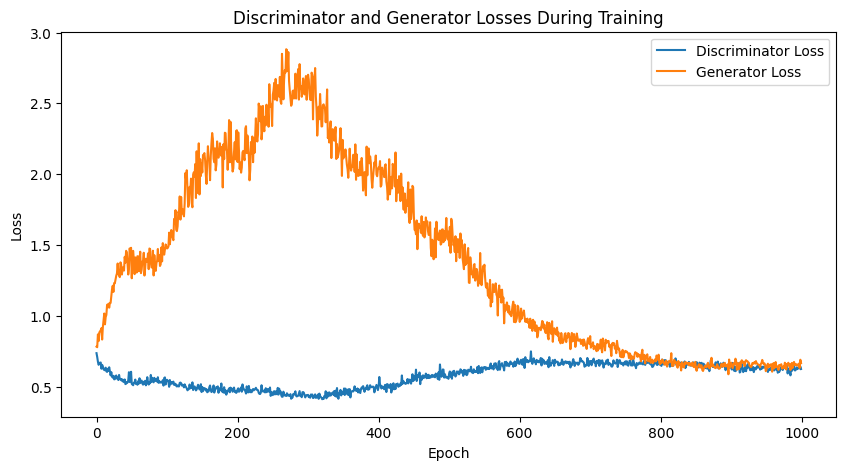

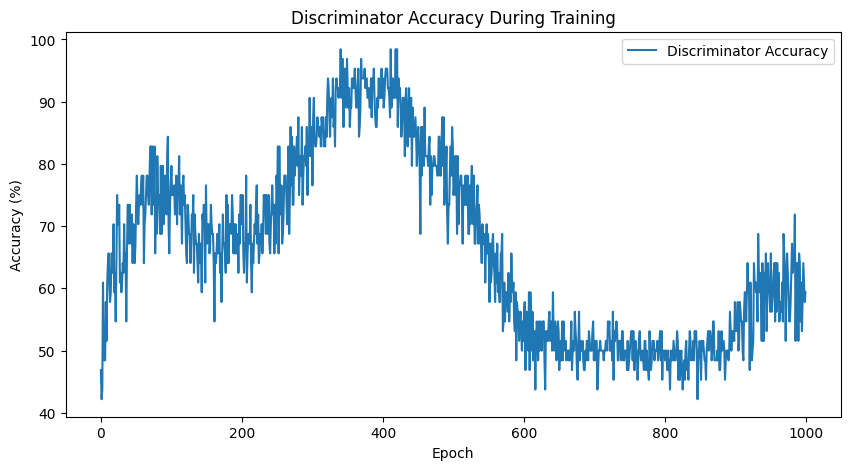

Training Accuracy: 0.9445
Test Accuracy: 0.9386
288/288 [==============================] - 0s 1ms/step
Test Accuracy: 0.8855
Precision: 0.9380
Recall: 0.9399
F1 Score: 0.9390
Specificity: 0.0806
ROC AUC: 0.5102


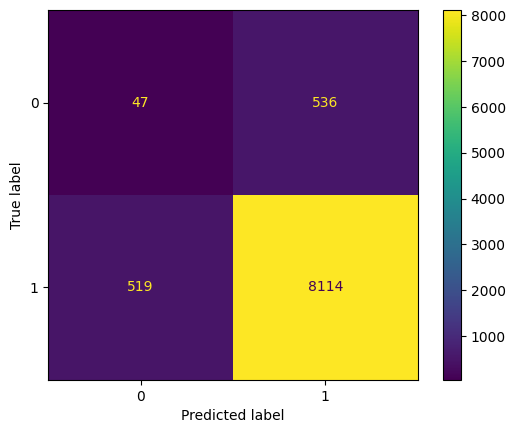

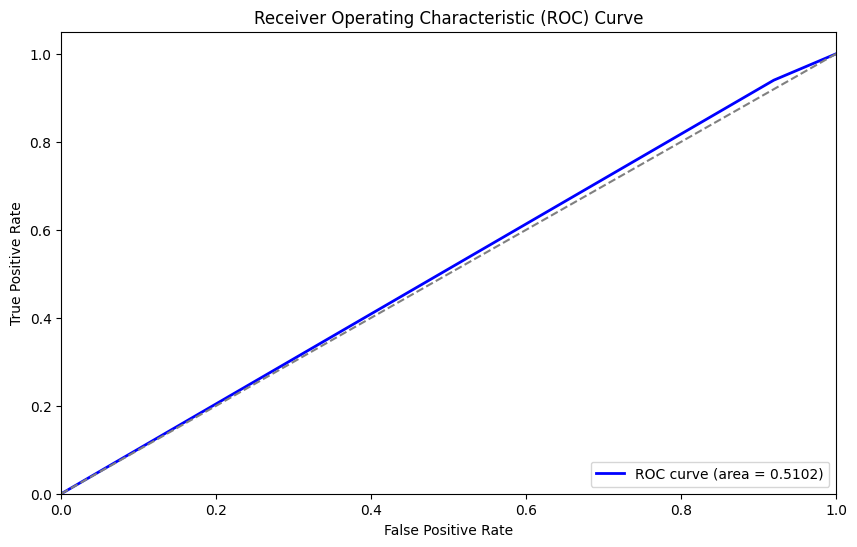

Mean Absolute Error (MAE): 0.1145
Mean Squared Error (MSE): 0.1145
Root Mean Squared Error (RMSE): 0.3383


In [58]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, roc_auc_score, mean_absolute_error, mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Dropout, Input, GRU
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame
# Create additional features
data['total_delay'] = data['carrier_delay'] + data['weather_delay'] + data['nas_delay'] + data['security_delay'] + data['late_aircraft_delay']

# Select features and target
features = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay', 'total_delay', 'carrier', 'airport']
X = data[features]
y = data['delayed']

# Identify categorical and numerical columns
categorical_cols = ['carrier', 'airport']
numerical_cols = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay', 'total_delay']

# Preprocessing for numerical data (with imputation)
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# Preprocess the data
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

# Convert sparse matrix to dense matrix
X_train = X_train.toarray()
X_test = X_test.toarray()

# Reshape input data to 2D for GAN [samples, features]
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1]))

# Check for NaN values
print("NaN values in X_train:", np.isnan(X_train).sum())
print("NaN values in X_test:", np.isnan(X_test).sum())
print("NaN values in y_train:", np.isnan(y_train).sum())
print("NaN values in y_test:", np.isnan(y_test).sum())

# Define the generator model
def build_generator(input_dim, output_dim):
    model = Sequential()
    model.add(Dense(128, activation='relu', input_dim=input_dim))
    model.add(Dropout(0.3))
    model.add(Dense(256, activation='relu'))
    model.add(Dropout(0.3))
    model.add(Dense(output_dim, activation='tanh'))
    return model

# Define the discriminator model
def build_discriminator(input_dim):
    model = Sequential()
    model.add(Dense(256, activation='relu', input_dim=input_dim))
    model.add(Dropout(0.3))
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.3))
    model.add(Dense(1, activation='sigmoid'))
    return model

# Dimensions
input_dim = X_train.shape[1]
output_dim = X_train.shape[1]

# Build and compile the discriminator
discriminator = build_discriminator(input_dim)
discriminator.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# Build the generator
generator = build_generator(input_dim, output_dim)

# Create the GAN
z = Input(shape=(input_dim,))
gen_data = generator(z)
discriminator.trainable = False
validity = discriminator(gen_data)

gan = Model(z, validity)
gan.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy')

# Training the GAN
epochs = 1000  # Adjusted to fewer epochs
batch_size = 64
half_batch = int(batch_size / 2)

d_loss_list = []
g_loss_list = []
d_acc_list = []

for epoch in range(epochs):
    # Train the discriminator
    idx = np.random.randint(0, X_train.shape[0], half_batch)
    real_data = X_train[idx]

    noise = np.random.normal(0, 1, (half_batch, input_dim))
    gen_data = generator.predict(noise)

    d_loss_real = discriminator.train_on_batch(real_data, np.ones((half_batch, 1)))
    d_loss_fake = discriminator.train_on_batch(gen_data, np.zeros((half_batch, 1)))
    d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

    # Train the generator
    noise = np.random.normal(0, 1, (batch_size, input_dim))
    valid_y = np.array([1] * batch_size)

    g_loss = gan.train_on_batch(noise, valid_y)

    d_loss_list.append(d_loss[0])
    g_loss_list.append(g_loss)
    d_acc_list.append(100 * d_loss[1])

    # Print the progress
    if epoch % 100 == 0 or epoch == epochs - 1:
        print(f"{epoch} [D loss: {d_loss[0]}, acc.: {100 * d_loss[1]}] [G loss: {g_loss}]")

# Plotting the Discriminator and Generator losses
plt.figure(figsize=(10, 5))
plt.plot(d_loss_list, label="Discriminator Loss")
plt.plot(g_loss_list, label="Generator Loss")
plt.title("Discriminator and Generator Losses During Training")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.show()

# Plotting the Discriminator accuracy
plt.figure(figsize=(10, 5))
plt.plot(d_acc_list, label="Discriminator Accuracy")
plt.title("Discriminator Accuracy During Training")
plt.xlabel("Epoch")
plt.ylabel("Accuracy (%)")
plt.legend()
plt.show()

# Evaluating the discriminator on the training and test set
train_accuracy = discriminator.evaluate(X_train, np.ones((X_train.shape[0], 1)), verbose=0)[1]
test_accuracy = discriminator.evaluate(X_test, np.ones((X_test.shape[0], 1)), verbose=0)[1]

print(f"Training Accuracy: {train_accuracy:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

# Calculate additional performance metrics
y_pred = discriminator.predict(X_test)
y_pred = (y_pred > 0.5).astype(int)

precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = conf_matrix.ravel()
specificity = tn / (tn + fp)
roc_auc = roc_auc_score(y_test, y_pred)

print(f"Test Accuracy: {accuracy_score(y_test, y_pred):.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Specificity: {specificity:.4f}")
print(f"ROC AUC: {roc_auc:.4f}")

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)
disp.plot()
plt.show()

# Calculate ROC curve and AUC
y_pred_proba = y_pred.ravel()
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Calculate error metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")


NaN values in X_train: 0
NaN values in X_test: 0
NaN values in y_train: 0
NaN values in y_test: 0
1/1 [==============================] - 0s 57ms/step
0 [D loss: 0.689217746257782, acc.: 39.0625] [G loss: 0.8558830618858337]
1/1 [==============================] - 0s 18ms/step
100 [D loss: 0.5013685077428818, acc.: 60.9375] [G loss: 1.6339125633239746]
1/1 [==============================] - 0s 19ms/step
200 [D loss: 0.46265479922294617, acc.: 76.5625] [G loss: 2.2538533210754395]
1/1 [==============================] - 0s 19ms/step
300 [D loss: 0.4094141721725464, acc.: 85.9375] [G loss: 2.472799301147461]
1/1 [==============================] - 0s 18ms/step
400 [D loss: 0.4542894661426544, acc.: 92.1875] [G loss: 2.271944999694824]
1/1 [==============================] - 0s 18ms/step
500 [D loss: 0.5715518295764923, acc.: 78.125] [G loss: 1.5525842905044556]
1/1 [==============================] - 0s 17ms/step
600 [D loss: 0.6523311734199524, acc.: 59.375] [G loss: 1.1346642971038818]
1/1 [

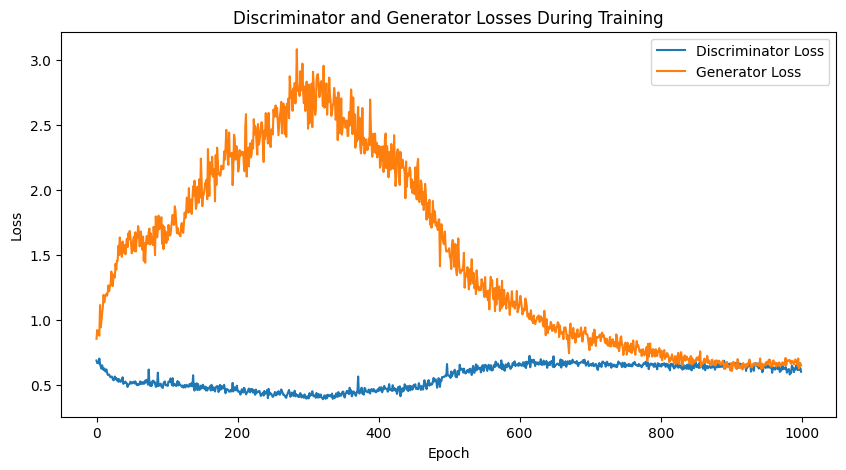

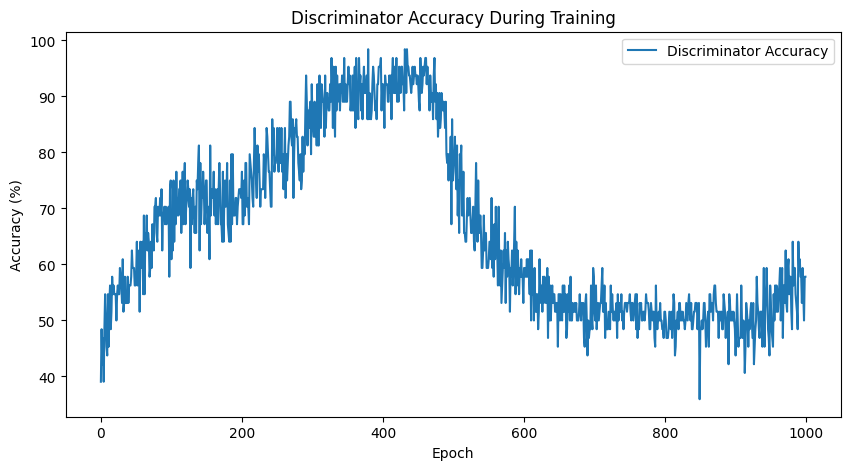

Training Accuracy: 0.9629
Test Accuracy: 0.9634
576/576 [==============================] - 1s 1ms/step
Test Accuracy: 0.9033
Precision: 0.9358
Recall: 0.9627
F1 Score: 0.9491
Specificity: 0.0265
ROC AUC: 0.4946


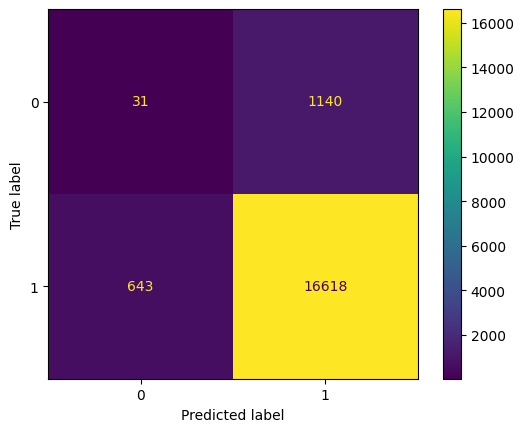

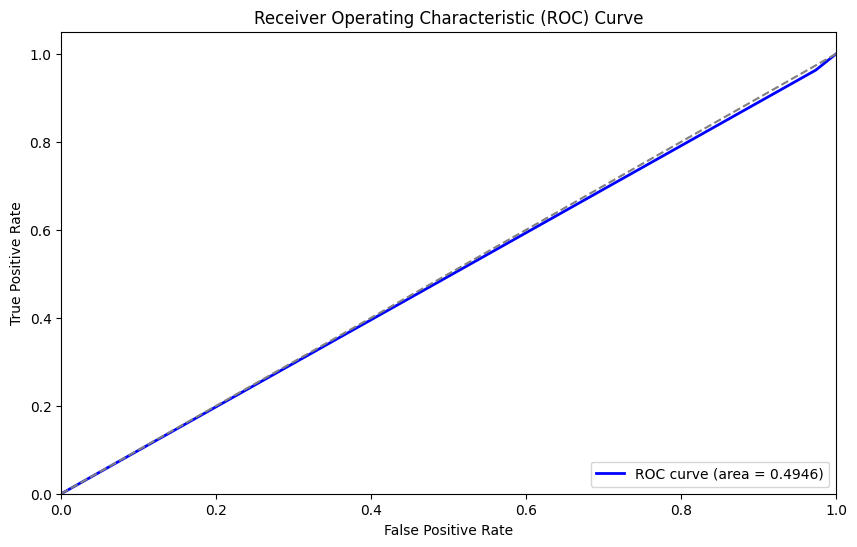

Mean Absolute Error (MAE): 0.0967
Mean Squared Error (MSE): 0.0967
Root Mean Squared Error (RMSE): 0.3110


In [59]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, roc_auc_score, mean_absolute_error, mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Dropout, Input, GRU
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame
# Create additional features
data['total_delay'] = data['carrier_delay'] + data['weather_delay'] + data['nas_delay'] + data['security_delay'] + data['late_aircraft_delay']

# Select features and target
features = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay', 'total_delay', 'carrier', 'airport']
X = data[features]
y = data['delayed']

# Identify categorical and numerical columns
categorical_cols = ['carrier', 'airport']
numerical_cols = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay', 'total_delay']

# Preprocessing for numerical data (with imputation)
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Preprocess the data
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

# Convert sparse matrix to dense matrix
X_train = X_train.toarray()
X_test = X_test.toarray()

# Reshape input data to 2D for GAN [samples, features]
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1]))

# Check for NaN values
print("NaN values in X_train:", np.isnan(X_train).sum())
print("NaN values in X_test:", np.isnan(X_test).sum())
print("NaN values in y_train:", np.isnan(y_train).sum())
print("NaN values in y_test:", np.isnan(y_test).sum())

# Define the generator model
def build_generator(input_dim, output_dim):
    model = Sequential()
    model.add(Dense(128, activation='relu', input_dim=input_dim))
    model.add(Dropout(0.3))
    model.add(Dense(256, activation='relu'))
    model.add(Dropout(0.3))
    model.add(Dense(output_dim, activation='tanh'))
    return model

# Define the discriminator model
def build_discriminator(input_dim):
    model = Sequential()
    model.add(Dense(256, activation='relu', input_dim=input_dim))
    model.add(Dropout(0.3))
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.3))
    model.add(Dense(1, activation='sigmoid'))
    return model

# Dimensions
input_dim = X_train.shape[1]
output_dim = X_train.shape[1]

# Build and compile the discriminator
discriminator = build_discriminator(input_dim)
discriminator.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# Build the generator
generator = build_generator(input_dim, output_dim)

# Create the GAN
z = Input(shape=(input_dim,))
gen_data = generator(z)
discriminator.trainable = False
validity = discriminator(gen_data)

gan = Model(z, validity)
gan.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy')

# Training the GAN
epochs = 1000  # Adjusted to fewer epochs
batch_size = 64
half_batch = int(batch_size / 2)

d_loss_list = []
g_loss_list = []
d_acc_list = []

for epoch in range(epochs):
    # Train the discriminator
    idx = np.random.randint(0, X_train.shape[0], half_batch)
    real_data = X_train[idx]

    noise = np.random.normal(0, 1, (half_batch, input_dim))
    gen_data = generator.predict(noise)

    d_loss_real = discriminator.train_on_batch(real_data, np.ones((half_batch, 1)))
    d_loss_fake = discriminator.train_on_batch(gen_data, np.zeros((half_batch, 1)))
    d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

    # Train the generator
    noise = np.random.normal(0, 1, (batch_size, input_dim))
    valid_y = np.array([1] * batch_size)

    g_loss = gan.train_on_batch(noise, valid_y)

    d_loss_list.append(d_loss[0])
    g_loss_list.append(g_loss)
    d_acc_list.append(100 * d_loss[1])

    # Print the progress
    if epoch % 100 == 0 or epoch == epochs - 1:
        print(f"{epoch} [D loss: {d_loss[0]}, acc.: {100 * d_loss[1]}] [G loss: {g_loss}]")

# Plotting the Discriminator and Generator losses
plt.figure(figsize=(10, 5))
plt.plot(d_loss_list, label="Discriminator Loss")
plt.plot(g_loss_list, label="Generator Loss")
plt.title("Discriminator and Generator Losses During Training")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.show()

# Plotting the Discriminator accuracy
plt.figure(figsize=(10, 5))
plt.plot(d_acc_list, label="Discriminator Accuracy")
plt.title("Discriminator Accuracy During Training")
plt.xlabel("Epoch")
plt.ylabel("Accuracy (%)")
plt.legend()
plt.show()

# Evaluating the discriminator on the training and test set
train_accuracy = discriminator.evaluate(X_train, np.ones((X_train.shape[0], 1)), verbose=0)[1]
test_accuracy = discriminator.evaluate(X_test, np.ones((X_test.shape[0], 1)), verbose=0)[1]

print(f"Training Accuracy: {train_accuracy:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

# Calculate additional performance metrics
y_pred = discriminator.predict(X_test)
y_pred = (y_pred > 0.5).astype(int)

precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = conf_matrix.ravel()
specificity = tn / (tn + fp)
roc_auc = roc_auc_score(y_test, y_pred)

print(f"Test Accuracy: {accuracy_score(y_test, y_pred):.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Specificity: {specificity:.4f}")
print(f"ROC AUC: {roc_auc:.4f}")

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)
disp.plot()
plt.show()

# Calculate ROC curve and AUC
y_pred_proba = y_pred.ravel()
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Calculate error metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")


NaN values in X_train: 0
NaN values in X_test: 0
NaN values in y_train: 0
NaN values in y_test: 0
1/1 [==============================] - 0s 57ms/step
0 [D loss: 0.8083223104476929, acc.: 31.25] [G loss: 0.6062486171722412]
1/1 [==============================] - 0s 17ms/step
100 [D loss: 0.5134013146162033, acc.: 70.3125] [G loss: 1.634495496749878]
1/1 [==============================] - 0s 17ms/step
200 [D loss: 0.48908329010009766, acc.: 67.1875] [G loss: 2.183490753173828]
1/1 [==============================] - 0s 19ms/step
300 [D loss: 0.41152480989694595, acc.: 90.625] [G loss: 2.5244803428649902]
1/1 [==============================] - 0s 18ms/step
400 [D loss: 0.42712070047855377, acc.: 93.75] [G loss: 2.223536252975464]
1/1 [==============================] - 0s 18ms/step
500 [D loss: 0.5324054658412933, acc.: 89.0625] [G loss: 1.8210935592651367]
1/1 [==============================] - 0s 17ms/step
600 [D loss: 0.6746129989624023, acc.: 54.6875] [G loss: 1.2776615619659424]
1/1 [=

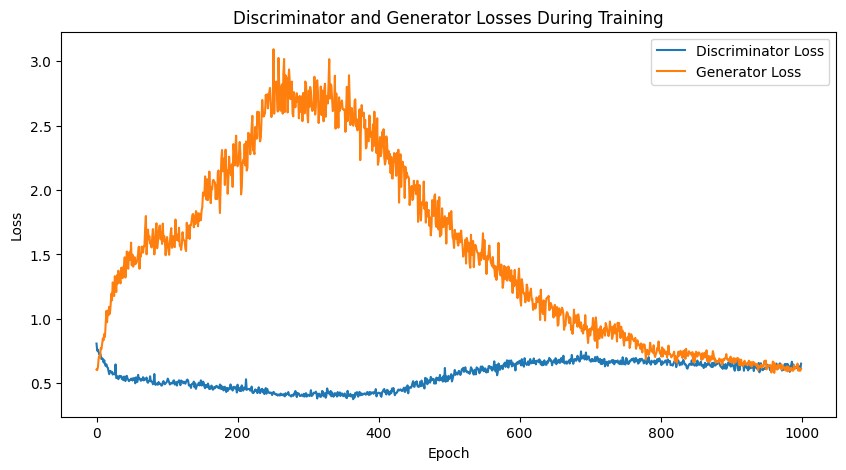

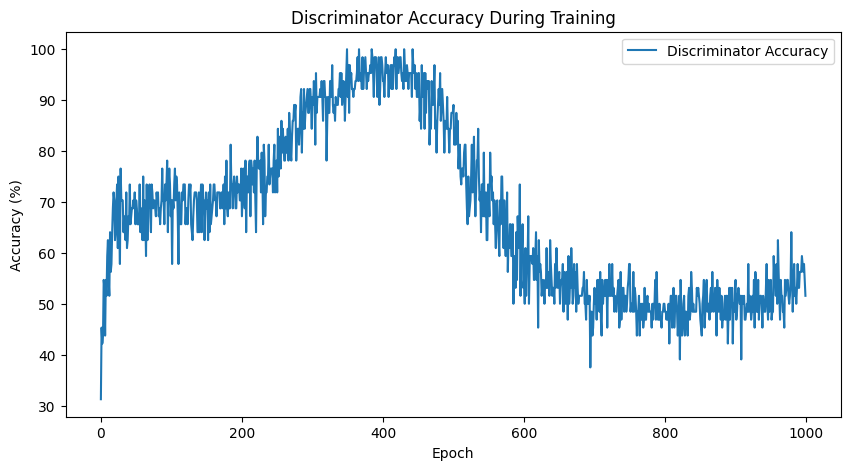

Training Accuracy: 0.9662
Test Accuracy: 0.9678
864/864 [==============================] - 1s 1ms/step
Test Accuracy: 0.9048
Precision: 0.9338
Recall: 0.9667
F1 Score: 0.9499
Specificity: 0.0156
ROC AUC: 0.4911


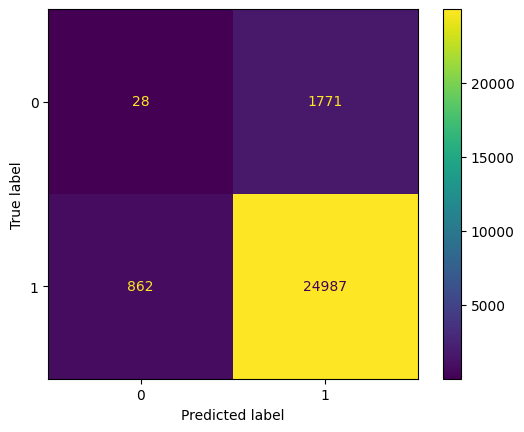

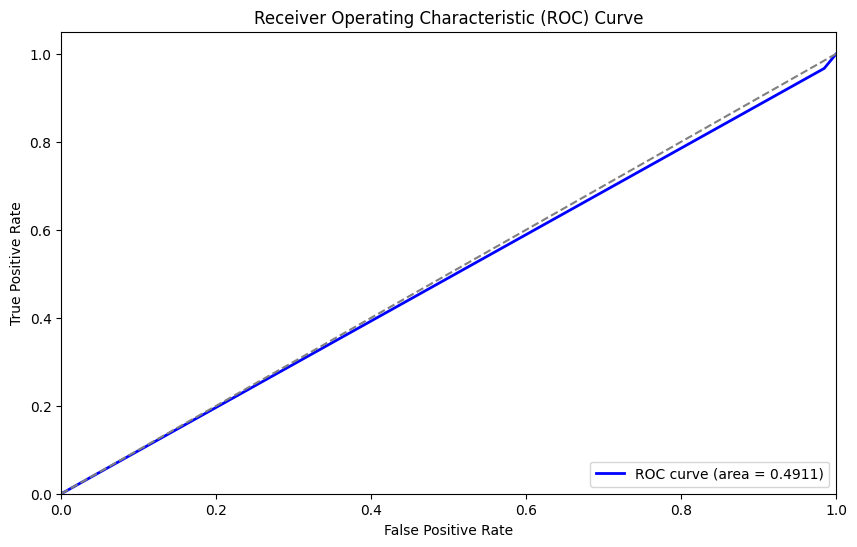

Mean Absolute Error (MAE): 0.0952
Mean Squared Error (MSE): 0.0952
Root Mean Squared Error (RMSE): 0.3086


In [60]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, roc_auc_score, mean_absolute_error, mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Dropout, Input, GRU
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame
# Create additional features
data['total_delay'] = data['carrier_delay'] + data['weather_delay'] + data['nas_delay'] + data['security_delay'] + data['late_aircraft_delay']

# Select features and target
features = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay', 'total_delay', 'carrier', 'airport']
X = data[features]
y = data['delayed']

# Identify categorical and numerical columns
categorical_cols = ['carrier', 'airport']
numerical_cols = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay', 'total_delay']

# Preprocessing for numerical data (with imputation)
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Preprocess the data
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

# Convert sparse matrix to dense matrix
X_train = X_train.toarray()
X_test = X_test.toarray()

# Reshape input data to 2D for GAN [samples, features]
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1]))

# Check for NaN values
print("NaN values in X_train:", np.isnan(X_train).sum())
print("NaN values in X_test:", np.isnan(X_test).sum())
print("NaN values in y_train:", np.isnan(y_train).sum())
print("NaN values in y_test:", np.isnan(y_test).sum())

# Define the generator model
def build_generator(input_dim, output_dim):
    model = Sequential()
    model.add(Dense(128, activation='relu', input_dim=input_dim))
    model.add(Dropout(0.3))
    model.add(Dense(256, activation='relu'))
    model.add(Dropout(0.3))
    model.add(Dense(output_dim, activation='tanh'))
    return model

# Define the discriminator model
def build_discriminator(input_dim):
    model = Sequential()
    model.add(Dense(256, activation='relu', input_dim=input_dim))
    model.add(Dropout(0.3))
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.3))
    model.add(Dense(1, activation='sigmoid'))
    return model

# Dimensions
input_dim = X_train.shape[1]
output_dim = X_train.shape[1]

# Build and compile the discriminator
discriminator = build_discriminator(input_dim)
discriminator.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# Build the generator
generator = build_generator(input_dim, output_dim)

# Create the GAN
z = Input(shape=(input_dim,))
gen_data = generator(z)
discriminator.trainable = False
validity = discriminator(gen_data)

gan = Model(z, validity)
gan.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy')

# Training the GAN
epochs = 1000  # Adjusted to fewer epochs
batch_size = 64
half_batch = int(batch_size / 2)

d_loss_list = []
g_loss_list = []
d_acc_list = []

for epoch in range(epochs):
    # Train the discriminator
    idx = np.random.randint(0, X_train.shape[0], half_batch)
    real_data = X_train[idx]

    noise = np.random.normal(0, 1, (half_batch, input_dim))
    gen_data = generator.predict(noise)

    d_loss_real = discriminator.train_on_batch(real_data, np.ones((half_batch, 1)))
    d_loss_fake = discriminator.train_on_batch(gen_data, np.zeros((half_batch, 1)))
    d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

    # Train the generator
    noise = np.random.normal(0, 1, (batch_size, input_dim))
    valid_y = np.array([1] * batch_size)

    g_loss = gan.train_on_batch(noise, valid_y)

    d_loss_list.append(d_loss[0])
    g_loss_list.append(g_loss)
    d_acc_list.append(100 * d_loss[1])

    # Print the progress
    if epoch % 100 == 0 or epoch == epochs - 1:
        print(f"{epoch} [D loss: {d_loss[0]}, acc.: {100 * d_loss[1]}] [G loss: {g_loss}]")

# Plotting the Discriminator and Generator losses
plt.figure(figsize=(10, 5))
plt.plot(d_loss_list, label="Discriminator Loss")
plt.plot(g_loss_list, label="Generator Loss")
plt.title("Discriminator and Generator Losses During Training")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.show()

# Plotting the Discriminator accuracy
plt.figure(figsize=(10, 5))
plt.plot(d_acc_list, label="Discriminator Accuracy")
plt.title("Discriminator Accuracy During Training")
plt.xlabel("Epoch")
plt.ylabel("Accuracy (%)")
plt.legend()
plt.show()

# Evaluating the discriminator on the training and test set
train_accuracy = discriminator.evaluate(X_train, np.ones((X_train.shape[0], 1)), verbose=0)[1]
test_accuracy = discriminator.evaluate(X_test, np.ones((X_test.shape[0], 1)), verbose=0)[1]

print(f"Training Accuracy: {train_accuracy:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

# Calculate additional performance metrics
y_pred = discriminator.predict(X_test)
y_pred = (y_pred > 0.5).astype(int)

precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = conf_matrix.ravel()
specificity = tn / (tn + fp)
roc_auc = roc_auc_score(y_test, y_pred)

print(f"Test Accuracy: {accuracy_score(y_test, y_pred):.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Specificity: {specificity:.4f}")
print(f"ROC AUC: {roc_auc:.4f}")

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)
disp.plot()
plt.show()

# Calculate ROC curve and AUC
y_pred_proba = y_pred.ravel()
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Calculate error metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")


NaN values in X_train: 0
NaN values in X_test: 0
NaN values in y_train: 0
NaN values in y_test: 0
1/1 [==============================] - 0s 57ms/step
0 [D loss: 0.7617587149143219, acc.: 43.75] [G loss: 0.5895160436630249]
1/1 [==============================] - 0s 17ms/step
100 [D loss: 0.5079071223735809, acc.: 78.125] [G loss: 1.3729197978973389]
1/1 [==============================] - 0s 17ms/step
200 [D loss: 0.4378766417503357, acc.: 75.0] [G loss: 2.1250693798065186]
1/1 [==============================] - 0s 17ms/step
300 [D loss: 0.41196923702955246, acc.: 82.8125] [G loss: 2.6086173057556152]
1/1 [==============================] - 0s 18ms/step
400 [D loss: 0.417089506983757, acc.: 98.4375] [G loss: 2.163738489151001]
1/1 [==============================] - 0s 17ms/step
500 [D loss: 0.5660591721534729, acc.: 81.25] [G loss: 1.6132025718688965]
1/1 [==============================] - 0s 18ms/step
600 [D loss: 0.6586739122867584, acc.: 54.6875] [G loss: 1.0938632488250732]
1/1 [=====

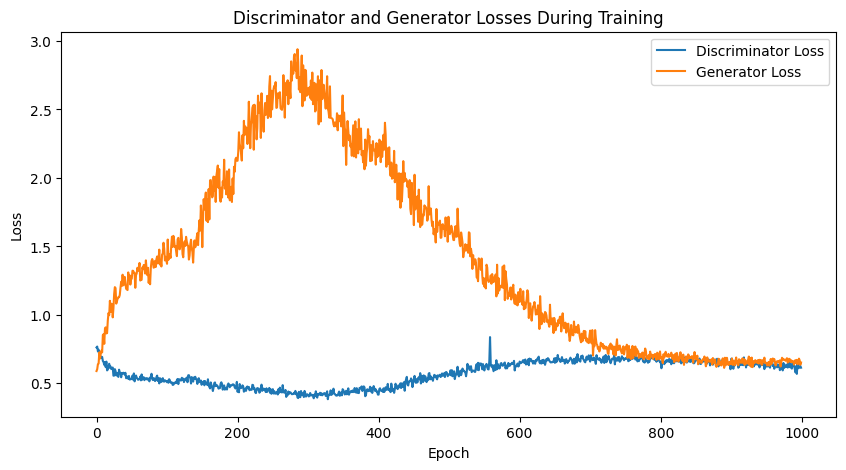

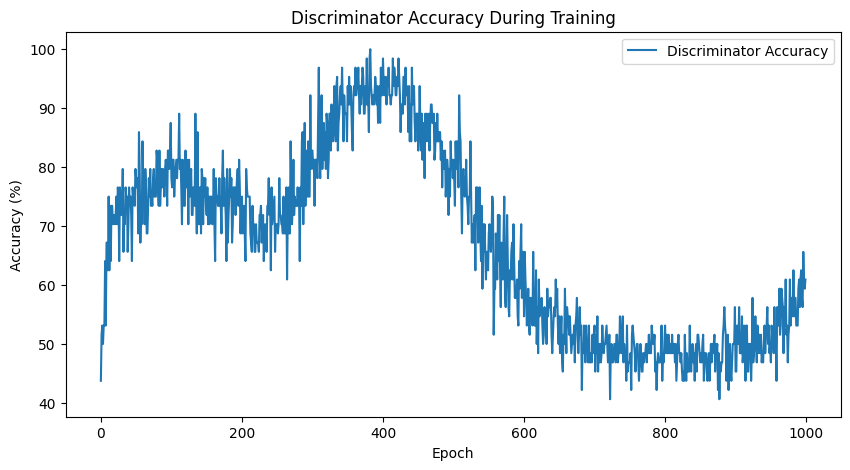

Training Accuracy: 0.9762
Test Accuracy: 0.9781
1152/1152 [==============================] - 2s 1ms/step
Test Accuracy: 0.9135
Precision: 0.9336
Recall: 0.9770
F1 Score: 0.9548
Specificity: 0.0058
ROC AUC: 0.4914


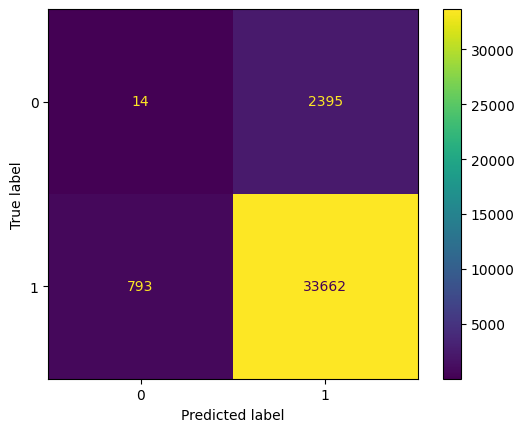

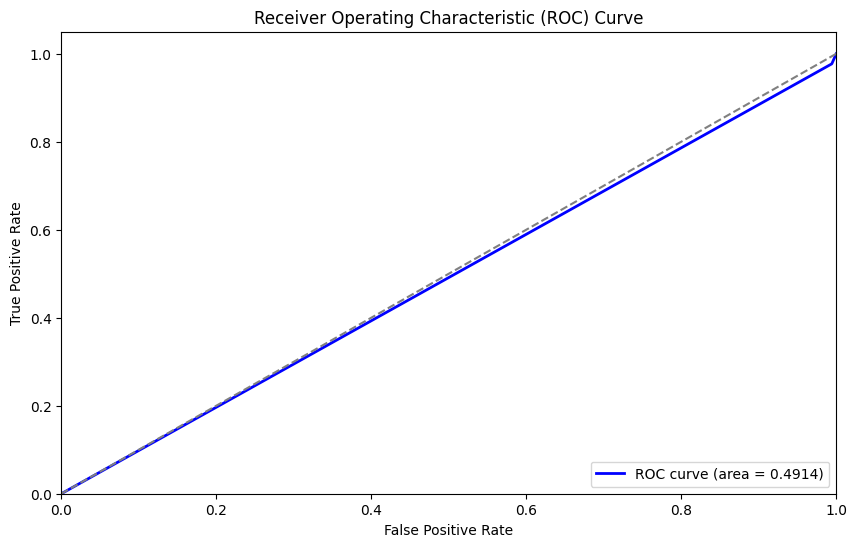

Mean Absolute Error (MAE): 0.0865
Mean Squared Error (MSE): 0.0865
Root Mean Squared Error (RMSE): 0.2941


In [61]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, roc_auc_score, mean_absolute_error, mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Dropout, Input, GRU
from tensorflow.keras.optimizers import Adam
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame
# Create additional features
data['total_delay'] = data['carrier_delay'] + data['weather_delay'] + data['nas_delay'] + data['security_delay'] + data['late_aircraft_delay']

# Select features and target
features = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay', 'total_delay', 'carrier', 'airport']
X = data[features]
y = data['delayed']

# Identify categorical and numerical columns
categorical_cols = ['carrier', 'airport']
numerical_cols = ['carrier_delay', 'weather_delay', 'nas_delay', 'security_delay', 'late_aircraft_delay', 'total_delay']

# Preprocessing for numerical data (with imputation)
numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

# Preprocessing for categorical data
categorical_transformer = OneHotEncoder(handle_unknown='ignore')

# Bundle preprocessing for numerical and categorical data
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)])

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.4, random_state=42)

# Preprocess the data
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

# Convert sparse matrix to dense matrix
X_train = X_train.toarray()
X_test = X_test.toarray()

# Reshape input data to 2D for GAN [samples, features]
X_train = X_train.reshape((X_train.shape[0], X_train.shape[1]))
X_test = X_test.reshape((X_test.shape[0], X_test.shape[1]))

# Check for NaN values
print("NaN values in X_train:", np.isnan(X_train).sum())
print("NaN values in X_test:", np.isnan(X_test).sum())
print("NaN values in y_train:", np.isnan(y_train).sum())
print("NaN values in y_test:", np.isnan(y_test).sum())

# Define the generator model
def build_generator(input_dim, output_dim):
    model = Sequential()
    model.add(Dense(128, activation='relu', input_dim=input_dim))
    model.add(Dropout(0.3))
    model.add(Dense(256, activation='relu'))
    model.add(Dropout(0.3))
    model.add(Dense(output_dim, activation='tanh'))
    return model

# Define the discriminator model
def build_discriminator(input_dim):
    model = Sequential()
    model.add(Dense(256, activation='relu', input_dim=input_dim))
    model.add(Dropout(0.3))
    model.add(Dense(128, activation='relu'))
    model.add(Dropout(0.3))
    model.add(Dense(1, activation='sigmoid'))
    return model

# Dimensions
input_dim = X_train.shape[1]
output_dim = X_train.shape[1]

# Build and compile the discriminator
discriminator = build_discriminator(input_dim)
discriminator.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# Build the generator
generator = build_generator(input_dim, output_dim)

# Create the GAN
z = Input(shape=(input_dim,))
gen_data = generator(z)
discriminator.trainable = False
validity = discriminator(gen_data)

gan = Model(z, validity)
gan.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy')

# Training the GAN
epochs = 1000  # Adjusted to fewer epochs
batch_size = 64
half_batch = int(batch_size / 2)

d_loss_list = []
g_loss_list = []
d_acc_list = []

for epoch in range(epochs):
    # Train the discriminator
    idx = np.random.randint(0, X_train.shape[0], half_batch)
    real_data = X_train[idx]

    noise = np.random.normal(0, 1, (half_batch, input_dim))
    gen_data = generator.predict(noise)

    d_loss_real = discriminator.train_on_batch(real_data, np.ones((half_batch, 1)))
    d_loss_fake = discriminator.train_on_batch(gen_data, np.zeros((half_batch, 1)))
    d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

    # Train the generator
    noise = np.random.normal(0, 1, (batch_size, input_dim))
    valid_y = np.array([1] * batch_size)

    g_loss = gan.train_on_batch(noise, valid_y)

    d_loss_list.append(d_loss[0])
    g_loss_list.append(g_loss)
    d_acc_list.append(100 * d_loss[1])

    # Print the progress
    if epoch % 100 == 0 or epoch == epochs - 1:
        print(f"{epoch} [D loss: {d_loss[0]}, acc.: {100 * d_loss[1]}] [G loss: {g_loss}]")

# Plotting the Discriminator and Generator losses
plt.figure(figsize=(10, 5))
plt.plot(d_loss_list, label="Discriminator Loss")
plt.plot(g_loss_list, label="Generator Loss")
plt.title("Discriminator and Generator Losses During Training")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.show()

# Plotting the Discriminator accuracy
plt.figure(figsize=(10, 5))
plt.plot(d_acc_list, label="Discriminator Accuracy")
plt.title("Discriminator Accuracy During Training")
plt.xlabel("Epoch")
plt.ylabel("Accuracy (%)")
plt.legend()
plt.show()

# Evaluating the discriminator on the training and test set
train_accuracy = discriminator.evaluate(X_train, np.ones((X_train.shape[0], 1)), verbose=0)[1]
test_accuracy = discriminator.evaluate(X_test, np.ones((X_test.shape[0], 1)), verbose=0)[1]

print(f"Training Accuracy: {train_accuracy:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")

# Calculate additional performance metrics
y_pred = discriminator.predict(X_test)
y_pred = (y_pred > 0.5).astype(int)

precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
tn, fp, fn, tp = conf_matrix.ravel()
specificity = tn / (tn + fp)
roc_auc = roc_auc_score(y_test, y_pred)

print(f"Test Accuracy: {accuracy_score(y_test, y_pred):.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")
print(f"Specificity: {specificity:.4f}")
print(f"ROC AUC: {roc_auc:.4f}")

# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix)
disp.plot()
plt.show()

# Calculate ROC curve and AUC
y_pred_proba = y_pred.ravel()
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (area = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Calculate error metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)

print(f"Mean Absolute Error (MAE): {mae:.4f}")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
